In [5]:
import warnings

warnings.filterwarnings("ignore")

import numpy as np
import cv2
import os
import csv
import gc
import random
import matplotlib.pyplot as plt
from tqdm import tqdm
from glob import glob
from pathlib import Path
import tensorflow as tf
from tensorflow.keras.applications import *
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow.keras.backend as K
from sklearn.model_selection import train_test_split

In [6]:
from scipy.stats import norm
from sklearn.metrics import classification_report, confusion_matrix
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

In [ ]:
!nvidia-smi

Mon Dec 18 12:08:46 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   67C    P0              27W /  70W |   1181MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [7]:
def plot_sample(X):

    
    nb_rows = 3
    nb_cols = 3
    fig, axs = plt.subplots(nb_rows, nb_cols, figsize=(6, 6))

    for i in range(0, nb_rows):
        for j in range(0, nb_cols):
            axs[i, j].xaxis.set_ticklabels([])
            axs[i, j].yaxis.set_ticklabels([])
            axs[i, j].imshow(X[random.randint(0, X.shape[0] - 1)])

def read_data(path_list, im_size=(224, 224)):
       
    X = []
    y = []
   
    tag2idx = {tag.split(os.path.sep)[-1]: i for i, tag in enumerate(path_list)}

    for path in path_list:
        for im_file in tqdm(glob(path + "*/*")):  
            try:
               
                label = im_file.split(os.path.sep)[-2]
                im = cv2.imread(im_file, cv2.IMREAD_COLOR)
              
                im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
               
                im = cv2.resize(im, im_size, interpolation=cv2.INTER_AREA)
                X.append(im)
                y.append(tag2idx[label]) 
            except Exception as e:
                
                print("Not a picture")

    X = np.array(X)  
    y = np.eye(len(np.unique(y)))[y].astype(np.uint8)

    return X, y

def get_callbacks(weights_file, patience, lr_factor):
       
    return [

        ModelCheckpoint(
            filepath=weights_file,
            monitor="val_accuracy",
            mode="max",
            save_best_only=True,
            save_weights_only=True,
        ),
        
        EarlyStopping(monitor="val_loss", mode="min", patience=patience, verbose=1),
               
    ]

def plot_performances(performances):
   
    
    plt.title("Validation Accuracy vs. Number of Training Epochs")
    plt.xlabel("Training Epochs")
    plt.ylabel("Validation Accuracy")
    for performance in performances:
        plt.plot(
            range(1, len(performance[1]) + 1), performance[1], label=performance[0]
        )
    plt.ylim((0.5, 1.05))
    plt.xticks(np.arange(1, NUM_EPOCHS + 1, 5.0))

#    plt.xticks(np.arange(1, NUM_EPOCHS + 1, 1.0))
    plt.legend()
    plt.show()

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
INPUT_SHAPE = (224, 224, 3)
IM_SIZE = (224, 224)
NUM_EPOCHS = 25
BATCH_SIZE = 4
TEST_SPLIT = 0.2
VAL_SPLIT = 0.2
RANDOM_STATE = 2021
WEIGHTS_FILE = "weights4weeds.h5"  


PATH_LIST = [
    "/content/drive/MyDrive/WeedDS/False_Amaranth",
    "/content/drive/MyDrive/WeedDS/Horse_Purslane",
    "/content/drive/MyDrive/WeedDS/Purple_Nutsedge",
    "/content/drive/MyDrive/WeedDS/Wild_Cucurbit",

]


In [7]:
true_labels = ["'False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit'"]

In [27]:
fine_tune_epochs = 25
total_epochs =  NUM_EPOCHS + fine_tune_epochs
total_epochs

15

In [8]:
i = 0
for path in PATH_LIST:
  
    PATH_LIST[i] = str(
        Path(Path.cwd()).parents[0].joinpath("/Users/HP/Downloads/try/").joinpath(path)
    )
    i += 1
X, y = read_data(PATH_LIST, IM_SIZE)

100%|██████████| 142/142 [00:17<00:00,  8.32it/s]


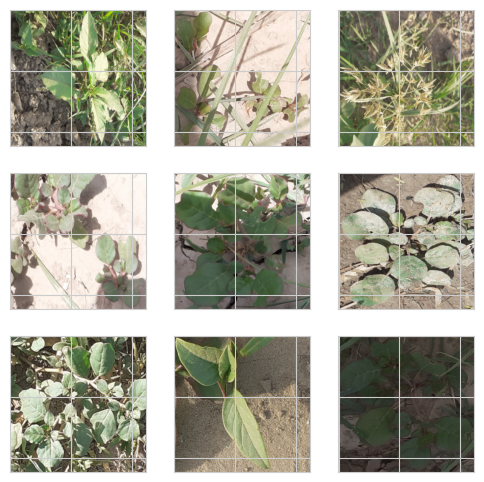

In [ ]:
plot_sample(X)

In [ ]:
%matplotlib inline
sns.set_style('whitegrid')

In [20]:
def get_architecture(y, Model_version, as_feature_extractor):
   
    

    if Model_version == "EfficientNetV2B0":
        feature_extractor = EfficientNetV2B0(
            weights="imagenet",  
            include_top=False,  
            input_shape=INPUT_SHAPE,
        )
    elif Model_version == "EfficientNetV2B0":
        feature_extractor = EfficientNetV2B0(
            weights="imagenet",  
            include_top=False,  
            input_shape=INPUT_SHAPE,
        )


    elif Model_version == "EfficientNetV2B1":
        feature_extractor = EfficientNetV2B1(
            weights="imagenet",  
            include_top=False, 
            input_shape=INPUT_SHAPE,
            )
    elif Model_version == "EfficientNetV2B2":
        feature_extractor = EfficientNetV2B2(
            weights="imagenet",  
            include_top=False,  
            input_shape=INPUT_SHAPE,
            )
    elif Model_version == "EfficientNetV2B3":
        feature_extractor = EfficientNetV2B3(
            weights="imagenet",  
            include_top=False,  
            input_shape=INPUT_SHAPE,
            )
    elif Model_version == "MobileNetV2":
        feature_extractor = MobileNetV2(
            weights="imagenet",  
            include_top=False,  
            input_shape=INPUT_SHAPE,
        )
    elif Model_version == "EfficientNetB0":
        feature_extractor = EfficientNetB0(
            weights="imagenet",  
            include_top=False,  
            input_shape=INPUT_SHAPE,
        )
    elif Model_version == "EfficientNetB1":
        feature_extractor = EfficientNetB1(
            weights="imagenet",  
            include_top=False,  
            input_shape=INPUT_SHAPE,
        )
    elif Model_version == "EfficientNetB2":
        feature_extractor = EfficientNetB2(
            weights="imagenet",
            include_top=False,  
            input_shape=INPUT_SHAPE,
        )
    elif Model_version == "EfficientNetB3":
        feature_extractor = EfficientNetB3(
            weights="imagenet",  
            include_top=False, 
            input_shape=INPUT_SHAPE,
        )
    elif Model_version == "EfficientNetB4":
        feature_extractor = EfficientNetB4(
            weights="imagenet",  
            include_top=False,  
            input_shape=INPUT_SHAPE,
            )
    elif Model_version == "DenseNet121":
        feature_extractor = DenseNet121(
            weights="imagenet",  
            include_top=False, 
            input_shape=INPUT_SHAPE,
            )
    elif Model_version == "DenseNet169":
        feature_extractor = DenseNet169(
            weights="imagenet",  
            include_top=False,  
            input_shape=INPUT_SHAPE,
            )
    elif Model_version == "DenseNet201":
        feature_extractor = DenseNet201(
            weights="imagenet",  
            include_top=False,  
            input_shape=INPUT_SHAPE,
            )
    elif Model_version == "MobileNet":
        feature_extractor = MobileNet(
            weights="imagenet",  
            include_top=False,  
            input_shape=INPUT_SHAPE,
        )

    elif Model_version == "NASNetMobile":
        feature_extractor = NASNetMobile(
            weights="imagenet",  
            include_top=False, 
            input_shape=INPUT_SHAPE,
            )

    elif Model_version == "EfficientNetV2S":
        feature_extractor = EfficientNetV2S(
            weights="imagenet", 
            include_top=False,  
            input_shape=INPUT_SHAPE,
            )


    elif Model_version == "InceptionV3":
        feature_extractor = InceptionV3(
            weights="imagenet",  
            include_top=False,  
            input_shape=INPUT_SHAPE,
            )
    elif Model_version == "Xception":
        feature_extractor = Xception(
            weights="imagenet", 
            include_top=False,  
            input_shape=INPUT_SHAPE,
        )

        
    elif Model_version == "ResNet50V2":
        feature_extractor = ResNet50V2(
            weights="imagenet",  
            include_top=False,  
            input_shape=INPUT_SHAPE,
        )
    elif Model_version == "ResNet50":
        feature_extractor = ResNet50(
            weights="imagenet",  
            include_top=False,  
            input_shape=INPUT_SHAPE,
        )
    elif Model_version == "ResNet18":
        feature_extractor = ResNet18(
            weights="imagenet",  
            include_top=False,  
            input_shape=INPUT_SHAPE,
        )        
    elif Model_version == "MobileNetV3Large":
        feature_extractor = MobileNetV3Large(
            weights="imagenet", 
            include_top=False, 
            input_shape=INPUT_SHAPE,
        )
    elif Model_version == "MobileNetV3Small":
        feature_extractor = MobileNetV3Small(
            weights="imagenet", 
            include_top=False,  
            input_shape=INPUT_SHAPE,
        )   
        
        
        
   
    if as_feature_extractor:
        feature_extractor.trainable = False
    else:
        feature_extractor.trainable = True  

    
    x = layers.GlobalAveragePooling2D(name="pool")(
        feature_extractor.output
    )  
    x = layers.Dense(units=64, activation="relu")(x)  
    
    x = layers.Dropout(0.3)(x)  # Regularize with dropout.
    out = layers.Dense(units=y.shape[1], activation="softmax")(x)
    model = Model(feature_extractor.input, out)  # Final model

   
    base_learning_rate = 1e-2
    model.compile(
        loss="categorical_crossentropy",
        optimizer=tf.keras.optimizers.SGD(lr=base_learning_rate),
        metrics=["accuracy"],
    )

    return model

In [21]:
X_prep = tf.keras.applications.mobilenet_v3.preprocess_input(X)

X_train, X_test, y_train, y_test = train_test_split(
    X_prep,
    y,
    test_size=TEST_SPLIT,
    shuffle=True,
    stratify=y,
    random_state=RANDOM_STATE
)

X_train, X_val, y_train, y_val = train_test_split(
    X_train,
    y_train,
    test_size=VAL_SPLIT,
    shuffle=True,
    stratify=y_train,
    random_state=RANDOM_STATE,
)

In [11]:
model = get_architecture(y, Model_version="MobileNetV2", as_feature_extractor=True)

In [12]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                             

 block_3_expand_relu (ReLU)     (None, 56, 56, 144)  0           ['block_3_expand_BN[0][0]']      
                                                                                                  
 block_3_pad (ZeroPadding2D)    (None, 57, 57, 144)  0           ['block_3_expand_relu[0][0]']    
                                                                                                  
 block_3_depthwise (DepthwiseCo  (None, 28, 28, 144)  1296       ['block_3_pad[0][0]']            
 nv2D)                                                                                            
                                                                                                  
 block_3_depthwise_BN (BatchNor  (None, 28, 28, 144)  576        ['block_3_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_3_d

 lization)                                                                                        
                                                                                                  
 block_7_expand (Conv2D)        (None, 14, 14, 384)  24576       ['block_6_project_BN[0][0]']     
                                                                                                  
 block_7_expand_BN (BatchNormal  (None, 14, 14, 384)  1536       ['block_7_expand[0][0]']         
 ization)                                                                                         
                                                                                                  
 block_7_expand_relu (ReLU)     (None, 14, 14, 384)  0           ['block_7_expand_BN[0][0]']      
                                                                                                  
 block_7_depthwise (DepthwiseCo  (None, 14, 14, 384)  3456       ['block_7_expand_relu[0][0]']    
 nv2D)    

                                                                                                  
 block_10_depthwise_relu (ReLU)  (None, 14, 14, 384)  0          ['block_10_depthwise_BN[0][0]']  
                                                                                                  
 block_10_project (Conv2D)      (None, 14, 14, 96)   36864       ['block_10_depthwise_relu[0][0]']
                                                                                                  
 block_10_project_BN (BatchNorm  (None, 14, 14, 96)  384         ['block_10_project[0][0]']       
 alization)                                                                                       
                                                                                                  
 block_11_expand (Conv2D)       (None, 14, 14, 576)  55296       ['block_10_project_BN[0][0]']    
                                                                                                  
 block_11_

 block_14_depthwise (DepthwiseC  (None, 7, 7, 960)   8640        ['block_14_expand_relu[0][0]']   
 onv2D)                                                                                           
                                                                                                  
 block_14_depthwise_BN (BatchNo  (None, 7, 7, 960)   3840        ['block_14_depthwise[0][0]']     
 rmalization)                                                                                     
                                                                                                  
 block_14_depthwise_relu (ReLU)  (None, 7, 7, 960)   0           ['block_14_depthwise_BN[0][0]']  
                                                                                                  
 block_14_project (Conv2D)      (None, 7, 7, 160)    153600      ['block_14_depthwise_relu[0][0]']
                                                                                                  
 block_14_

In [16]:

history_MobileNetV2_fe = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=NUM_EPOCHS,
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, NUM_EPOCHS // 2, 0.25),
)

#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final MobileNetV2 (Feature Extraction) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 1/5
10/10 [==============================] - 3s 286ms/step - loss: 0.9747 - accuracy: 0.6316 - val_loss: 0.9830 - val_accuracy: 0.5000
Epoch 2/5
10/10 [==============================] - 3s 281ms/step - loss: 0.9245 - accuracy: 0.6053 - val_loss: 0.8690 - val_accuracy: 0.7000
Epoch 3/5
10/10 [==============================] - 2s 201ms/step - loss: 0.7328 - accuracy: 0.7105 - val_loss: 0.8757 - val_accuracy: 0.6000
Epoch 4/5
10/10 [==============================] - 2s 201ms/step - loss: 0.7144 - accuracy: 0.7632 - val_loss: 0.8421 - val_accuracy: 0.7000
Epoch 5/5
10/10 [==============================] - 2s 208ms/step - loss: 0.6628 - accuracy: 0.7632 - val_loss: 0.7713 - val_accuracy: 0.6000
************************************************************************
Final MobileNetV2 (Feature Extraction) Accuracy: 0.5833333134651184
************************************************************************


In [18]:
history_MobileNetV2_fe.history

{'loss': [0.9747427701950073,
  0.9245221018791199,
  0.73284512758255,
  0.7143744230270386,
  0.6628212928771973],
 'accuracy': [0.6315789222717285,
  0.6052631735801697,
  0.7105262875556946,
  0.7631579041481018,
  0.7631579041481018],
 'val_loss': [0.9830174446105957,
  0.8690437078475952,
  0.8757094144821167,
  0.8420993685722351,
  0.7713056206703186],
 'val_accuracy': [0.5,
  0.699999988079071,
  0.6000000238418579,
  0.699999988079071,
  0.6000000238418579]}

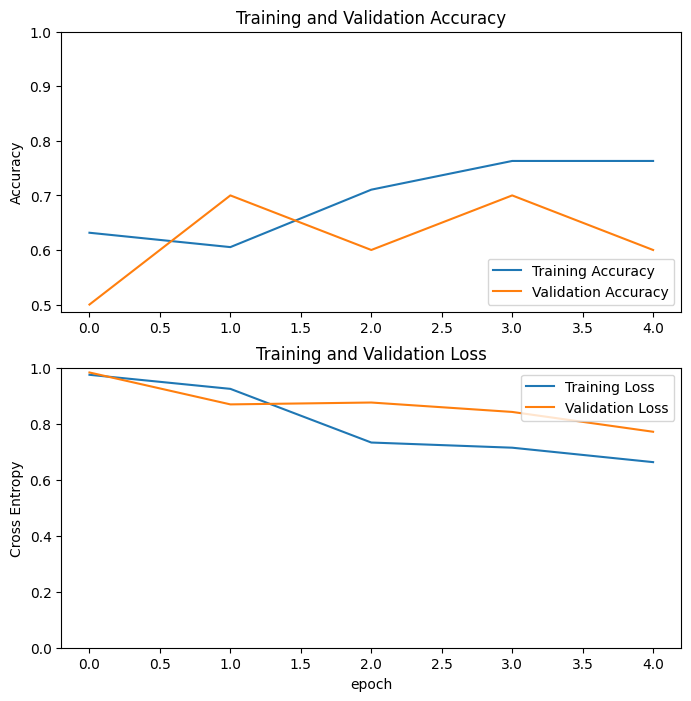

In [32]:
acc = history_MobileNetV2_fe.history['accuracy']
val_acc = history_MobileNetV2_fe.history['val_accuracy']

loss = history_MobileNetV2_fe.history['loss']
val_loss = history_MobileNetV2_fe.history['val_loss']

In [60]:
model = get_architecture(y, Model_version="MobileNetV2", as_feature_extractor=False)

In [25]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                           

 block_3_expand_relu (ReLU)     (None, 56, 56, 144)  0           ['block_3_expand_BN[0][0]']      
                                                                                                  
 block_3_pad (ZeroPadding2D)    (None, 57, 57, 144)  0           ['block_3_expand_relu[0][0]']    
                                                                                                  
 block_3_depthwise (DepthwiseCo  (None, 28, 28, 144)  1296       ['block_3_pad[0][0]']            
 nv2D)                                                                                            
                                                                                                  
 block_3_depthwise_BN (BatchNor  (None, 28, 28, 144)  576        ['block_3_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_3_d

 lization)                                                                                        
                                                                                                  
 block_7_expand (Conv2D)        (None, 14, 14, 384)  24576       ['block_6_project_BN[0][0]']     
                                                                                                  
 block_7_expand_BN (BatchNormal  (None, 14, 14, 384)  1536       ['block_7_expand[0][0]']         
 ization)                                                                                         
                                                                                                  
 block_7_expand_relu (ReLU)     (None, 14, 14, 384)  0           ['block_7_expand_BN[0][0]']      
                                                                                                  
 block_7_depthwise (DepthwiseCo  (None, 14, 14, 384)  3456       ['block_7_expand_relu[0][0]']    
 nv2D)    

                                                                                                  
 block_10_depthwise_relu (ReLU)  (None, 14, 14, 384)  0          ['block_10_depthwise_BN[0][0]']  
                                                                                                  
 block_10_project (Conv2D)      (None, 14, 14, 96)   36864       ['block_10_depthwise_relu[0][0]']
                                                                                                  
 block_10_project_BN (BatchNorm  (None, 14, 14, 96)  384         ['block_10_project[0][0]']       
 alization)                                                                                       
                                                                                                  
 block_11_expand (Conv2D)       (None, 14, 14, 576)  55296       ['block_10_project_BN[0][0]']    
                                                                                                  
 block_11_

 block_14_depthwise (DepthwiseC  (None, 7, 7, 960)   8640        ['block_14_expand_relu[0][0]']   
 onv2D)                                                                                           
                                                                                                  
 block_14_depthwise_BN (BatchNo  (None, 7, 7, 960)   3840        ['block_14_depthwise[0][0]']     
 rmalization)                                                                                     
                                                                                                  
 block_14_depthwise_relu (ReLU)  (None, 7, 7, 960)   0           ['block_14_depthwise_BN[0][0]']  
                                                                                                  
 block_14_project (Conv2D)      (None, 7, 7, 160)    153600      ['block_14_depthwise_relu[0][0]']
                                                                                                  
 block_14_

In [30]:
history_MobileNetV2_ft = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=total_epochs,
    initial_epoch = history_MobileNetV2_fe.epoch[-1],
    
    
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, total_epochs // 2, 0.25),
)

#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final EfficientNetB0 (Fine Tune) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 5/15
10/10 [==============================] - 14s 948ms/step - loss: 1.4189 - accuracy: 0.3684 - val_loss: 1.4031 - val_accuracy: 0.3000
Epoch 6/15
10/10 [==============================] - 8s 843ms/step - loss: 0.8484 - accuracy: 0.6842 - val_loss: 1.2818 - val_accuracy: 0.5000
Epoch 7/15
10/10 [==============================] - 8s 758ms/step - loss: 1.0287 - accuracy: 0.6316 - val_loss: 1.4217 - val_accuracy: 0.3000
Epoch 8/15
10/10 [==============================] - 8s 787ms/step - loss: 0.4423 - accuracy: 0.8158 - val_loss: 1.4566 - val_accuracy: 0.4000
Epoch 9/15
10/10 [==============================] - 9s 927ms/step - loss: 0.3196 - accuracy: 0.8947 - val_loss: 1.5023 - val_accuracy: 0.6000
Epoch 10/15
10/10 [==============================] - 9s 867ms/step - loss: 0.1549 - accuracy: 0.9737 - val_loss: 1.5191 - val_accuracy: 0.6000
Epoch 11/15
10/10 [==============================] - 8s 784ms/step - loss: 0.2514 - accuracy: 0.9474 - val_loss: 1.8953 - val_accuracy: 0.5000
Epo

In [33]:
acc += history_MobileNetV2_ft.history['accuracy']
val_acc += history_MobileNetV2_ft.history['val_accuracy']

loss += history_MobileNetV2_ft.history['loss']
val_loss += history_MobileNetV2_ft.history['val_loss']

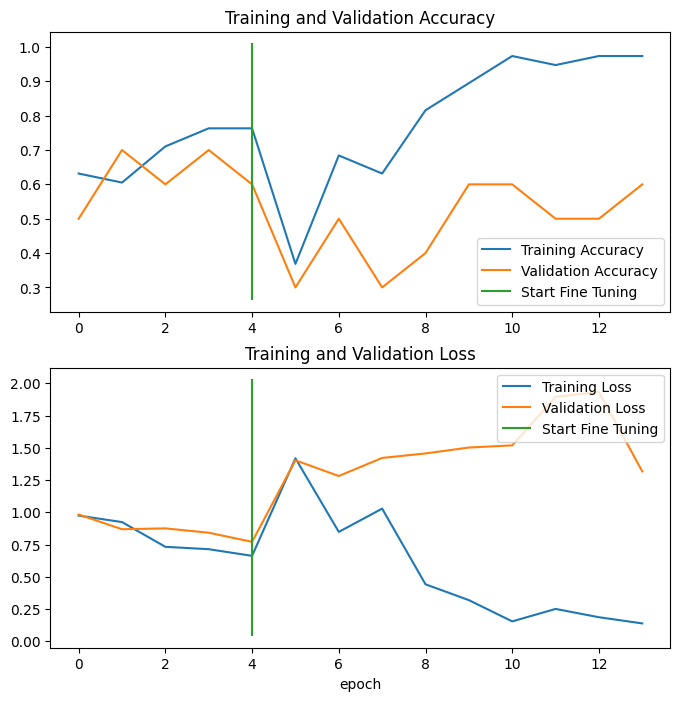

In [34]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
#plt.ylim([0.8, 1])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
#plt.ylim([0, 1.0])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [39]:
y_pred = model.predict(X_test)

1/1 [==============================] - 1s 1s/step


In [41]:
y_pred = np.argmax(y_pred, axis=1)
y_test = np.argmax(y_test, axis=1)

In [42]:
print('Classification Report MobileNetV2:\n', classification_report(y_test, y_pred))

Classification Report MobileNetV2:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         3
           1       0.00      0.00      0.00         3
           2       1.00      0.67      0.80         3
           3       0.25      0.67      0.36         3

    accuracy                           0.33        12
   macro avg       0.31      0.33      0.29        12
weighted avg       0.31      0.33      0.29        12



(array([0.5, 1.5, 2.5, 3.5]),
 [Text(0, 0.5, 'False Amaranth'),
  Text(0, 1.5, 'Horse Purslane'),
  Text(0, 2.5, 'Purple Nutsedge'),
  Text(0, 3.5, 'Wild Cucurbit')])

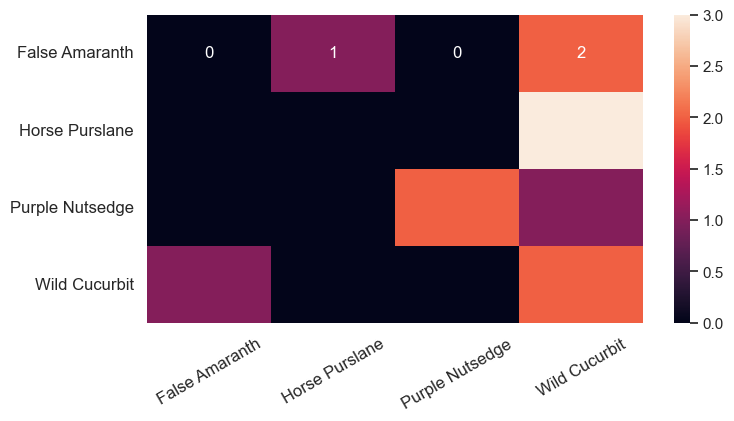

In [44]:
cm = confusion_matrix(y_test, y_pred)

class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']


plt.figure(figsize=(8, 4))
df_cm = pd.DataFrame(cm, index=class_names,
                     columns=class_names)
sns.set(font_scale=1.0)
sns.heatmap(df_cm, annot=True, annot_kws={"size": 12},  fmt='0.0f')
plt.xticks(rotation=30, fontsize=12)
plt.yticks(fontsize=12)

#plt.savefig('EV2_bo_ftNA_heatmap.png')

(array([0.5, 1.5, 2.5, 3.5]),
 [Text(0, 0.5, 'False Amaranth'),
  Text(0, 1.5, 'Horse Purslane'),
  Text(0, 2.5, 'Purple Nutsedge'),
  Text(0, 3.5, 'Wild Cucurbit')])

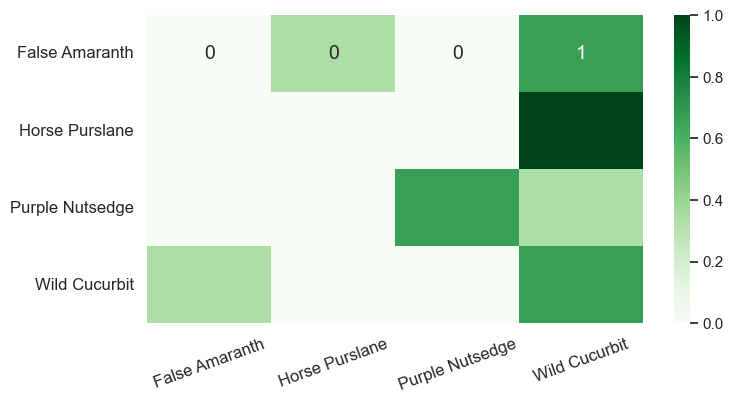

In [81]:
plt.figure(figsize=(8, 4))
conf_mat = cm / np.sum(cm, 1)
class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']

df_cm1 = pd.DataFrame(conf_mat, index=class_names,
                     columns=class_names)
#sns.set(font_scale=1.0)
sns.heatmap(df_cm1, annot=True, annot_kws={"size": 14}, cmap='Greens',  fmt='0.0f')

plt.xticks(rotation=20, fontsize=12)
plt.yticks(fontsize=12)

In [1]:
import pandas as pd

from decimal import Decimal


#df_cm1

for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], Decimal):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 2))
for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], float):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 1))            
df_cm1

NameError: name 'df_cm1' is not defined

In [40]:
#test_pred = np.argmax(model.predict(X_test), axis=1)

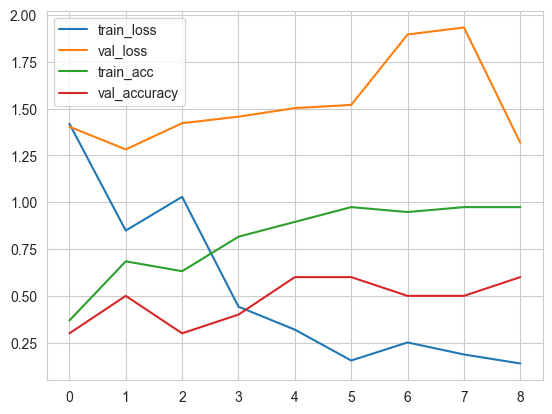

In [35]:
# plot the loss and accuracy curves
plt.plot(history_MobileNetV2_ft.history['loss'], label='train_loss')
plt.plot(history_MobileNetV2_ft.history['val_loss'], label='val_loss')
plt.plot(history_MobileNetV2_ft.history['accuracy'], label='train_acc')
plt.plot(history_MobileNetV2_ft.history['val_accuracy'], label='val_accuracy')
plt.legend()
plt.show()

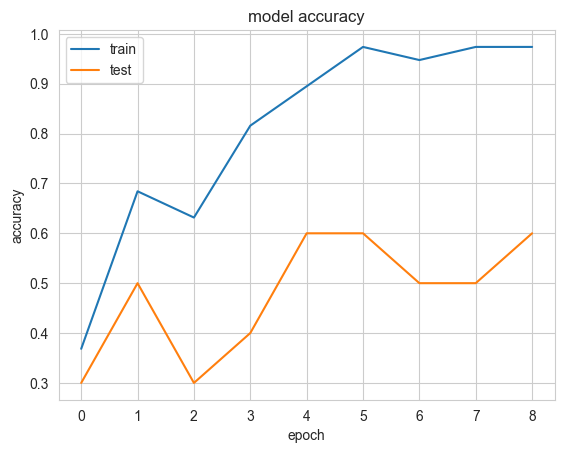

In [36]:
# summarize history for accuracy
plt.plot(history_MobileNetV2_ft.history['accuracy'])
plt.plot(history_MobileNetV2_ft.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

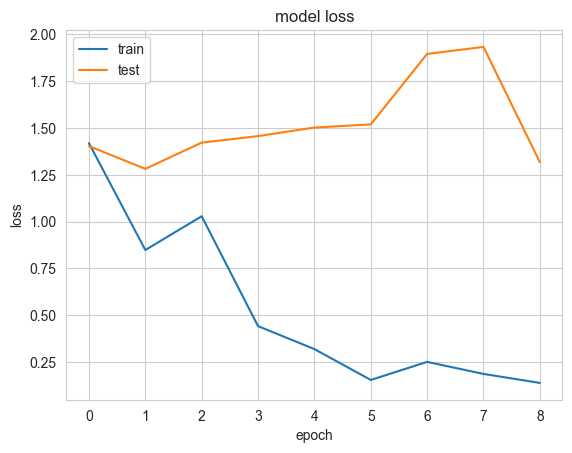

In [37]:
# summarize history for loss
plt.plot(history_MobileNetV2_ft.history['loss'])
plt.plot(history_MobileNetV2_ft.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [ ]:
cm = confusion_matrix(y_test, y_pred)

class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']


plt.figure(figsize=(8, 4))
df_cm = pd.DataFrame(cm, index=class_names,
                     columns=class_names)
sns.set(font_scale=1.0)
sns.heatmap(df_cm, annot=True, annot_kws={"size": 12},  fmt='0.0f')
plt.xticks(rotation=30, fontsize=12)
plt.yticks(fontsize=12)

#plt.savefig('EV2_bo_ftNA_heatmap.png')

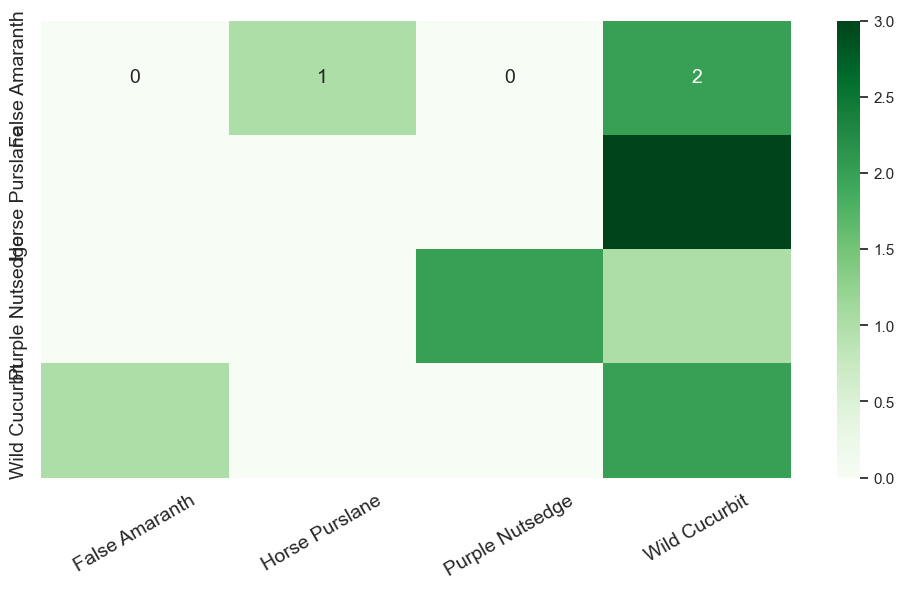

In [45]:
plt.figure(figsize=(8, 4))
conf_mat = cm / np.sum(cm, 1)
class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']

df_cm1 = pd.DataFrame(conf_mat, index=class_names,
                     columns=class_names)
#sns.set(font_scale=1.0)
sns.heatmap(df_cm1, annot=True, annot_kws={"size": 14}, cmap='Greens',  fmt='0.0f')

plt.xticks(rotation=20, fontsize=12)
plt.yticks(fontsize=12)

In [1]:
import pandas as pd

from decimal import Decimal


#df_cm1

for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], Decimal):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 2))
for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], float):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 1))            
df_cm1

NameError: name 'df_cm1' is not defined

In [ ]:
model = get_architecture(y, Model_version="EfficientNetB0", as_feature_extractor=True)

16705208/16705208 [==============================] - 2s 0us/step


In [ ]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 rescaling (Rescaling)       (None, 224, 224, 3)          0         ['input_2[0][0]']             
                                                                                                  
 normalization (Normalizati  (None, 224, 224, 3)          7         ['rescaling[0][0]']           
 on)                                                                                              
                                                                                                  
 rescaling_1 (Rescaling)     (None, 224, 224, 3)          0         ['normalization[0][0]'] 

In [ ]:
X_prep = tf.keras.applications.mobilenet_v3.preprocess_input(X)

X_train, X_test, y_train, y_test = train_test_split(
    X_prep,
    y,
    test_size=TEST_SPLIT,
    shuffle=True,
    stratify=y,
    random_state=RANDOM_STATE
)

X_train, X_val, y_train, y_val = train_test_split(
    X_train,
    y_train,
    test_size=VAL_SPLIT,
    shuffle=True,
    stratify=y_train,
    random_state=RANDOM_STATE,
)

In [ ]:

history_EfficientNetB0_fe = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=NUM_EPOCHS,
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, NUM_EPOCHS // 2, 0.25),
)
#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final EfficientNetB0 (Feature-Extractor) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 1/50
187/187 [==============================] - 36s 78ms/step - loss: 1.1106 - accuracy: 0.5429 - val_loss: 0.7441 - val_accuracy: 0.7701
Epoch 2/50
187/187 [==============================] - 12s 65ms/step - loss: 0.7133 - accuracy: 0.7198 - val_loss: 0.4422 - val_accuracy: 0.9091
Epoch 3/50
187/187 [==============================] - 11s 60ms/step - loss: 0.5620 - accuracy: 0.7922 - val_loss: 0.3393 - val_accuracy: 0.9251
Epoch 4/50
187/187 [==============================] - 10s 54ms/step - loss: 0.5024 - accuracy: 0.8418 - val_loss: 0.2985 - val_accuracy: 0.9198
Epoch 5/50
187/187 [==============================] - 11s 57ms/step - loss: 0.4290 - accuracy: 0.8365 - val_loss: 0.2813 - val_accuracy: 0.8984
Epoch 6/50
187/187 [==============================] - 11s 60ms/step - loss: 0.3675 - accuracy: 0.8700 - val_loss: 0.2133 - val_accuracy: 0.9412
Epoch 7/50
187/187 [==============================] - 11s 57ms/step - loss: 0.2898 - accuracy: 0.9035 - val_loss: 0.1818 - val_accuracy:

In [ ]:
history_EfficientNetB0_fe.history

{'loss': [1.1105834245681763,
  0.7132738828659058,
  0.5620229244232178,
  0.5023561120033264,
  0.42895716428756714,
  0.3674539029598236,
  0.28983333706855774,
  0.2856106460094452,
  0.2458965927362442,
  0.230377197265625,
  0.22801634669303894,
  0.14178065955638885,
  0.11605141311883926,
  0.13701529800891876,
  0.1385643184185028,
  0.10308525711297989,
  0.09260488301515579,
  0.09576687216758728,
  0.10167914628982544,
  0.0719241350889206,
  0.049964822828769684,
  0.07496702671051025,
  0.05911577120423317,
  0.06639817357063293,
  0.0824238657951355,
  0.055028609931468964,
  0.03959561511874199,
  0.05056234821677208,
  0.05610642954707146,
  0.04825477674603462,
  0.042155638337135315,
  0.03882403299212456,
  0.04385886341333389,
  0.032099492847919464,
  0.020723657682538033,
  0.02426481805741787,
  0.02842843532562256,
  0.03304423391819,
  0.017675284296274185,
  0.0381799153983593,
  0.02329259179532528,
  0.022166483104228973,
  0.0226422268897295,
  0.022678466

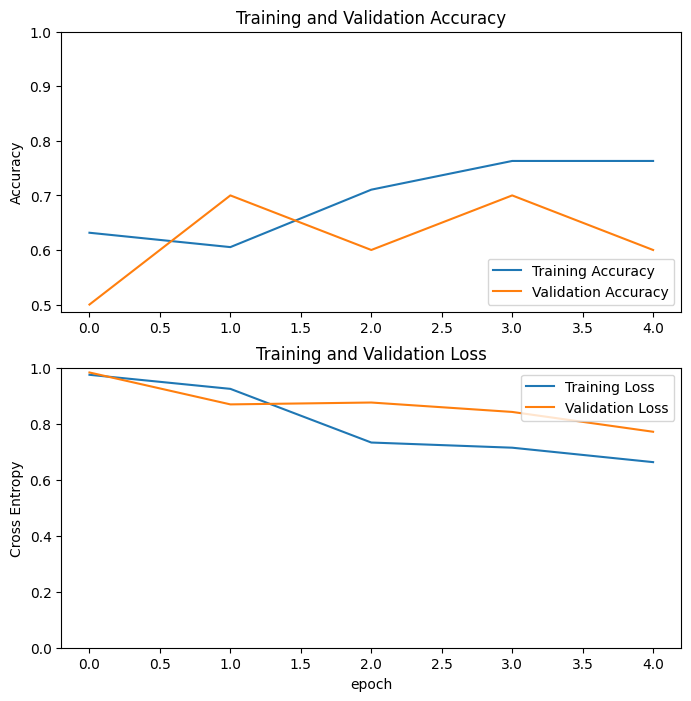

In [32]:
acc = history_EfficientNetB0_fe.history['accuracy']
val_acc = history_EfficientNetB0_fe.history['val_accuracy']

loss = history_EfficientNetB0_fe.history['loss']
val_loss = history_EfficientNetB0_fe.history['val_loss']

In [60]:
model = get_architecture(y, Model_version="EfficientNetB0", as_feature_extractor=False)

In [25]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                           

 block_3_expand_relu (ReLU)     (None, 56, 56, 144)  0           ['block_3_expand_BN[0][0]']      
                                                                                                  
 block_3_pad (ZeroPadding2D)    (None, 57, 57, 144)  0           ['block_3_expand_relu[0][0]']    
                                                                                                  
 block_3_depthwise (DepthwiseCo  (None, 28, 28, 144)  1296       ['block_3_pad[0][0]']            
 nv2D)                                                                                            
                                                                                                  
 block_3_depthwise_BN (BatchNor  (None, 28, 28, 144)  576        ['block_3_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_3_d

 lization)                                                                                        
                                                                                                  
 block_7_expand (Conv2D)        (None, 14, 14, 384)  24576       ['block_6_project_BN[0][0]']     
                                                                                                  
 block_7_expand_BN (BatchNormal  (None, 14, 14, 384)  1536       ['block_7_expand[0][0]']         
 ization)                                                                                         
                                                                                                  
 block_7_expand_relu (ReLU)     (None, 14, 14, 384)  0           ['block_7_expand_BN[0][0]']      
                                                                                                  
 block_7_depthwise (DepthwiseCo  (None, 14, 14, 384)  3456       ['block_7_expand_relu[0][0]']    
 nv2D)    

                                                                                                  
 block_10_depthwise_relu (ReLU)  (None, 14, 14, 384)  0          ['block_10_depthwise_BN[0][0]']  
                                                                                                  
 block_10_project (Conv2D)      (None, 14, 14, 96)   36864       ['block_10_depthwise_relu[0][0]']
                                                                                                  
 block_10_project_BN (BatchNorm  (None, 14, 14, 96)  384         ['block_10_project[0][0]']       
 alization)                                                                                       
                                                                                                  
 block_11_expand (Conv2D)       (None, 14, 14, 576)  55296       ['block_10_project_BN[0][0]']    
                                                                                                  
 block_11_

 block_14_depthwise (DepthwiseC  (None, 7, 7, 960)   8640        ['block_14_expand_relu[0][0]']   
 onv2D)                                                                                           
                                                                                                  
 block_14_depthwise_BN (BatchNo  (None, 7, 7, 960)   3840        ['block_14_depthwise[0][0]']     
 rmalization)                                                                                     
                                                                                                  
 block_14_depthwise_relu (ReLU)  (None, 7, 7, 960)   0           ['block_14_depthwise_BN[0][0]']  
                                                                                                  
 block_14_project (Conv2D)      (None, 7, 7, 160)    153600      ['block_14_depthwise_relu[0][0]']
                                                                                                  
 block_14_

In [30]:

history_EfficientNetB0_ft = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=total_epochs,
    initial_epoch = history_EfficientNetB0_fe.epoch[-1],
    
    
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, total_epochs // 2, 0.25),
)

#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final EfficientNetB0 (Fine-Tuning) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 5/15
10/10 [==============================] - 14s 948ms/step - loss: 1.4189 - accuracy: 0.3684 - val_loss: 1.4031 - val_accuracy: 0.3000
Epoch 6/15
10/10 [==============================] - 8s 843ms/step - loss: 0.8484 - accuracy: 0.6842 - val_loss: 1.2818 - val_accuracy: 0.5000
Epoch 7/15
10/10 [==============================] - 8s 758ms/step - loss: 1.0287 - accuracy: 0.6316 - val_loss: 1.4217 - val_accuracy: 0.3000
Epoch 8/15
10/10 [==============================] - 8s 787ms/step - loss: 0.4423 - accuracy: 0.8158 - val_loss: 1.4566 - val_accuracy: 0.4000
Epoch 9/15
10/10 [==============================] - 9s 927ms/step - loss: 0.3196 - accuracy: 0.8947 - val_loss: 1.5023 - val_accuracy: 0.6000
Epoch 10/15
10/10 [==============================] - 9s 867ms/step - loss: 0.1549 - accuracy: 0.9737 - val_loss: 1.5191 - val_accuracy: 0.6000
Epoch 11/15
10/10 [==============================] - 8s 784ms/step - loss: 0.2514 - accuracy: 0.9474 - val_loss: 1.8953 - val_accuracy: 0.5000
Epo

In [33]:
acc += history_EfficientNetB0_ft.history['accuracy']
val_acc += history_EfficientNetB0_ft.history['val_accuracy']

loss += history_EfficientNetB0_ft.history['loss']
val_loss += history_EfficientNetB0_ft.history['val_loss']

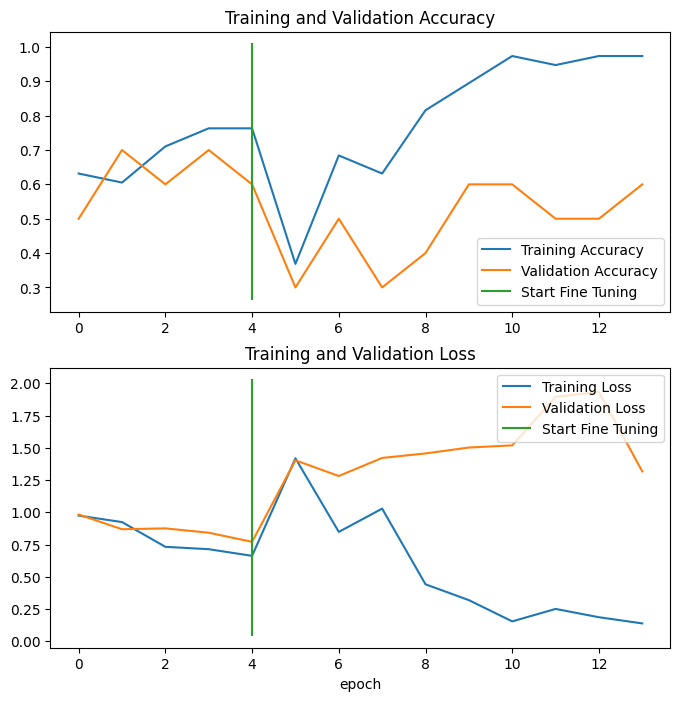

In [34]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
#plt.ylim([0.8, 1])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
#plt.ylim([0, 1.0])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

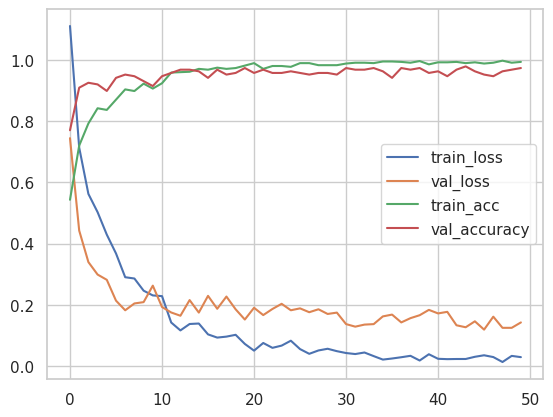

In [ ]:
# plot the loss and accuracy curves
plt.plot(history_EfficientNetB0_ft.history['loss'], label='train_loss')
plt.plot(history_EfficientNetB0_ft.history['val_loss'], label='val_loss')
plt.plot(history_EfficientNetB0_ft.history['accuracy'], label='train_acc')
plt.plot(history_EfficientNetB0_ft.history['val_accuracy'], label='val_accuracy')
plt.legend()
plt.show()

In [ ]:
y_pred = model.predict(X_test)

8/8 [==============================] - 4s 152ms/step


In [ ]:
#test_pred = np.argmax(model.predict(X_test), axis=1)

8/8 [==============================] - 14s 2s/step


In [ ]:
y_pred = np.argmax(y_pred, axis=1)
y_test = np.argmax(y_test, axis=1)

In [ ]:
print('Classification Report EfficientNetB0:\n', classification_report(y_test, y_pred))

Classification Report EfficientNetB0:
               precision    recall  f1-score   support

           0       1.00      0.94      0.97        69
           1       0.94      1.00      0.97        65
           2       0.99      1.00      0.99        72
           3       1.00      0.96      0.98        28

    accuracy                           0.98       234
   macro avg       0.98      0.98      0.98       234
weighted avg       0.98      0.98      0.98       234



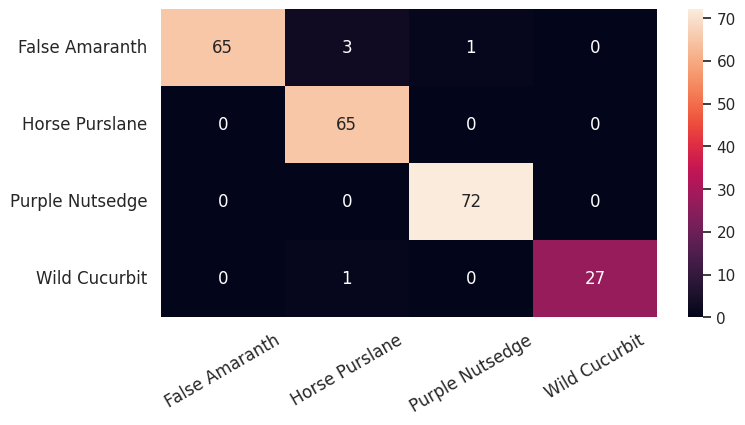

In [ ]:
cm = confusion_matrix(y_test, y_pred)

class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']


plt.figure(figsize=(8, 4))
df_cm = pd.DataFrame(cm, index=class_names,
                     columns=class_names)
sns.set(font_scale=1.0)
sns.heatmap(df_cm, annot=True, annot_kws={"size": 12},  fmt='0.0f')
plt.xticks(rotation=30, fontsize=12)
plt.yticks(fontsize=12)

plt.savefig('EV2_bo_ftNA_heatmap.png')

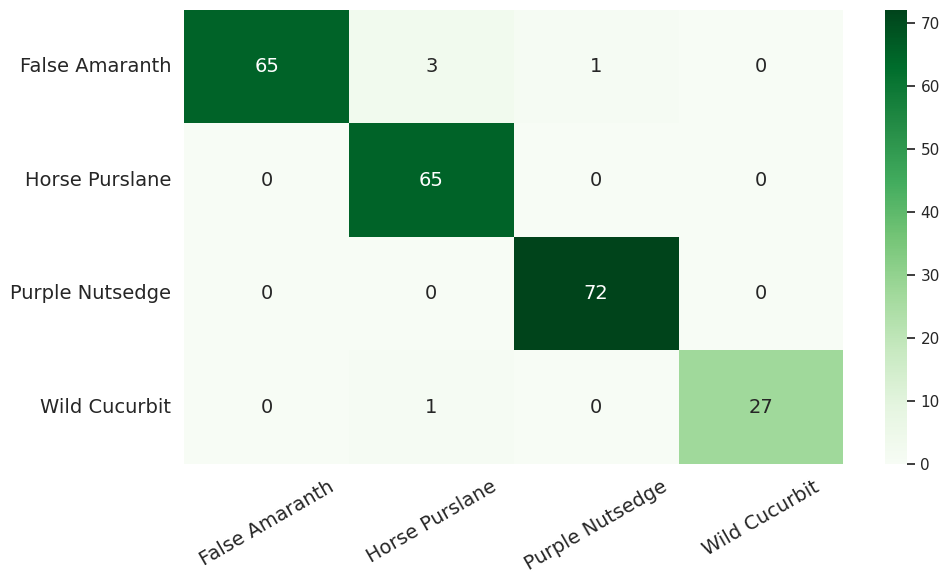

In [ ]:
plt.figure(figsize=(8, 4))
conf_mat = cm / np.sum(cm, 1)
class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']

df_cm1 = pd.DataFrame(conf_mat, index=class_names,
                     columns=class_names)
#sns.set(font_scale=1.0)
sns.heatmap(df_cm1, annot=True, annot_kws={"size": 14}, cmap='Greens',  fmt='0.0f')

plt.xticks(rotation=20, fontsize=12)
plt.yticks(fontsize=12)

In [1]:
import pandas as pd

from decimal import Decimal


#df_cm1

for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], Decimal):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 2))
for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], float):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 1))            
df_cm1

NameError: name 'df_cm1' is not defined

In [ ]:
model = get_architecture(y, Model_version="EfficientNetV2B1", as_feature_extractor=True)

28456008/28456008 [==============================] - 2s 0us/step


In [ ]:
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 rescaling_2 (Rescaling)     (None, 224, 224, 3)          0         ['input_3[0][0]']             
                                                                                                  
 normalization_1 (Normaliza  (None, 224, 224, 3)          0         ['rescaling_2[0][0]']         
 tion)                                                                                            
                                                                                                  
 stem_conv (Conv2D)          (None, 112, 112, 32)         864       ['normalization_1[0][0]'

In [ ]:
X_prep = tf.keras.applications.mobilenet_v3.preprocess_input(X)

X_train, X_test, y_train, y_test = train_test_split(
    X_prep,
    y,
    test_size=TEST_SPLIT,
    shuffle=True,
    stratify=y,
    random_state=RANDOM_STATE
)

X_train, X_val, y_train, y_val = train_test_split(
    X_train,
    y_train,
    test_size=VAL_SPLIT,
    shuffle=True,
    stratify=y_train,
    random_state=RANDOM_STATE,
)

In [ ]:

history_EfficientNetV2B1_fe = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=NUM_EPOCHS,
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, NUM_EPOCHS // 2, 0.25),
)

final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final EfficientNetV2B1 (Feature-Extraction) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 1/50
187/187 [==============================] - 51s 107ms/step - loss: 1.2076 - accuracy: 0.4772 - val_loss: 1.0297 - val_accuracy: 0.6952
Epoch 2/50
187/187 [==============================] - 15s 80ms/step - loss: 0.8319 - accuracy: 0.6957 - val_loss: 0.6517 - val_accuracy: 0.8182
Epoch 3/50
187/187 [==============================] - 14s 76ms/step - loss: 0.7030 - accuracy: 0.7426 - val_loss: 0.5050 - val_accuracy: 0.8717
Epoch 4/50
187/187 [==============================] - 14s 77ms/step - loss: 0.5422 - accuracy: 0.8123 - val_loss: 0.3425 - val_accuracy: 0.9198
Epoch 5/50
187/187 [==============================] - 15s 78ms/step - loss: 0.4168 - accuracy: 0.8619 - val_loss: 0.3757 - val_accuracy: 0.9305
Epoch 6/50
187/187 [==============================] - 14s 74ms/step - loss: 0.3636 - accuracy: 0.8727 - val_loss: 0.3290 - val_accuracy: 0.9198
Epoch 7/50
187/187 [==============================] - 14s 76ms/step - loss: 0.3033 - accuracy: 0.8954 - val_loss: 0.2215 - val_accuracy

In [ ]:
history_EfficientNetV2B1_fe.history

{'loss': [1.207568645477295,
  0.8319323062896729,
  0.7029944062232971,
  0.5421893000602722,
  0.4168012738227844,
  0.36363154649734497,
  0.3033202290534973,
  0.24188725650310516,
  0.23424193263053894,
  0.23101574182510376,
  0.1973249614238739,
  0.19086186587810516,
  0.16571888327598572,
  0.2071550339460373,
  0.1577502340078354,
  0.130147784948349,
  0.0977567732334137,
  0.12203626334667206,
  0.0839984342455864,
  0.0977325364947319,
  0.10019535571336746,
  0.10363605618476868,
  0.06645213067531586,
  0.051801539957523346,
  0.06678386777639389,
  0.07346577942371368,
  0.05131910368800163,
  0.06849154829978943,
  0.044930946081876755,
  0.05328306183218956,
  0.04748846963047981,
  0.04275532811880112,
  0.03866518661379814,
  0.06254913657903671,
  0.04460779204964638,
  0.029006490483880043,
  0.04113856703042984,
  0.040282413363456726,
  0.01997131109237671,
  0.026149846613407135,
  0.030725419521331787,
  0.02121492102742195,
  0.025887468829751015,
  0.0285759

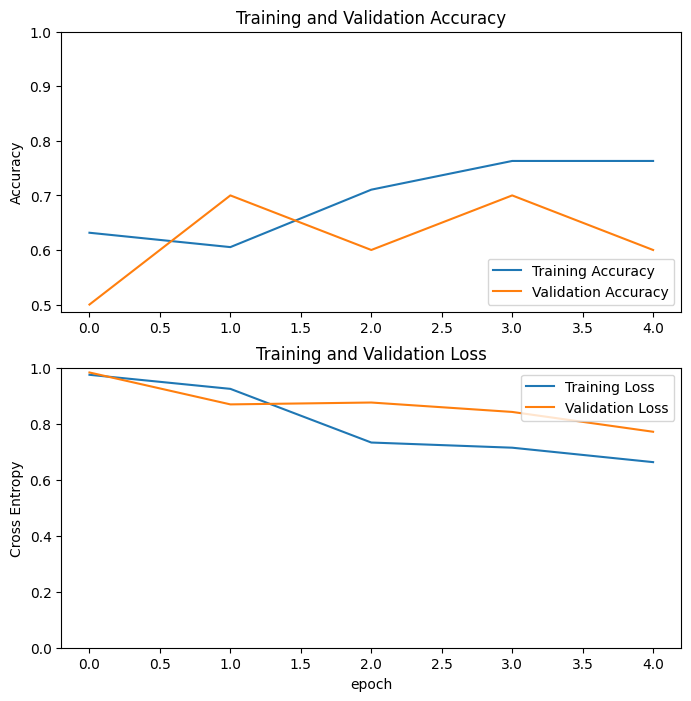

In [32]:
acc = history_EfficientNetV2B1_fe.history['accuracy']
val_acc = history_EfficientNetV2B1_fe.history['val_accuracy']

loss = history_EfficientNetV2B1_fe.history['loss']
val_loss = history_EfficientNetV2B1_fe.history['val_loss']

In [60]:
model = get_architecture(y, Model_version="EfficientNetV2B1", as_feature_extractor=False)

In [25]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                           

 block_3_expand_relu (ReLU)     (None, 56, 56, 144)  0           ['block_3_expand_BN[0][0]']      
                                                                                                  
 block_3_pad (ZeroPadding2D)    (None, 57, 57, 144)  0           ['block_3_expand_relu[0][0]']    
                                                                                                  
 block_3_depthwise (DepthwiseCo  (None, 28, 28, 144)  1296       ['block_3_pad[0][0]']            
 nv2D)                                                                                            
                                                                                                  
 block_3_depthwise_BN (BatchNor  (None, 28, 28, 144)  576        ['block_3_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_3_d

 lization)                                                                                        
                                                                                                  
 block_7_expand (Conv2D)        (None, 14, 14, 384)  24576       ['block_6_project_BN[0][0]']     
                                                                                                  
 block_7_expand_BN (BatchNormal  (None, 14, 14, 384)  1536       ['block_7_expand[0][0]']         
 ization)                                                                                         
                                                                                                  
 block_7_expand_relu (ReLU)     (None, 14, 14, 384)  0           ['block_7_expand_BN[0][0]']      
                                                                                                  
 block_7_depthwise (DepthwiseCo  (None, 14, 14, 384)  3456       ['block_7_expand_relu[0][0]']    
 nv2D)    

                                                                                                  
 block_10_depthwise_relu (ReLU)  (None, 14, 14, 384)  0          ['block_10_depthwise_BN[0][0]']  
                                                                                                  
 block_10_project (Conv2D)      (None, 14, 14, 96)   36864       ['block_10_depthwise_relu[0][0]']
                                                                                                  
 block_10_project_BN (BatchNorm  (None, 14, 14, 96)  384         ['block_10_project[0][0]']       
 alization)                                                                                       
                                                                                                  
 block_11_expand (Conv2D)       (None, 14, 14, 576)  55296       ['block_10_project_BN[0][0]']    
                                                                                                  
 block_11_

 block_14_depthwise (DepthwiseC  (None, 7, 7, 960)   8640        ['block_14_expand_relu[0][0]']   
 onv2D)                                                                                           
                                                                                                  
 block_14_depthwise_BN (BatchNo  (None, 7, 7, 960)   3840        ['block_14_depthwise[0][0]']     
 rmalization)                                                                                     
                                                                                                  
 block_14_depthwise_relu (ReLU)  (None, 7, 7, 960)   0           ['block_14_depthwise_BN[0][0]']  
                                                                                                  
 block_14_project (Conv2D)      (None, 7, 7, 160)    153600      ['block_14_depthwise_relu[0][0]']
                                                                                                  
 block_14_

In [30]:

history_EfficientNetV2B1_ft = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=total_epochs,
    initial_epoch = history_EfficientNetV2B1_fe.epoch[-1],
    
    
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, total_epochs // 2, 0.25),
)

#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final EfficientNetB0 (Fine-Tune) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 5/15
10/10 [==============================] - 14s 948ms/step - loss: 1.4189 - accuracy: 0.3684 - val_loss: 1.4031 - val_accuracy: 0.3000
Epoch 6/15
10/10 [==============================] - 8s 843ms/step - loss: 0.8484 - accuracy: 0.6842 - val_loss: 1.2818 - val_accuracy: 0.5000
Epoch 7/15
10/10 [==============================] - 8s 758ms/step - loss: 1.0287 - accuracy: 0.6316 - val_loss: 1.4217 - val_accuracy: 0.3000
Epoch 8/15
10/10 [==============================] - 8s 787ms/step - loss: 0.4423 - accuracy: 0.8158 - val_loss: 1.4566 - val_accuracy: 0.4000
Epoch 9/15
10/10 [==============================] - 9s 927ms/step - loss: 0.3196 - accuracy: 0.8947 - val_loss: 1.5023 - val_accuracy: 0.6000
Epoch 10/15
10/10 [==============================] - 9s 867ms/step - loss: 0.1549 - accuracy: 0.9737 - val_loss: 1.5191 - val_accuracy: 0.6000
Epoch 11/15
10/10 [==============================] - 8s 784ms/step - loss: 0.2514 - accuracy: 0.9474 - val_loss: 1.8953 - val_accuracy: 0.5000
Epo

In [33]:
acc += history_EfficientNetV2B1_ft.history['accuracy']
val_acc += history_EfficientNetV2B1_ft.history['val_accuracy']

loss += history_EfficientNetV2B1_ft.history['loss']
val_loss += history_EfficientNetV2B1_ft.history['val_loss']

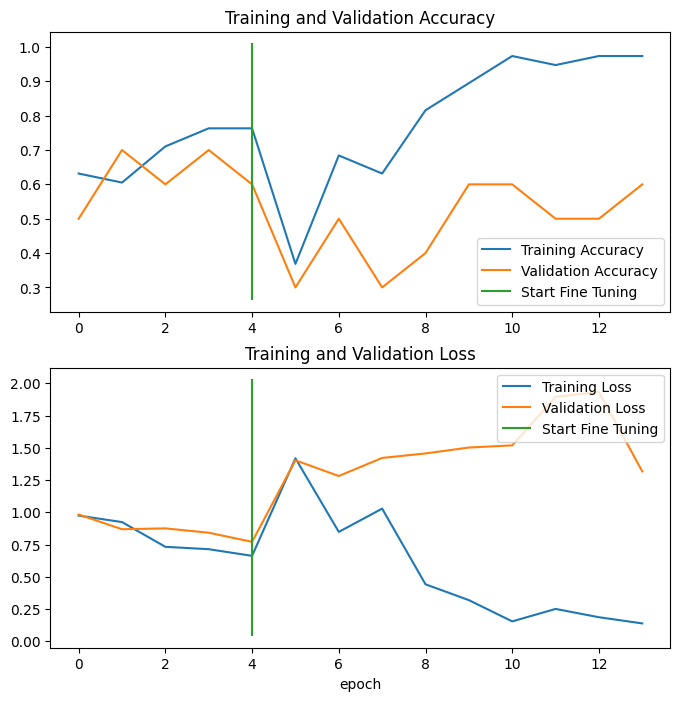

In [34]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
#plt.ylim([0.8, 1])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
#plt.ylim([0, 1.0])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

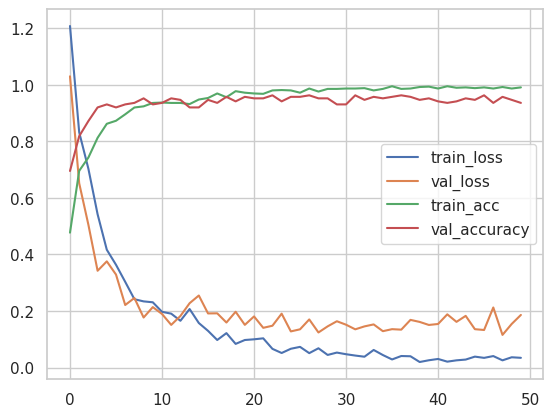

In [ ]:
# plot the loss and accuracy curves
plt.plot(history_EfficientNetV2B1_ft.history['loss'], label='train_loss')
plt.plot(history_EfficientNetV2B1_ft.history['val_loss'], label='val_loss')
plt.plot(history_EfficientNetV2B1_ft.history['accuracy'], label='train_acc')
plt.plot(history_EfficientNetV2B1_ft.history['val_accuracy'], label='val_accuracy')
plt.legend()
plt.show()

In [ ]:
y_pred = model.predict(X_test)

8/8 [==============================] - 4s 168ms/step


In [ ]:
y_pred = np.argmax(y_pred, axis=1)
y_test = np.argmax(y_test, axis=1)

In [ ]:
print('Classification Report EfficientNetV2B1:\n', classification_report(y_test, y_pred))

Classification Report EfficientNetV2B1:
               precision    recall  f1-score   support

           0       0.97      0.99      0.98        69
           1       0.98      0.94      0.96        65
           2       0.99      1.00      0.99        72
           3       0.93      0.96      0.95        28

    accuracy                           0.97       234
   macro avg       0.97      0.97      0.97       234
weighted avg       0.97      0.97      0.97       234



(array([0.5, 1.5, 2.5, 3.5]),
 [Text(0, 0.5, 'False Amaranth'),
  Text(0, 1.5, 'Horse Purslane'),
  Text(0, 2.5, 'Purple Nutsedge'),
  Text(0, 3.5, 'Wild Cucurbit')])

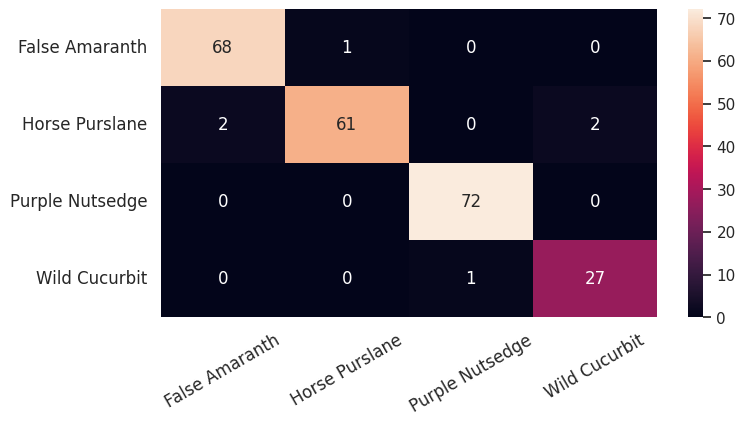

In [ ]:
cm = confusion_matrix(y_test, y_pred)

class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']


plt.figure(figsize=(8, 4))
df_cm = pd.DataFrame(cm, index=class_names,
                     columns=class_names)
sns.set(font_scale=1.0)
sns.heatmap(df_cm, annot=True, annot_kws={"size": 12},  fmt='0.0f')
plt.xticks(rotation=30, fontsize=12)
plt.yticks(fontsize=12)

#plt.savefig('EV2_bo_ftNA_heatmap.png')

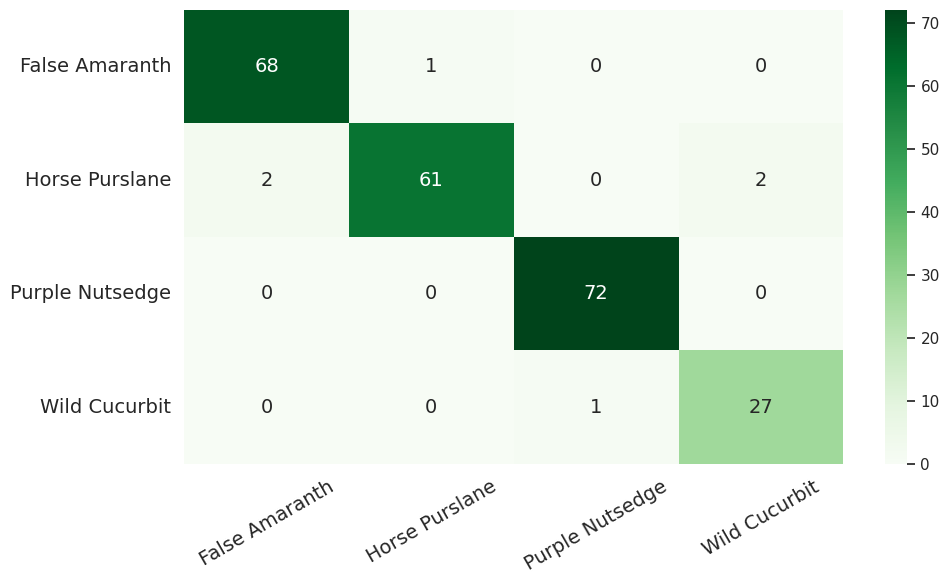

In [ ]:
plt.figure(figsize=(8, 4))
conf_mat = cm / np.sum(cm, 1)
class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']

df_cm1 = pd.DataFrame(conf_mat, index=class_names,
                     columns=class_names)
#sns.set(font_scale=1.0)
sns.heatmap(df_cm1, annot=True, annot_kws={"size": 14}, cmap='Greens',  fmt='0.0f')

plt.xticks(rotation=20, fontsize=12)
plt.yticks(fontsize=12)

In [1]:
import pandas as pd

from decimal import Decimal


#df_cm1

for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], Decimal):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 2))
for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], float):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 1))            
df_cm1

NameError: name 'df_cm1' is not defined

In [ ]:
model = get_architecture(y, Model_version="EfficientNetV2B0", as_feature_extractor=True)

24274472/24274472 [==============================] - 2s 0us/step


In [ ]:
model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 rescaling_3 (Rescaling)     (None, 224, 224, 3)          0         ['input_4[0][0]']             
                                                                                                  
 normalization_2 (Normaliza  (None, 224, 224, 3)          0         ['rescaling_3[0][0]']         
 tion)                                                                                            
                                                                                                  
 stem_conv (Conv2D)          (None, 112, 112, 32)         864       ['normalization_2[0][0]'

In [ ]:
X_prep = tf.keras.applications.mobilenet_v3.preprocess_input(X)

X_train, X_test, y_train, y_test = train_test_split(
    X_prep,
    y,
    test_size=TEST_SPLIT,
    shuffle=True,
    stratify=y,
    random_state=RANDOM_STATE
)

X_train, X_val, y_train, y_val = train_test_split(
    X_train,
    y_train,
    test_size=VAL_SPLIT,
    shuffle=True,
    stratify=y_train,
    random_state=RANDOM_STATE,
)

In [ ]:

history_EfficientNetV2B0_fe = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=NUM_EPOCHS,
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, NUM_EPOCHS // 2, 0.25),
)
#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final EfficientNetV2B0 (Feature-Extractor) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 1/50
187/187 [==============================] - 37s 74ms/step - loss: 1.2308 - accuracy: 0.4705 - val_loss: 1.0437 - val_accuracy: 0.6684
Epoch 2/50
187/187 [==============================] - 11s 59ms/step - loss: 0.9296 - accuracy: 0.6622 - val_loss: 0.7118 - val_accuracy: 0.8021
Epoch 3/50
187/187 [==============================] - 12s 63ms/step - loss: 0.6797 - accuracy: 0.7359 - val_loss: 0.5053 - val_accuracy: 0.8556
Epoch 4/50
187/187 [==============================] - 12s 62ms/step - loss: 0.6129 - accuracy: 0.7761 - val_loss: 0.3969 - val_accuracy: 0.9198
Epoch 5/50
187/187 [==============================] - 11s 60ms/step - loss: 0.4322 - accuracy: 0.8700 - val_loss: 0.2869 - val_accuracy: 0.9412
Epoch 6/50
187/187 [==============================] - 11s 60ms/step - loss: 0.3456 - accuracy: 0.8753 - val_loss: 0.3117 - val_accuracy: 0.9037
Epoch 7/50
187/187 [==============================] - 11s 56ms/step - loss: 0.3299 - accuracy: 0.8981 - val_loss: 0.2531 - val_accuracy:

In [ ]:
history_EfficientNetV2B0_fe.history

{'loss': [1.2307780981063843,
  0.9296035766601562,
  0.6797397136688232,
  0.6129213571548462,
  0.4322224259376526,
  0.34560200572013855,
  0.32990095019340515,
  0.2903284430503845,
  0.24886900186538696,
  0.2103949338197708,
  0.22083508968353271,
  0.1761447638273239,
  0.1491735577583313,
  0.12577708065509796,
  0.12909020483493805,
  0.12328523397445679,
  0.12984056770801544,
  0.08180995285511017,
  0.11916302144527435,
  0.08123257011175156,
  0.08875412493944168,
  0.06044736132025719,
  0.07521999627351761,
  0.11206375807523727,
  0.07935377210378647,
  0.07781199365854263,
  0.07785417884588242,
  0.05367691069841385,
  0.04699549078941345,
  0.032972995191812515,
  0.025903847068548203,
  0.035060398280620575,
  0.03308137506246567,
  0.038756489753723145,
  0.03692605718970299,
  0.034211885184049606,
  0.04672229290008545,
  0.025840479880571365,
  0.043573424220085144,
  0.034233368933200836,
  0.02475494146347046,
  0.029106080532073975,
  0.031992051750421524,
  

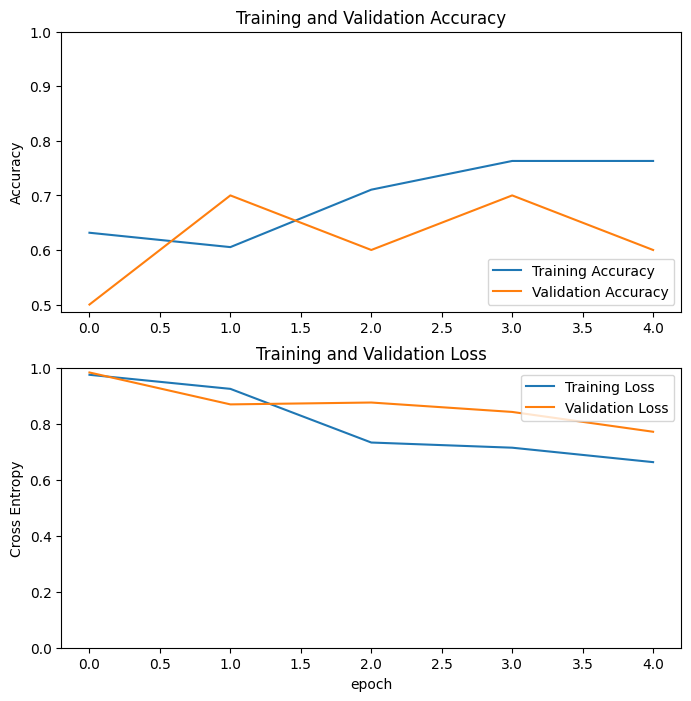

In [32]:
acc = history_EfficientNetV2B0_fe.history['accuracy']
val_acc = history_EfficientNetV2B0_fe.history['val_accuracy']

loss = history_EfficientNetV2B0_fe.history['loss']
val_loss = history_EfficientNetV2B0_fe.history['val_loss']

In [60]:
model = get_architecture(y, Model_version="EfficientNetV2B0", as_feature_extractor=False)

In [25]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                           

 block_3_expand_relu (ReLU)     (None, 56, 56, 144)  0           ['block_3_expand_BN[0][0]']      
                                                                                                  
 block_3_pad (ZeroPadding2D)    (None, 57, 57, 144)  0           ['block_3_expand_relu[0][0]']    
                                                                                                  
 block_3_depthwise (DepthwiseCo  (None, 28, 28, 144)  1296       ['block_3_pad[0][0]']            
 nv2D)                                                                                            
                                                                                                  
 block_3_depthwise_BN (BatchNor  (None, 28, 28, 144)  576        ['block_3_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_3_d

 lization)                                                                                        
                                                                                                  
 block_7_expand (Conv2D)        (None, 14, 14, 384)  24576       ['block_6_project_BN[0][0]']     
                                                                                                  
 block_7_expand_BN (BatchNormal  (None, 14, 14, 384)  1536       ['block_7_expand[0][0]']         
 ization)                                                                                         
                                                                                                  
 block_7_expand_relu (ReLU)     (None, 14, 14, 384)  0           ['block_7_expand_BN[0][0]']      
                                                                                                  
 block_7_depthwise (DepthwiseCo  (None, 14, 14, 384)  3456       ['block_7_expand_relu[0][0]']    
 nv2D)    

                                                                                                  
 block_10_depthwise_relu (ReLU)  (None, 14, 14, 384)  0          ['block_10_depthwise_BN[0][0]']  
                                                                                                  
 block_10_project (Conv2D)      (None, 14, 14, 96)   36864       ['block_10_depthwise_relu[0][0]']
                                                                                                  
 block_10_project_BN (BatchNorm  (None, 14, 14, 96)  384         ['block_10_project[0][0]']       
 alization)                                                                                       
                                                                                                  
 block_11_expand (Conv2D)       (None, 14, 14, 576)  55296       ['block_10_project_BN[0][0]']    
                                                                                                  
 block_11_

 block_14_depthwise (DepthwiseC  (None, 7, 7, 960)   8640        ['block_14_expand_relu[0][0]']   
 onv2D)                                                                                           
                                                                                                  
 block_14_depthwise_BN (BatchNo  (None, 7, 7, 960)   3840        ['block_14_depthwise[0][0]']     
 rmalization)                                                                                     
                                                                                                  
 block_14_depthwise_relu (ReLU)  (None, 7, 7, 960)   0           ['block_14_depthwise_BN[0][0]']  
                                                                                                  
 block_14_project (Conv2D)      (None, 7, 7, 160)    153600      ['block_14_depthwise_relu[0][0]']
                                                                                                  
 block_14_

In [30]:

history_EfficientNetV2B0_ft = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=total_epochs,
    initial_epoch = history_EfficientNetV2B0_fe.epoch[-1],
    
    
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, total_epochs // 2, 0.25),
)

#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final EfficientNetV2B0 (Fine-Tuning) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 5/15
10/10 [==============================] - 14s 948ms/step - loss: 1.4189 - accuracy: 0.3684 - val_loss: 1.4031 - val_accuracy: 0.3000
Epoch 6/15
10/10 [==============================] - 8s 843ms/step - loss: 0.8484 - accuracy: 0.6842 - val_loss: 1.2818 - val_accuracy: 0.5000
Epoch 7/15
10/10 [==============================] - 8s 758ms/step - loss: 1.0287 - accuracy: 0.6316 - val_loss: 1.4217 - val_accuracy: 0.3000
Epoch 8/15
10/10 [==============================] - 8s 787ms/step - loss: 0.4423 - accuracy: 0.8158 - val_loss: 1.4566 - val_accuracy: 0.4000
Epoch 9/15
10/10 [==============================] - 9s 927ms/step - loss: 0.3196 - accuracy: 0.8947 - val_loss: 1.5023 - val_accuracy: 0.6000
Epoch 10/15
10/10 [==============================] - 9s 867ms/step - loss: 0.1549 - accuracy: 0.9737 - val_loss: 1.5191 - val_accuracy: 0.6000
Epoch 11/15
10/10 [==============================] - 8s 784ms/step - loss: 0.2514 - accuracy: 0.9474 - val_loss: 1.8953 - val_accuracy: 0.5000
Epo

In [33]:
acc += history_EfficientNetV2B0_ft.history['accuracy']
val_acc += history_EfficientNetV2B0_ft.history['val_accuracy']

loss += history_EfficientNetV2B0_ft.history['loss']
val_loss += history_EfficientNetV2B0_ft.history['val_loss']

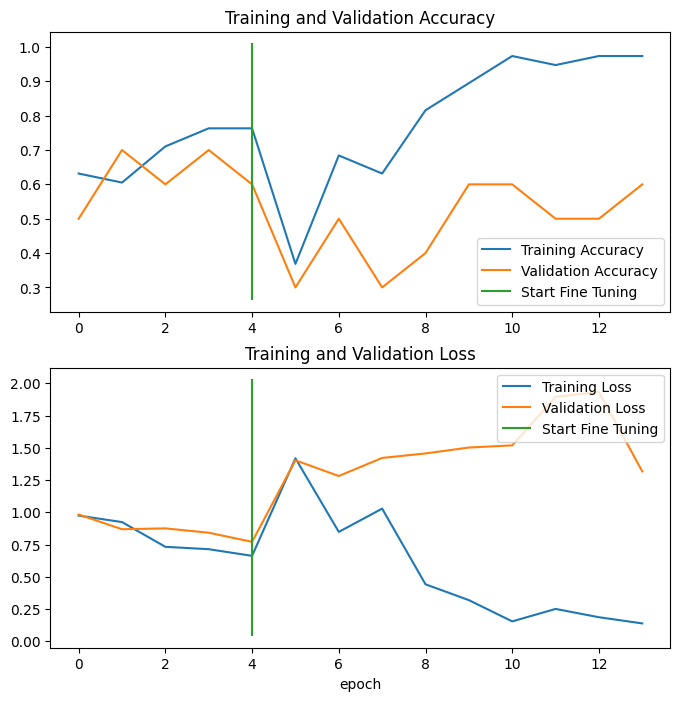

In [34]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
#plt.ylim([0.8, 1])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
#plt.ylim([0, 1.0])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

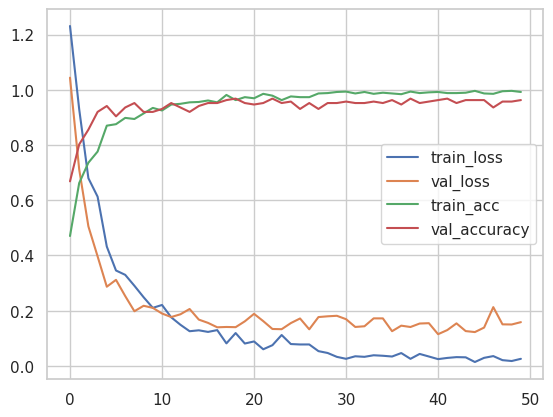

In [ ]:
# plot the loss and accuracy curves
plt.plot(history_EfficientNetV2B0_ft.history['loss'], label='train_loss')
plt.plot(history_EfficientNetV2B0_ft.history['val_loss'], label='val_loss')
plt.plot(history_EfficientNetV2B0_ft.history['accuracy'], label='train_acc')
plt.plot(history_EfficientNetV2B0_ft.history['val_accuracy'], label='val_accuracy')
plt.legend()
plt.show()

In [ ]:
y_pred = model.predict(X_test)

8/8 [==============================] - 2s 51ms/step


In [ ]:
y_pred = np.argmax(y_pred, axis=1)
y_test = np.argmax(y_test, axis=1)

In [ ]:
print('Classification Report EfficientNetV2B0:\n', classification_report(y_test, y_pred))

Classification Report EfficientNetV2B0:
               precision    recall  f1-score   support

           0       0.98      0.94      0.96        69
           1       0.95      0.95      0.95        65
           2       0.95      0.99      0.97        72
           3       0.89      0.89      0.89        28

    accuracy                           0.95       234
   macro avg       0.94      0.94      0.94       234
weighted avg       0.95      0.95      0.95       234



(array([0.5, 1.5, 2.5, 3.5]),
 [Text(0, 0.5, 'False Amaranth'),
  Text(0, 1.5, 'Horse Purslane'),
  Text(0, 2.5, 'Purple Nutsedge'),
  Text(0, 3.5, 'Wild Cucurbit')])

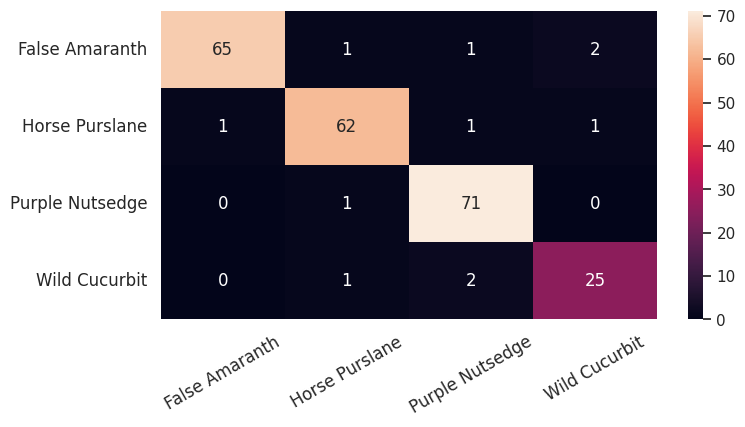

In [ ]:
cm = confusion_matrix(y_test, y_pred)

class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']


plt.figure(figsize=(8, 4))
df_cm = pd.DataFrame(cm, index=class_names,
                     columns=class_names)
sns.set(font_scale=1.0)
sns.heatmap(df_cm, annot=True, annot_kws={"size": 12},  fmt='0.0f')
plt.xticks(rotation=30, fontsize=12)
plt.yticks(fontsize=12)

#plt.savefig('EV2_bo_ftNA_heatmap.png')

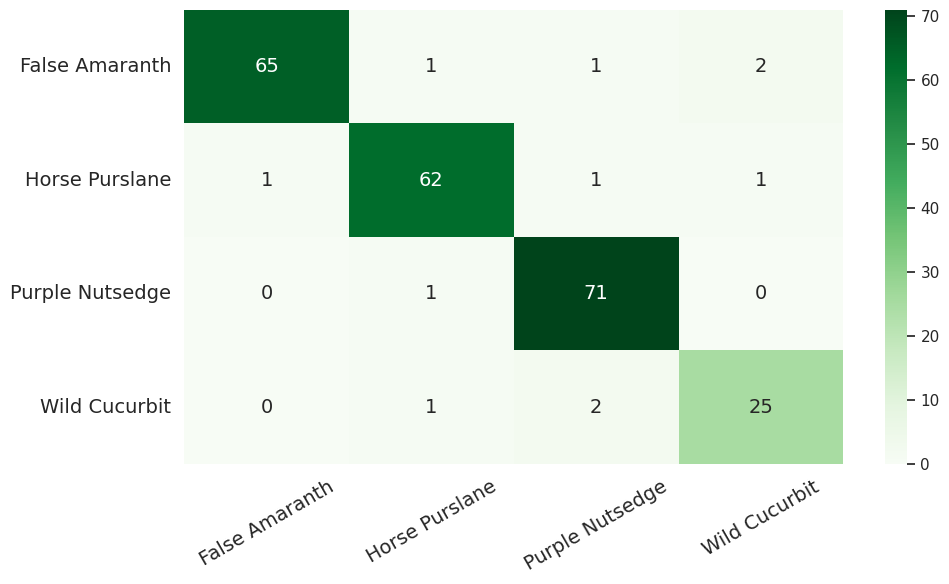

In [ ]:
plt.figure(figsize=(8, 4))
conf_mat = cm / np.sum(cm, 1)
class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']

df_cm1 = pd.DataFrame(conf_mat, index=class_names,
                     columns=class_names)
#sns.set(font_scale=1.0)
sns.heatmap(df_cm1, annot=True, annot_kws={"size": 14}, cmap='Greens',  fmt='0.0f')

plt.xticks(rotation=20, fontsize=12)
plt.yticks(fontsize=12)

In [1]:
import pandas as pd

from decimal import Decimal


#df_cm1

for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], Decimal):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 2))
for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], float):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 1))            
df_cm1

NameError: name 'df_cm1' is not defined

In [ ]:
model = get_architecture(y, Model_version="EfficientNetV2B2", as_feature_extractor=True)

35839040/35839040 [==============================] - 3s 0us/step


In [ ]:
model.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_5 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 rescaling_4 (Rescaling)     (None, 224, 224, 3)          0         ['input_5[0][0]']             
                                                                                                  
 normalization_3 (Normaliza  (None, 224, 224, 3)          0         ['rescaling_4[0][0]']         
 tion)                                                                                            
                                                                                                  
 stem_conv (Conv2D)          (None, 112, 112, 32)         864       ['normalization_3[0][0]'

In [ ]:
X_prep = tf.keras.applications.mobilenet_v3.preprocess_input(X)

X_train, X_test, y_train, y_test = train_test_split(
    X_prep,
    y,
    test_size=TEST_SPLIT,
    shuffle=True,
    stratify=y,
    random_state=RANDOM_STATE
)

X_train, X_val, y_train, y_val = train_test_split(
    X_train,
    y_train,
    test_size=VAL_SPLIT,
    shuffle=True,
    stratify=y_train,
    random_state=RANDOM_STATE,
)

In [ ]:

history_EfficientNetV2B2_fe = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=NUM_EPOCHS,
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, NUM_EPOCHS // 2, 0.25),
)
#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final EfficientNetV2B2 (Feature-Extractor) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 1/50
187/187 [==============================] - 50s 99ms/step - loss: 1.2189 - accuracy: 0.4786 - val_loss: 0.9904 - val_accuracy: 0.7273
Epoch 2/50
187/187 [==============================] - 15s 79ms/step - loss: 0.8401 - accuracy: 0.6930 - val_loss: 0.6861 - val_accuracy: 0.7701
Epoch 3/50
187/187 [==============================] - 15s 79ms/step - loss: 0.7065 - accuracy: 0.7346 - val_loss: 0.5410 - val_accuracy: 0.8182
Epoch 4/50
187/187 [==============================] - 15s 78ms/step - loss: 0.6159 - accuracy: 0.7922 - val_loss: 0.4136 - val_accuracy: 0.8824
Epoch 5/50
187/187 [==============================] - 14s 77ms/step - loss: 0.4616 - accuracy: 0.8418 - val_loss: 0.3231 - val_accuracy: 0.9037
Epoch 6/50
187/187 [==============================] - 14s 77ms/step - loss: 0.3887 - accuracy: 0.8619 - val_loss: 0.2910 - val_accuracy: 0.9198
Epoch 7/50
187/187 [==============================] - 14s 77ms/step - loss: 0.3328 - accuracy: 0.8834 - val_loss: 0.2747 - val_accuracy:

In [ ]:
history_EfficientNetV2B2_fe.history

{'loss': [1.2189275026321411,
  0.8401230573654175,
  0.7065176963806152,
  0.6158599257469177,
  0.46160873770713806,
  0.38867878913879395,
  0.3328341543674469,
  0.3547813594341278,
  0.2728995084762573,
  0.25357791781425476,
  0.23040975630283356,
  0.18315716087818146,
  0.15842993557453156,
  0.16656982898712158,
  0.1785547435283661,
  0.13879942893981934,
  0.1664268523454666,
  0.11786012351512909,
  0.11471669375896454,
  0.12954039871692657,
  0.1262383908033371,
  0.09490351378917694,
  0.08145006746053696,
  0.07714015245437622,
  0.07878578454256058,
  0.08154993504285812,
  0.11430522799491882,
  0.08342663943767548,
  0.061434995383024216,
  0.06204355135560036,
  0.04044608026742935,
  0.06609823554754257,
  0.07103079557418823,
  0.0806192085146904,
  0.047126851975917816,
  0.06840478628873825,
  0.04267572611570358,
  0.07332345843315125,
  0.05798725411295891,
  0.05593418329954147,
  0.04771050065755844,
  0.06955873221158981,
  0.0330309122800827,
  0.031378865

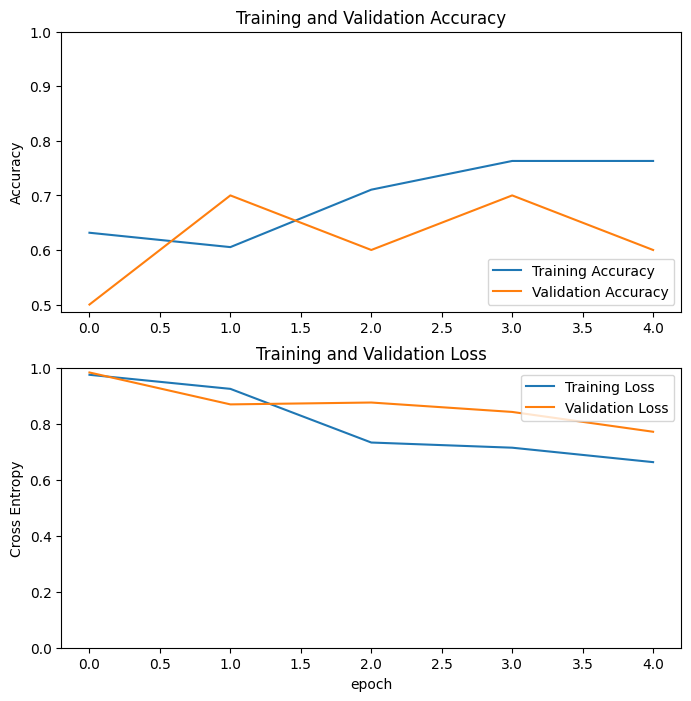

In [32]:
acc = history_EfficientNetV2B2_fe.history['accuracy']
val_acc = history_EfficientNetV2B2_fe.history['val_accuracy']

loss = history_EfficientNetV2B2_fe.history['loss']
val_loss = history_EfficientNetV2B2_fe.history['val_loss']

In [60]:
model = get_architecture(y, Model_version="EfficientNetV2B2", as_feature_extractor=False)

In [25]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                           

 block_3_expand_relu (ReLU)     (None, 56, 56, 144)  0           ['block_3_expand_BN[0][0]']      
                                                                                                  
 block_3_pad (ZeroPadding2D)    (None, 57, 57, 144)  0           ['block_3_expand_relu[0][0]']    
                                                                                                  
 block_3_depthwise (DepthwiseCo  (None, 28, 28, 144)  1296       ['block_3_pad[0][0]']            
 nv2D)                                                                                            
                                                                                                  
 block_3_depthwise_BN (BatchNor  (None, 28, 28, 144)  576        ['block_3_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_3_d

 lization)                                                                                        
                                                                                                  
 block_7_expand (Conv2D)        (None, 14, 14, 384)  24576       ['block_6_project_BN[0][0]']     
                                                                                                  
 block_7_expand_BN (BatchNormal  (None, 14, 14, 384)  1536       ['block_7_expand[0][0]']         
 ization)                                                                                         
                                                                                                  
 block_7_expand_relu (ReLU)     (None, 14, 14, 384)  0           ['block_7_expand_BN[0][0]']      
                                                                                                  
 block_7_depthwise (DepthwiseCo  (None, 14, 14, 384)  3456       ['block_7_expand_relu[0][0]']    
 nv2D)    

                                                                                                  
 block_10_depthwise_relu (ReLU)  (None, 14, 14, 384)  0          ['block_10_depthwise_BN[0][0]']  
                                                                                                  
 block_10_project (Conv2D)      (None, 14, 14, 96)   36864       ['block_10_depthwise_relu[0][0]']
                                                                                                  
 block_10_project_BN (BatchNorm  (None, 14, 14, 96)  384         ['block_10_project[0][0]']       
 alization)                                                                                       
                                                                                                  
 block_11_expand (Conv2D)       (None, 14, 14, 576)  55296       ['block_10_project_BN[0][0]']    
                                                                                                  
 block_11_

 block_14_depthwise (DepthwiseC  (None, 7, 7, 960)   8640        ['block_14_expand_relu[0][0]']   
 onv2D)                                                                                           
                                                                                                  
 block_14_depthwise_BN (BatchNo  (None, 7, 7, 960)   3840        ['block_14_depthwise[0][0]']     
 rmalization)                                                                                     
                                                                                                  
 block_14_depthwise_relu (ReLU)  (None, 7, 7, 960)   0           ['block_14_depthwise_BN[0][0]']  
                                                                                                  
 block_14_project (Conv2D)      (None, 7, 7, 160)    153600      ['block_14_depthwise_relu[0][0]']
                                                                                                  
 block_14_

In [30]:

history_EfficientNetV2B2_ft = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=total_epochs,
    initial_epoch = history_EfficientNetV2B2_fe.epoch[-1],
    
    
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, total_epochs // 2, 0.25),
)

#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final EfficientNetV2B2 (Fine-Tuning) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 5/15
10/10 [==============================] - 14s 948ms/step - loss: 1.4189 - accuracy: 0.3684 - val_loss: 1.4031 - val_accuracy: 0.3000
Epoch 6/15
10/10 [==============================] - 8s 843ms/step - loss: 0.8484 - accuracy: 0.6842 - val_loss: 1.2818 - val_accuracy: 0.5000
Epoch 7/15
10/10 [==============================] - 8s 758ms/step - loss: 1.0287 - accuracy: 0.6316 - val_loss: 1.4217 - val_accuracy: 0.3000
Epoch 8/15
10/10 [==============================] - 8s 787ms/step - loss: 0.4423 - accuracy: 0.8158 - val_loss: 1.4566 - val_accuracy: 0.4000
Epoch 9/15
10/10 [==============================] - 9s 927ms/step - loss: 0.3196 - accuracy: 0.8947 - val_loss: 1.5023 - val_accuracy: 0.6000
Epoch 10/15
10/10 [==============================] - 9s 867ms/step - loss: 0.1549 - accuracy: 0.9737 - val_loss: 1.5191 - val_accuracy: 0.6000
Epoch 11/15
10/10 [==============================] - 8s 784ms/step - loss: 0.2514 - accuracy: 0.9474 - val_loss: 1.8953 - val_accuracy: 0.5000
Epo

In [33]:
acc += history_EfficientNetV2B2_ft.history['accuracy']
val_acc += history_EfficientNetV2B2_ft.history['val_accuracy']

loss += history_EfficientNetV2B2_ft.history['loss']
val_loss += history_EfficientNetV2B2_ft.history['val_loss']

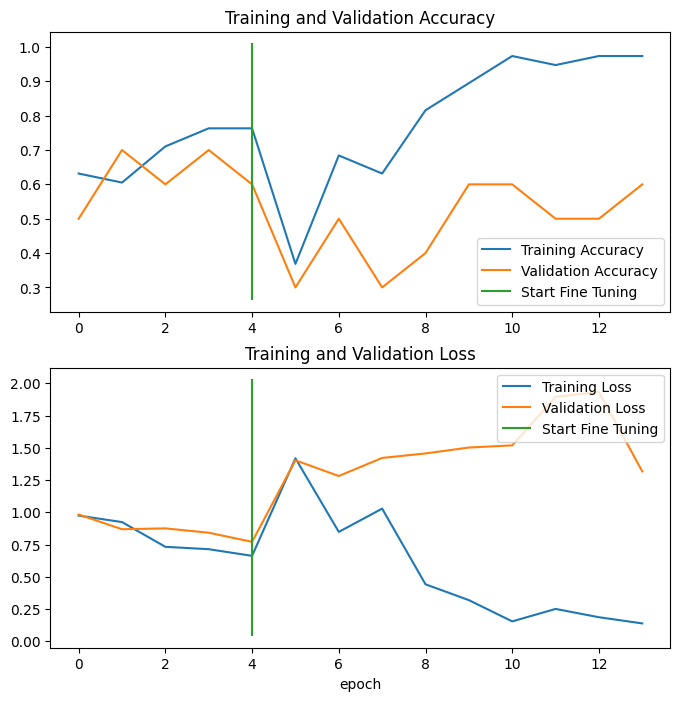

In [34]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
#plt.ylim([0.8, 1])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
#plt.ylim([0, 1.0])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

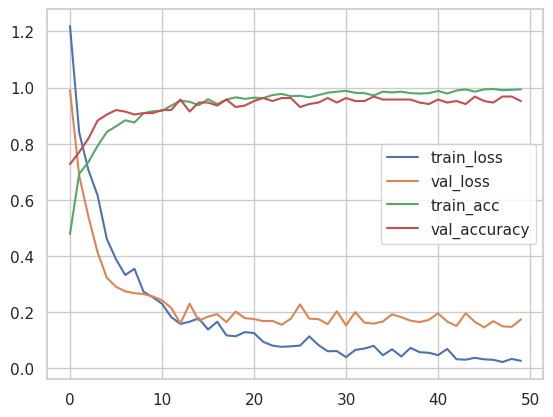

In [ ]:
# plot the loss and accuracy curves
plt.plot(history_EfficientNetV2B2_ft.history['loss'], label='train_loss')
plt.plot(history_EfficientNetV2B2_ft.history['val_loss'], label='val_loss')
plt.plot(history_EfficientNetV2B2_ft.history['accuracy'], label='train_acc')
plt.plot(history_EfficientNetV2B2_ft.history['val_accuracy'], label='val_accuracy')
plt.legend()
plt.show()

In [ ]:
y_pred = model.predict(X_test)

8/8 [==============================] - 5s 157ms/step


In [ ]:
y_pred = np.argmax(y_pred, axis=1)
y_test = np.argmax(y_test, axis=1)

In [ ]:
print('Classification Report EfficientNetV2B2:\n', classification_report(y_test, y_pred))

Classification Report EfficientNetV2B2:
               precision    recall  f1-score   support

           0       0.98      0.91      0.95        69
           1       0.94      0.95      0.95        65
           2       0.97      0.94      0.96        72
           3       0.79      0.96      0.87        28

    accuracy                           0.94       234
   macro avg       0.92      0.94      0.93       234
weighted avg       0.95      0.94      0.94       234



(array([0.5, 1.5, 2.5, 3.5]),
 [Text(0, 0.5, 'False Amaranth'),
  Text(0, 1.5, 'Horse Purslane'),
  Text(0, 2.5, 'Purple Nutsedge'),
  Text(0, 3.5, 'Wild Cucurbit')])

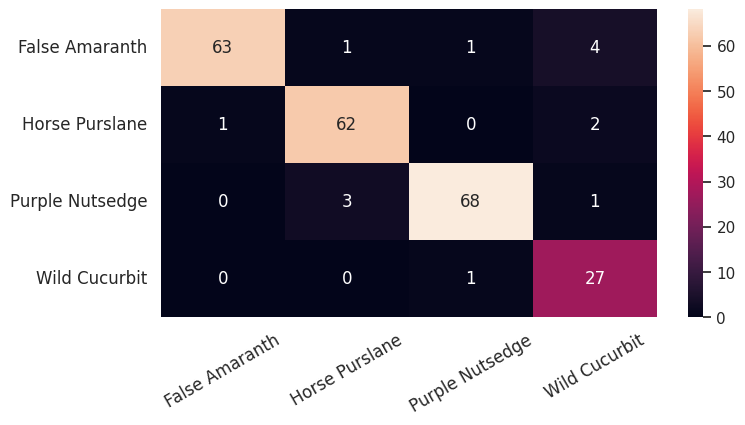

In [ ]:
cm = confusion_matrix(y_test, y_pred)

class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']


plt.figure(figsize=(8, 4))
df_cm = pd.DataFrame(cm, index=class_names,
                     columns=class_names)
sns.set(font_scale=1.0)
sns.heatmap(df_cm, annot=True, annot_kws={"size": 12},  fmt='0.0f')
plt.xticks(rotation=30, fontsize=12)
plt.yticks(fontsize=12)

#plt.savefig('EV2_bo_ftNA_heatmap.png')

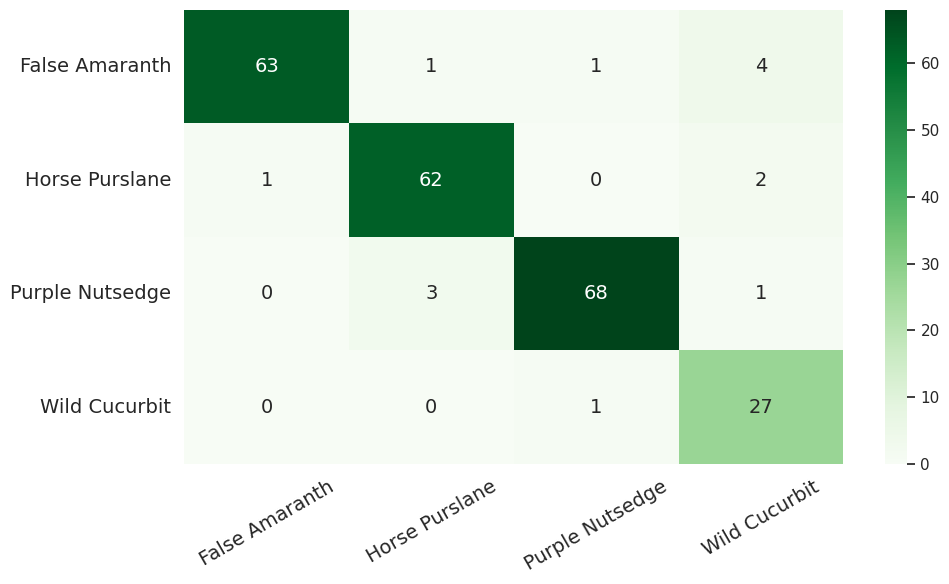

In [ ]:
plt.figure(figsize=(8, 4))
conf_mat = cm / np.sum(cm, 1)
class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']

df_cm1 = pd.DataFrame(conf_mat, index=class_names,
                     columns=class_names)
#sns.set(font_scale=1.0)
sns.heatmap(df_cm1, annot=True, annot_kws={"size": 14}, cmap='Greens',  fmt='0.0f')

plt.xticks(rotation=20, fontsize=12)
plt.yticks(fontsize=12)

In [1]:
import pandas as pd

from decimal import Decimal


#df_cm1

for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], Decimal):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 2))
for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], float):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 1))            
df_cm1

NameError: name 'df_cm1' is not defined

In [ ]:
model = get_architecture(y, Model_version="EfficientNetV2B3", as_feature_extractor=True)

52606240/52606240 [==============================] - 3s 0us/step


In [ ]:
model.summary()

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_6 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 rescaling_5 (Rescaling)     (None, 224, 224, 3)          0         ['input_6[0][0]']             
                                                                                                  
 normalization_4 (Normaliza  (None, 224, 224, 3)          0         ['rescaling_5[0][0]']         
 tion)                                                                                            
                                                                                                  
 stem_conv (Conv2D)          (None, 112, 112, 40)         1080      ['normalization_4[0][0]'

In [ ]:
X_prep = tf.keras.applications.mobilenet_v3.preprocess_input(X)

X_train, X_test, y_train, y_test = train_test_split(
    X_prep,
    y,
    test_size=TEST_SPLIT,
    shuffle=True,
    stratify=y,
    random_state=RANDOM_STATE
)

X_train, X_val, y_train, y_val = train_test_split(
    X_train,
    y_train,
    test_size=VAL_SPLIT,
    shuffle=True,
    stratify=y_train,
    random_state=RANDOM_STATE,
)

In [ ]:

history_EfficientNetV2B3_fe = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=NUM_EPOCHS,
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, NUM_EPOCHS // 2, 0.25),
)
#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final EfficientNetV2B3 (feature-Extractor) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 1/50
187/187 [==============================] - 62s 119ms/step - loss: 1.2382 - accuracy: 0.4330 - val_loss: 1.0193 - val_accuracy: 0.6738
Epoch 2/50
187/187 [==============================] - 17s 92ms/step - loss: 0.8767 - accuracy: 0.6850 - val_loss: 0.7061 - val_accuracy: 0.8289
Epoch 3/50
187/187 [==============================] - 17s 91ms/step - loss: 0.6651 - accuracy: 0.7681 - val_loss: 0.5130 - val_accuracy: 0.9037
Epoch 4/50
187/187 [==============================] - 18s 94ms/step - loss: 0.5187 - accuracy: 0.8164 - val_loss: 0.3279 - val_accuracy: 0.9091
Epoch 5/50
187/187 [==============================] - 17s 91ms/step - loss: 0.4296 - accuracy: 0.8485 - val_loss: 0.2736 - val_accuracy: 0.9144
Epoch 6/50
187/187 [==============================] - 16s 88ms/step - loss: 0.3119 - accuracy: 0.8981 - val_loss: 0.2629 - val_accuracy: 0.9251
Epoch 7/50
187/187 [==============================] - 17s 90ms/step - loss: 0.2877 - accuracy: 0.8928 - val_loss: 0.2776 - val_accuracy

In [ ]:
history_EfficientNetV2B3_fe.history

{'loss': [1.2382456064224243,
  0.8767368793487549,
  0.6651365160942078,
  0.518709659576416,
  0.42960283160209656,
  0.3118944466114044,
  0.28767985105514526,
  0.29788079857826233,
  0.25593453645706177,
  0.19763429462909698,
  0.23291049897670746,
  0.20594915747642517,
  0.18117494881153107,
  0.14014257490634918,
  0.14762035012245178,
  0.1642262190580368,
  0.12086451053619385,
  0.11410608142614365,
  0.14940482378005981,
  0.0949493795633316,
  0.08110030740499496,
  0.07569199055433273,
  0.08125288039445877,
  0.07685121148824692,
  0.09661613404750824,
  0.09216686338186264,
  0.055735331028699875,
  0.07172634452581406,
  0.0832584872841835,
  0.09665578603744507,
  0.07878775894641876,
  0.05768851563334465,
  0.040450166910886765,
  0.0615852028131485,
  0.07105403393507004,
  0.03892985358834267,
  0.04315487667918205,
  0.04769143834710121,
  0.04641280323266983,
  0.07011882215738297,
  0.08554030954837799,
  0.04410087689757347,
  0.042281150817871094,
  0.033826

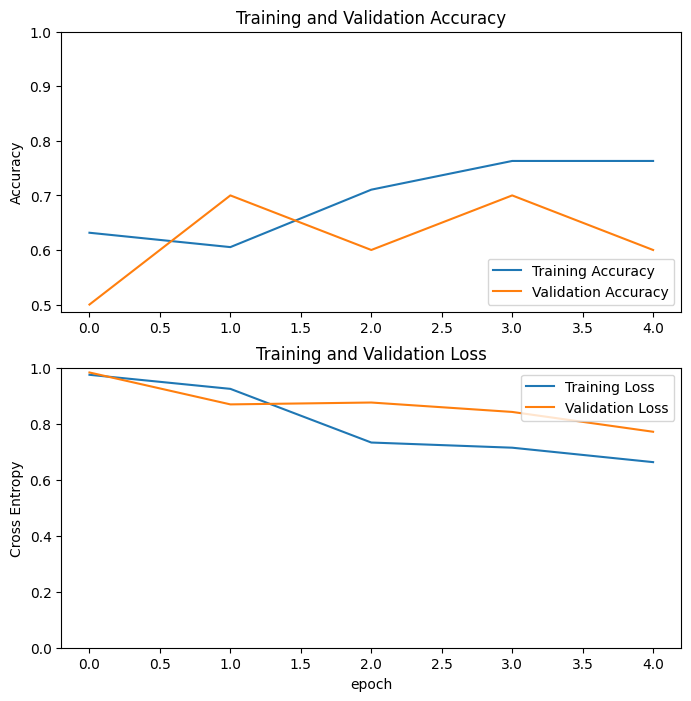

In [32]:
acc = history_EfficientNetV2B3_fe.history['accuracy']
val_acc = history_EfficientNetV2B3_fe.history['val_accuracy']

loss = history_EfficientNetV2B3_fe.history['loss']
val_loss = history_EfficientNetV2B3_fe.history['val_loss']

In [60]:
model = get_architecture(y, Model_version="EfficientNetV2B3", as_feature_extractor=False)

In [25]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                           

 block_3_expand_relu (ReLU)     (None, 56, 56, 144)  0           ['block_3_expand_BN[0][0]']      
                                                                                                  
 block_3_pad (ZeroPadding2D)    (None, 57, 57, 144)  0           ['block_3_expand_relu[0][0]']    
                                                                                                  
 block_3_depthwise (DepthwiseCo  (None, 28, 28, 144)  1296       ['block_3_pad[0][0]']            
 nv2D)                                                                                            
                                                                                                  
 block_3_depthwise_BN (BatchNor  (None, 28, 28, 144)  576        ['block_3_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_3_d

 lization)                                                                                        
                                                                                                  
 block_7_expand (Conv2D)        (None, 14, 14, 384)  24576       ['block_6_project_BN[0][0]']     
                                                                                                  
 block_7_expand_BN (BatchNormal  (None, 14, 14, 384)  1536       ['block_7_expand[0][0]']         
 ization)                                                                                         
                                                                                                  
 block_7_expand_relu (ReLU)     (None, 14, 14, 384)  0           ['block_7_expand_BN[0][0]']      
                                                                                                  
 block_7_depthwise (DepthwiseCo  (None, 14, 14, 384)  3456       ['block_7_expand_relu[0][0]']    
 nv2D)    

                                                                                                  
 block_10_depthwise_relu (ReLU)  (None, 14, 14, 384)  0          ['block_10_depthwise_BN[0][0]']  
                                                                                                  
 block_10_project (Conv2D)      (None, 14, 14, 96)   36864       ['block_10_depthwise_relu[0][0]']
                                                                                                  
 block_10_project_BN (BatchNorm  (None, 14, 14, 96)  384         ['block_10_project[0][0]']       
 alization)                                                                                       
                                                                                                  
 block_11_expand (Conv2D)       (None, 14, 14, 576)  55296       ['block_10_project_BN[0][0]']    
                                                                                                  
 block_11_

 block_14_depthwise (DepthwiseC  (None, 7, 7, 960)   8640        ['block_14_expand_relu[0][0]']   
 onv2D)                                                                                           
                                                                                                  
 block_14_depthwise_BN (BatchNo  (None, 7, 7, 960)   3840        ['block_14_depthwise[0][0]']     
 rmalization)                                                                                     
                                                                                                  
 block_14_depthwise_relu (ReLU)  (None, 7, 7, 960)   0           ['block_14_depthwise_BN[0][0]']  
                                                                                                  
 block_14_project (Conv2D)      (None, 7, 7, 160)    153600      ['block_14_depthwise_relu[0][0]']
                                                                                                  
 block_14_

In [30]:

history__ft = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=total_epochs,
    initial_epoch = history_EfficientNetV2B3_fe.epoch[-1],
    
    
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, total_epochs // 2, 0.25),
)

#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final EfficientNetV2B3 (Fine-Tune) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 5/15
10/10 [==============================] - 14s 948ms/step - loss: 1.4189 - accuracy: 0.3684 - val_loss: 1.4031 - val_accuracy: 0.3000
Epoch 6/15
10/10 [==============================] - 8s 843ms/step - loss: 0.8484 - accuracy: 0.6842 - val_loss: 1.2818 - val_accuracy: 0.5000
Epoch 7/15
10/10 [==============================] - 8s 758ms/step - loss: 1.0287 - accuracy: 0.6316 - val_loss: 1.4217 - val_accuracy: 0.3000
Epoch 8/15
10/10 [==============================] - 8s 787ms/step - loss: 0.4423 - accuracy: 0.8158 - val_loss: 1.4566 - val_accuracy: 0.4000
Epoch 9/15
10/10 [==============================] - 9s 927ms/step - loss: 0.3196 - accuracy: 0.8947 - val_loss: 1.5023 - val_accuracy: 0.6000
Epoch 10/15
10/10 [==============================] - 9s 867ms/step - loss: 0.1549 - accuracy: 0.9737 - val_loss: 1.5191 - val_accuracy: 0.6000
Epoch 11/15
10/10 [==============================] - 8s 784ms/step - loss: 0.2514 - accuracy: 0.9474 - val_loss: 1.8953 - val_accuracy: 0.5000
Epo

In [33]:
acc += history_EfficientNetV2B3_ft.history['accuracy']
val_acc += history_EfficientNetV2B3_ft.history['val_accuracy']

loss += history_EfficientNetV2B3_ft.history['loss']
val_loss += history_EfficientNetV2B3_ft.history['val_loss']

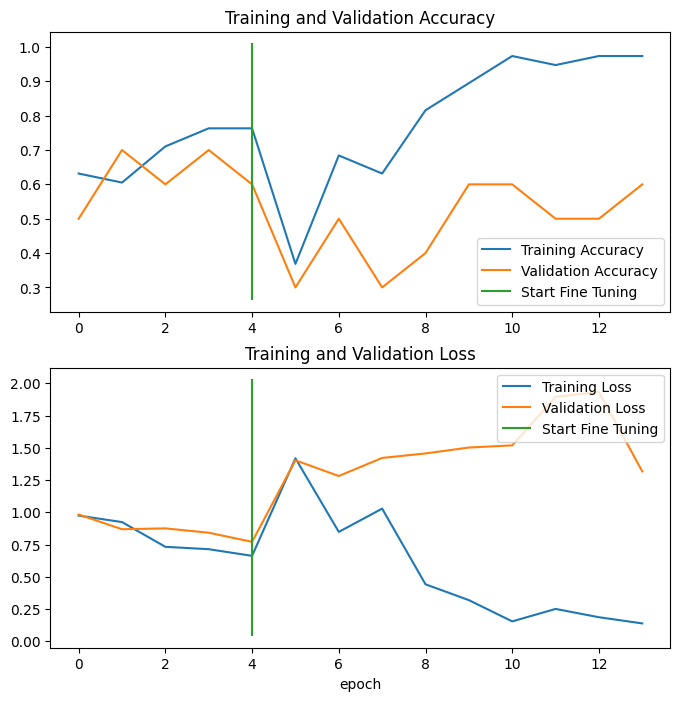

In [34]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
#plt.ylim([0.8, 1])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
#plt.ylim([0, 1.0])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

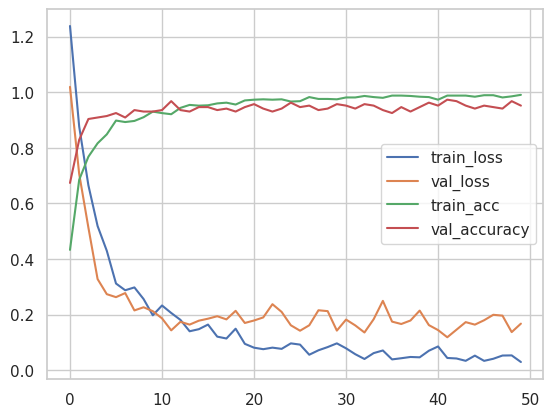

In [ ]:
# plot the loss and accuracy curves
plt.plot(history_EfficientNetV2B3_ft.history['loss'], label='train_loss')
plt.plot(history_EfficientNetV2B3_ft.history['val_loss'], label='val_loss')
plt.plot(history_EfficientNetV2B3_ft.history['accuracy'], label='train_acc')
plt.plot(history_EfficientNetV2B3_ft.history['val_accuracy'], label='val_accuracy')
plt.legend()
plt.show()

In [ ]:
y_pred = model.predict(X_test)

8/8 [==============================] - 5s 207ms/step


In [ ]:
y_pred = np.argmax(y_pred, axis=1)
y_test = np.argmax(y_test, axis=1)

In [ ]:
print('Classification Report EfficientNetV2B3:\n', classification_report(y_test, y_pred))

Classification Report EfficientNetV2B3:
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        69
           1       0.89      0.98      0.93        65
           2       0.99      0.97      0.98        72
           3       0.93      0.96      0.95        28

    accuracy                           0.95       234
   macro avg       0.95      0.95      0.95       234
weighted avg       0.96      0.95      0.95       234



(array([0.5, 1.5, 2.5, 3.5]),
 [Text(0, 0.5, 'False Amaranth'),
  Text(0, 1.5, 'Horse Purslane'),
  Text(0, 2.5, 'Purple Nutsedge'),
  Text(0, 3.5, 'Wild Cucurbit')])

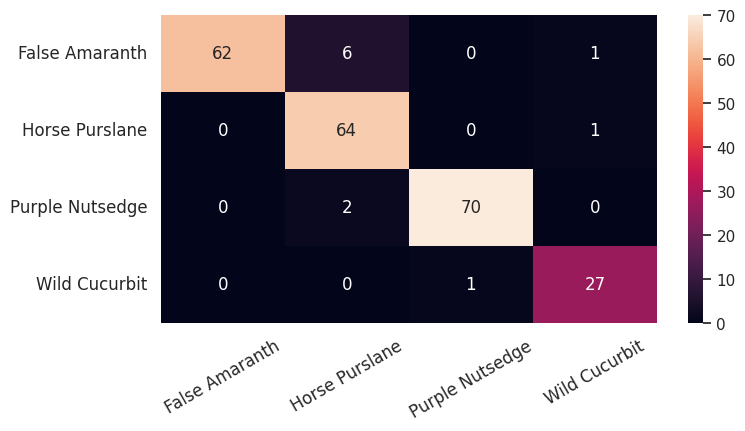

In [ ]:
cm = confusion_matrix(y_test, y_pred)

class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']


plt.figure(figsize=(8, 4))
df_cm = pd.DataFrame(cm, index=class_names,
                     columns=class_names)
sns.set(font_scale=1.0)
sns.heatmap(df_cm, annot=True, annot_kws={"size": 12},  fmt='0.0f')
plt.xticks(rotation=30, fontsize=12)
plt.yticks(fontsize=12)

#plt.savefig('EV2_bo_ftNA_heatmap.png')

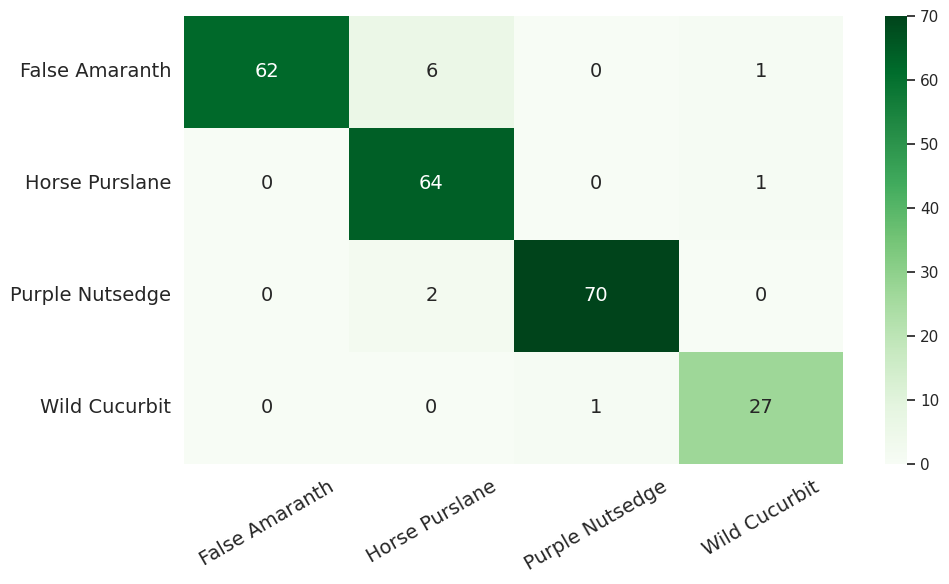

In [ ]:
plt.figure(figsize=(8, 4))
conf_mat = cm / np.sum(cm, 1)
class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']

df_cm1 = pd.DataFrame(conf_mat, index=class_names,
                     columns=class_names)
#sns.set(font_scale=1.0)
sns.heatmap(df_cm1, annot=True, annot_kws={"size": 14}, cmap='Greens',  fmt='0.0f')

plt.xticks(rotation=20, fontsize=12)
plt.yticks(fontsize=12)

In [1]:
import pandas as pd

from decimal import Decimal


#df_cm1

for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], Decimal):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 2))
for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], float):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 1))            
df_cm1

NameError: name 'df_cm1' is not defined

In [ ]:
model = get_architecture(y, Model_version="NASNetMobile", as_feature_extractor=True)

19993432/19993432 [==============================] - 2s 0us/step


In [ ]:
model.summary()

Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_7 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 stem_conv1 (Conv2D)         (None, 111, 111, 32)         864       ['input_7[0][0]']             
                                                                                                  
 stem_bn1 (BatchNormalizati  (None, 111, 111, 32)         128       ['stem_conv1[0][0]']          
 on)                                                                                              
                                                                                                  
 activation (Activation)     (None, 111, 111, 32)         0         ['stem_bn1[0][0]']      

In [ ]:
X_prep = tf.keras.applications.mobilenet_v3.preprocess_input(X)

X_train, X_test, y_train, y_test = train_test_split(
    X_prep,
    y,
    test_size=TEST_SPLIT,
    shuffle=True,
    stratify=y,
    random_state=RANDOM_STATE
)

X_train, X_val, y_train, y_val = train_test_split(
    X_train,
    y_train,
    test_size=VAL_SPLIT,
    shuffle=True,
    stratify=y_train,
    random_state=RANDOM_STATE,
)

In [ ]:

history_NASNetMobile_fe = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=NUM_EPOCHS,
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, NUM_EPOCHS // 2, 0.25),
)
#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final NASNetMobile (Feature-Extractor) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 1/50
187/187 [==============================] - 116s 184ms/step - loss: 0.8905 - accuracy: 0.6501 - val_loss: 1.6914 - val_accuracy: 0.2781
Epoch 2/50
187/187 [==============================] - 24s 129ms/step - loss: 0.5821 - accuracy: 0.7922 - val_loss: 1.5403 - val_accuracy: 0.2139
Epoch 3/50
187/187 [==============================] - 24s 126ms/step - loss: 0.3971 - accuracy: 0.8740 - val_loss: 1.6821 - val_accuracy: 0.1765
Epoch 4/50
187/187 [==============================] - 26s 140ms/step - loss: 0.3513 - accuracy: 0.8861 - val_loss: 1.2994 - val_accuracy: 0.4225
Epoch 5/50
187/187 [==============================] - 25s 133ms/step - loss: 0.2600 - accuracy: 0.9048 - val_loss: 1.4351 - val_accuracy: 0.3262
Epoch 6/50
187/187 [==============================] - 26s 141ms/step - loss: 0.1784 - accuracy: 0.9437 - val_loss: 1.3620 - val_accuracy: 0.4492
Epoch 7/50
187/187 [==============================] - 27s 142ms/step - loss: 0.1187 - accuracy: 0.9571 - val_loss: 1.2038 - val_a

In [ ]:
history_NASNetMobile_fe.history

{'loss': [0.8904631733894348,
  0.582099199295044,
  0.3971002399921417,
  0.3512756824493408,
  0.25998520851135254,
  0.17844046652317047,
  0.11874695122241974,
  0.14054998755455017,
  0.09342131018638611,
  0.1422460973262787,
  0.09762176126241684,
  0.09165722131729126,
  0.10035579651594162,
  0.06418905407190323,
  0.06892355531454086,
  0.07678523659706116,
  0.03772521764039993,
  0.038527023047208786,
  0.030784059315919876,
  0.04188894107937813,
  0.04608066380023956,
  0.053390324115753174,
  0.017668001353740692,
  0.03925545886158943,
  0.012826337479054928,
  0.02489139325916767,
  0.022377479821443558,
  0.007046793587505817,
  0.005797733087092638,
  0.007273504510521889,
  0.018889812752604485,
  0.01821361668407917,
  0.007657086942344904,
  0.006204754114151001,
  0.006549089681357145,
  0.0036894187796860933,
  0.01817980222404003,
  0.0195212010294199,
  0.008241953328251839,
  0.014771484769880772,
  0.00623893178999424,
  0.00902776699513197,
  0.013724572956

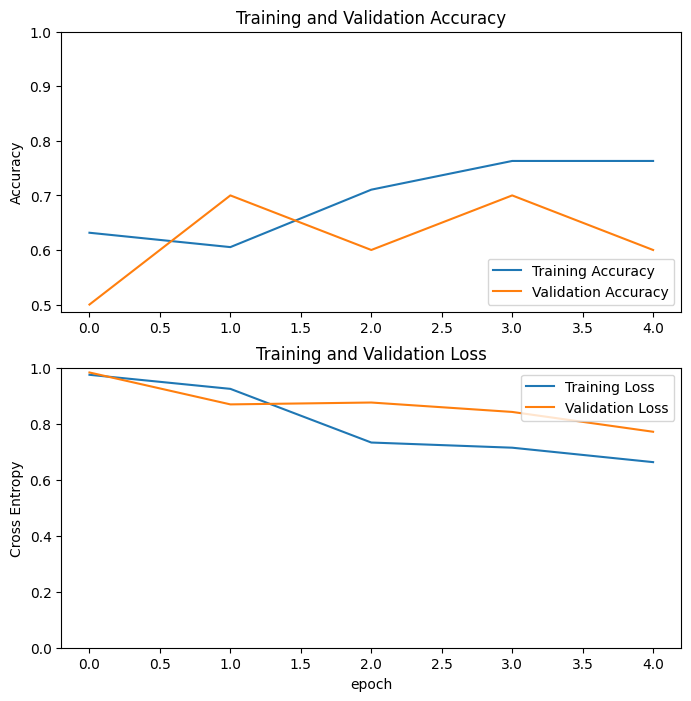

In [32]:
acc = history_NASNetMobile_fe.history['accuracy']
val_acc = history_NASNetMobile_fe.history['val_accuracy']

loss = history_NASNetMobile_fe.history['loss']
val_loss = history_NASNetMobile_fe.history['val_loss']

In [60]:
model = get_architecture(y, Model_version="NASNetMobile", as_feature_extractor=False)

In [25]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                           

 block_3_expand_relu (ReLU)     (None, 56, 56, 144)  0           ['block_3_expand_BN[0][0]']      
                                                                                                  
 block_3_pad (ZeroPadding2D)    (None, 57, 57, 144)  0           ['block_3_expand_relu[0][0]']    
                                                                                                  
 block_3_depthwise (DepthwiseCo  (None, 28, 28, 144)  1296       ['block_3_pad[0][0]']            
 nv2D)                                                                                            
                                                                                                  
 block_3_depthwise_BN (BatchNor  (None, 28, 28, 144)  576        ['block_3_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_3_d

 lization)                                                                                        
                                                                                                  
 block_7_expand (Conv2D)        (None, 14, 14, 384)  24576       ['block_6_project_BN[0][0]']     
                                                                                                  
 block_7_expand_BN (BatchNormal  (None, 14, 14, 384)  1536       ['block_7_expand[0][0]']         
 ization)                                                                                         
                                                                                                  
 block_7_expand_relu (ReLU)     (None, 14, 14, 384)  0           ['block_7_expand_BN[0][0]']      
                                                                                                  
 block_7_depthwise (DepthwiseCo  (None, 14, 14, 384)  3456       ['block_7_expand_relu[0][0]']    
 nv2D)    

                                                                                                  
 block_10_depthwise_relu (ReLU)  (None, 14, 14, 384)  0          ['block_10_depthwise_BN[0][0]']  
                                                                                                  
 block_10_project (Conv2D)      (None, 14, 14, 96)   36864       ['block_10_depthwise_relu[0][0]']
                                                                                                  
 block_10_project_BN (BatchNorm  (None, 14, 14, 96)  384         ['block_10_project[0][0]']       
 alization)                                                                                       
                                                                                                  
 block_11_expand (Conv2D)       (None, 14, 14, 576)  55296       ['block_10_project_BN[0][0]']    
                                                                                                  
 block_11_

 block_14_depthwise (DepthwiseC  (None, 7, 7, 960)   8640        ['block_14_expand_relu[0][0]']   
 onv2D)                                                                                           
                                                                                                  
 block_14_depthwise_BN (BatchNo  (None, 7, 7, 960)   3840        ['block_14_depthwise[0][0]']     
 rmalization)                                                                                     
                                                                                                  
 block_14_depthwise_relu (ReLU)  (None, 7, 7, 960)   0           ['block_14_depthwise_BN[0][0]']  
                                                                                                  
 block_14_project (Conv2D)      (None, 7, 7, 160)    153600      ['block_14_depthwise_relu[0][0]']
                                                                                                  
 block_14_

In [30]:

history_NASNetMobile_ft = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=total_epochs,
    initial_epoch = history_NASNetMobile_fe.epoch[-1],
    
    
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, total_epochs // 2, 0.25),
)

#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final NASNetMobile (Fine-Tune) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 5/15
10/10 [==============================] - 14s 948ms/step - loss: 1.4189 - accuracy: 0.3684 - val_loss: 1.4031 - val_accuracy: 0.3000
Epoch 6/15
10/10 [==============================] - 8s 843ms/step - loss: 0.8484 - accuracy: 0.6842 - val_loss: 1.2818 - val_accuracy: 0.5000
Epoch 7/15
10/10 [==============================] - 8s 758ms/step - loss: 1.0287 - accuracy: 0.6316 - val_loss: 1.4217 - val_accuracy: 0.3000
Epoch 8/15
10/10 [==============================] - 8s 787ms/step - loss: 0.4423 - accuracy: 0.8158 - val_loss: 1.4566 - val_accuracy: 0.4000
Epoch 9/15
10/10 [==============================] - 9s 927ms/step - loss: 0.3196 - accuracy: 0.8947 - val_loss: 1.5023 - val_accuracy: 0.6000
Epoch 10/15
10/10 [==============================] - 9s 867ms/step - loss: 0.1549 - accuracy: 0.9737 - val_loss: 1.5191 - val_accuracy: 0.6000
Epoch 11/15
10/10 [==============================] - 8s 784ms/step - loss: 0.2514 - accuracy: 0.9474 - val_loss: 1.8953 - val_accuracy: 0.5000
Epo

In [33]:
acc += history_NASNetMobile_ft.history['accuracy']
val_acc += history_NASNetMobile_ft.history['val_accuracy']

loss += history_NASNetMobile_ft.history['loss']
val_loss += history_NASNetMobile_ft.history['val_loss']

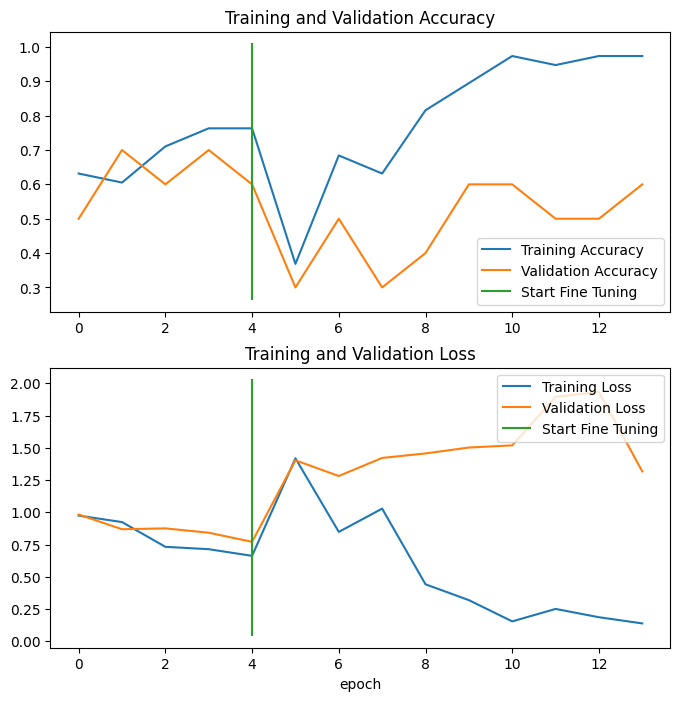

In [34]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
#plt.ylim([0.8, 1])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
#plt.ylim([0, 1.0])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

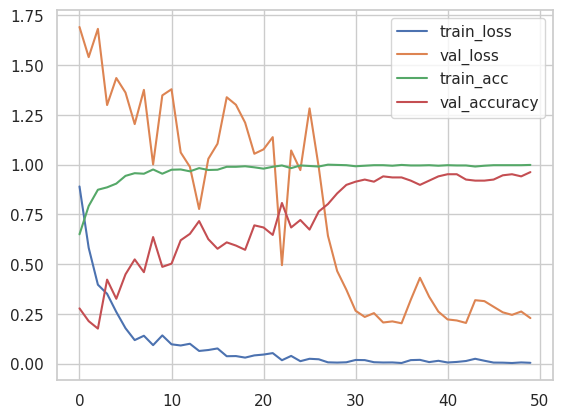

In [ ]:
# plot the loss and accuracy curves
plt.plot(history_NASNetMobile_ft.history['loss'], label='train_loss')
plt.plot(history_NASNetMobile_ft.history['val_loss'], label='val_loss')
plt.plot(history_NASNetMobile_ft.history['accuracy'], label='train_acc')
plt.plot(history_NASNetMobile_ft.history['val_accuracy'], label='val_accuracy')
plt.legend()
plt.show()

In [ ]:
y_pred = model.predict(X_test)

8/8 [==============================] - 6s 162ms/step


In [ ]:
y_pred = np.argmax(y_pred, axis=1)
y_test = np.argmax(y_test, axis=1)

In [ ]:
print('Classification Report NASNetMobile:\n', classification_report(y_test, y_pred))

Classification Report NASNetMobile:
               precision    recall  f1-score   support

           0       1.00      0.84      0.91        69
           1       0.88      0.98      0.93        65
           2       0.96      0.94      0.95        72
           3       0.78      0.89      0.83        28

    accuracy                           0.92       234
   macro avg       0.90      0.92      0.91       234
weighted avg       0.93      0.92      0.92       234



In [1]:
cm = confusion_matrix(y_test, y_pred)

class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']


plt.figure(figsize=(8, 4))
df_cm = pd.DataFrame(cm, index=class_names,
                     columns=class_names)
sns.set(font_scale=1.0)
sns.heatmap(df_cm, annot=True, annot_kws={"size": 12},  fmt='0.0f')
plt.xticks(rotation=30, fontsize=12)
plt.yticks(fontsize=12)

#plt.savefig('EV2_bo_ftNA_heatmap.png')

NameError: name 'confusion_matrix' is not defined

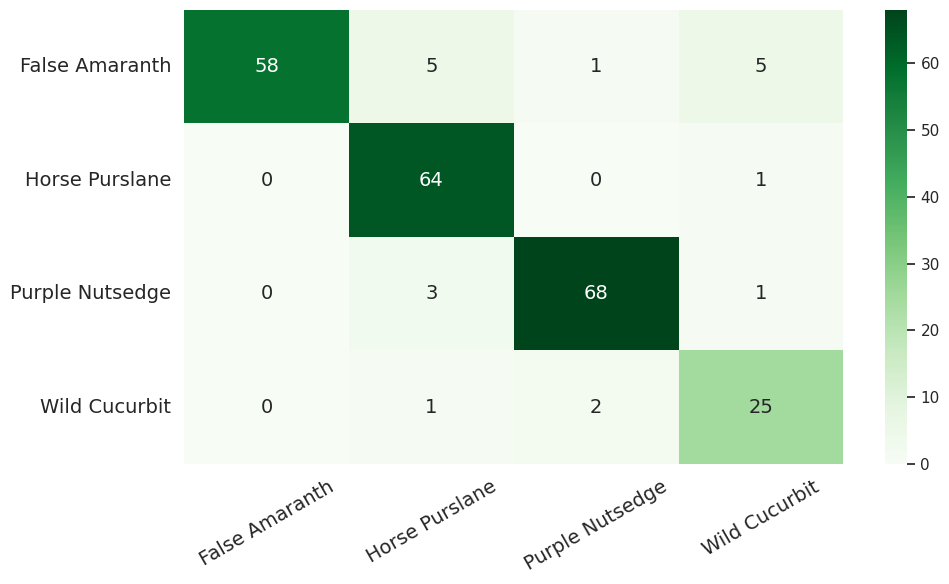

In [ ]:
plt.figure(figsize=(8, 4))
conf_mat = cm / np.sum(cm, 1)
class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']

df_cm1 = pd.DataFrame(conf_mat, index=class_names,
                     columns=class_names)
#sns.set(font_scale=1.0)
sns.heatmap(df_cm1, annot=True, annot_kws={"size": 14}, cmap='Greens',  fmt='0.0f')

plt.xticks(rotation=20, fontsize=12)
plt.yticks(fontsize=12)

In [1]:
import pandas as pd

from decimal import Decimal


#df_cm1

for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], Decimal):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 2))
for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], float):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 1))            
df_cm1

NameError: name 'df_cm1' is not defined

In [ ]:
model = get_architecture(y, Model_version="DenseNet121", as_feature_extractor=True)

29084464/29084464 [==============================] - 2s 0us/step


In [ ]:
model.summary()

Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_8 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 zero_padding2d_4 (ZeroPadd  (None, 230, 230, 3)          0         ['input_8[0][0]']             
 ing2D)                                                                                           
                                                                                                  
 conv1/conv (Conv2D)         (None, 112, 112, 64)         9408      ['zero_padding2d_4[0][0]']    
                                                                                                  
 conv1/bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1/conv[0][0]']    

In [ ]:
X_prep = tf.keras.applications.mobilenet_v3.preprocess_input(X)

X_train, X_test, y_train, y_test = train_test_split(
    X_prep,
    y,
    test_size=TEST_SPLIT,
    shuffle=True,
    stratify=y,
    random_state=RANDOM_STATE
)

X_train, X_val, y_train, y_val = train_test_split(
    X_train,
    y_train,
    test_size=VAL_SPLIT,
    shuffle=True,
    stratify=y_train,
    random_state=RANDOM_STATE,
)

In [ ]:

history_DenseNet121_fe = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=NUM_EPOCHS,
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, NUM_EPOCHS // 2, 0.25),
)
#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final DenseNet121 (Feature_extractor) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 1/50
187/187 [==============================] - 69s 149ms/step - loss: 0.9180 - accuracy: 0.6555 - val_loss: 0.7131 - val_accuracy: 0.7487
Epoch 2/50
187/187 [==============================] - 16s 87ms/step - loss: 0.6789 - accuracy: 0.7440 - val_loss: 0.8642 - val_accuracy: 0.6791
Epoch 3/50
187/187 [==============================] - 17s 89ms/step - loss: 0.4998 - accuracy: 0.8311 - val_loss: 0.2675 - val_accuracy: 0.9198
Epoch 4/50
187/187 [==============================] - 16s 84ms/step - loss: 0.4344 - accuracy: 0.8432 - val_loss: 0.3941 - val_accuracy: 0.8717
Epoch 5/50
187/187 [==============================] - 16s 84ms/step - loss: 0.4068 - accuracy: 0.8686 - val_loss: 0.3919 - val_accuracy: 0.8610
Epoch 6/50
187/187 [==============================] - 16s 84ms/step - loss: 0.4283 - accuracy: 0.8566 - val_loss: 0.3781 - val_accuracy: 0.8930
Epoch 7/50
187/187 [==============================] - 16s 86ms/step - loss: 0.2761 - accuracy: 0.9088 - val_loss: 0.3986 - val_accuracy

In [ ]:
history_DenseNet121_fe.history

{'loss': [0.9180324077606201,
  0.6789078712463379,
  0.4997695982456207,
  0.4344054162502289,
  0.4067975878715515,
  0.4283306896686554,
  0.2761441469192505,
  0.29206326603889465,
  0.2648618221282959,
  0.3173176050186157,
  0.17070259153842926,
  0.26283958554267883,
  0.18514597415924072,
  0.19304272532463074,
  0.16275399923324585,
  0.15172353386878967,
  0.14355212450027466,
  0.14677917957305908,
  0.13300247490406036,
  0.10270515084266663,
  0.1517668068408966,
  0.1331080049276352,
  0.07473726570606232,
  0.05755073204636574,
  0.15341366827487946,
  0.1370193511247635,
  0.09321640431880951,
  0.08490323275327682,
  0.09221061319112778,
  0.05882440507411957,
  0.11383292824029922,
  0.10269543528556824,
  0.12441709637641907,
  0.08333371579647064,
  0.11616973578929901,
  0.0627671331167221,
  0.03533755987882614,
  0.06873707473278046,
  0.04668564721941948,
  0.06961816549301147,
  0.01679201051592827,
  0.07100600004196167,
  0.05094783008098602,
  0.059004459530

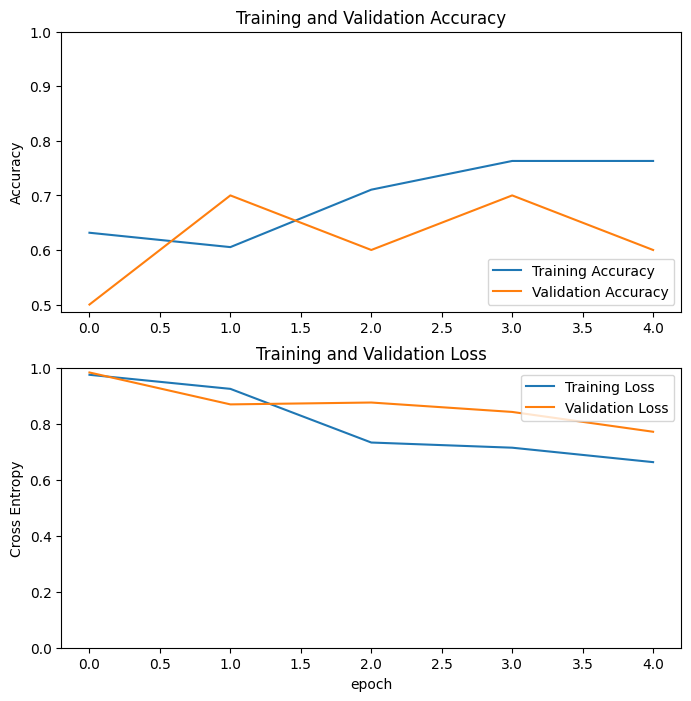

In [32]:
acc = history_DenseNet121_fe.history['accuracy']
val_acc = history_DenseNet121_fe.history['val_accuracy']

loss = history_DenseNet121_fe.history['loss']
val_loss = history_DenseNet121_fe.history['val_loss']

In [60]:
model = get_architecture(y, Model_version="DenseNet121", as_feature_extractor=False)

In [25]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                           

 block_3_expand_relu (ReLU)     (None, 56, 56, 144)  0           ['block_3_expand_BN[0][0]']      
                                                                                                  
 block_3_pad (ZeroPadding2D)    (None, 57, 57, 144)  0           ['block_3_expand_relu[0][0]']    
                                                                                                  
 block_3_depthwise (DepthwiseCo  (None, 28, 28, 144)  1296       ['block_3_pad[0][0]']            
 nv2D)                                                                                            
                                                                                                  
 block_3_depthwise_BN (BatchNor  (None, 28, 28, 144)  576        ['block_3_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_3_d

 lization)                                                                                        
                                                                                                  
 block_7_expand (Conv2D)        (None, 14, 14, 384)  24576       ['block_6_project_BN[0][0]']     
                                                                                                  
 block_7_expand_BN (BatchNormal  (None, 14, 14, 384)  1536       ['block_7_expand[0][0]']         
 ization)                                                                                         
                                                                                                  
 block_7_expand_relu (ReLU)     (None, 14, 14, 384)  0           ['block_7_expand_BN[0][0]']      
                                                                                                  
 block_7_depthwise (DepthwiseCo  (None, 14, 14, 384)  3456       ['block_7_expand_relu[0][0]']    
 nv2D)    

                                                                                                  
 block_10_depthwise_relu (ReLU)  (None, 14, 14, 384)  0          ['block_10_depthwise_BN[0][0]']  
                                                                                                  
 block_10_project (Conv2D)      (None, 14, 14, 96)   36864       ['block_10_depthwise_relu[0][0]']
                                                                                                  
 block_10_project_BN (BatchNorm  (None, 14, 14, 96)  384         ['block_10_project[0][0]']       
 alization)                                                                                       
                                                                                                  
 block_11_expand (Conv2D)       (None, 14, 14, 576)  55296       ['block_10_project_BN[0][0]']    
                                                                                                  
 block_11_

 block_14_depthwise (DepthwiseC  (None, 7, 7, 960)   8640        ['block_14_expand_relu[0][0]']   
 onv2D)                                                                                           
                                                                                                  
 block_14_depthwise_BN (BatchNo  (None, 7, 7, 960)   3840        ['block_14_depthwise[0][0]']     
 rmalization)                                                                                     
                                                                                                  
 block_14_depthwise_relu (ReLU)  (None, 7, 7, 960)   0           ['block_14_depthwise_BN[0][0]']  
                                                                                                  
 block_14_project (Conv2D)      (None, 7, 7, 160)    153600      ['block_14_depthwise_relu[0][0]']
                                                                                                  
 block_14_

In [30]:

history_DenseNet121_ft = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=total_epochs,
    initial_epoch = history_DenseNet121_fe.epoch[-1],
    
    
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, total_epochs // 2, 0.25),
)

#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final DenseNet121(Fine-Tune) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 5/15
10/10 [==============================] - 14s 948ms/step - loss: 1.4189 - accuracy: 0.3684 - val_loss: 1.4031 - val_accuracy: 0.3000
Epoch 6/15
10/10 [==============================] - 8s 843ms/step - loss: 0.8484 - accuracy: 0.6842 - val_loss: 1.2818 - val_accuracy: 0.5000
Epoch 7/15
10/10 [==============================] - 8s 758ms/step - loss: 1.0287 - accuracy: 0.6316 - val_loss: 1.4217 - val_accuracy: 0.3000
Epoch 8/15
10/10 [==============================] - 8s 787ms/step - loss: 0.4423 - accuracy: 0.8158 - val_loss: 1.4566 - val_accuracy: 0.4000
Epoch 9/15
10/10 [==============================] - 9s 927ms/step - loss: 0.3196 - accuracy: 0.8947 - val_loss: 1.5023 - val_accuracy: 0.6000
Epoch 10/15
10/10 [==============================] - 9s 867ms/step - loss: 0.1549 - accuracy: 0.9737 - val_loss: 1.5191 - val_accuracy: 0.6000
Epoch 11/15
10/10 [==============================] - 8s 784ms/step - loss: 0.2514 - accuracy: 0.9474 - val_loss: 1.8953 - val_accuracy: 0.5000
Epo

In [33]:
acc += history_DenseNet121_ft.history['accuracy']
val_acc += history_DenseNet121_ft.history['val_accuracy']

loss += history_DenseNet121_ft.history['loss']
val_loss += history_DenseNet121_ft.history['val_loss']

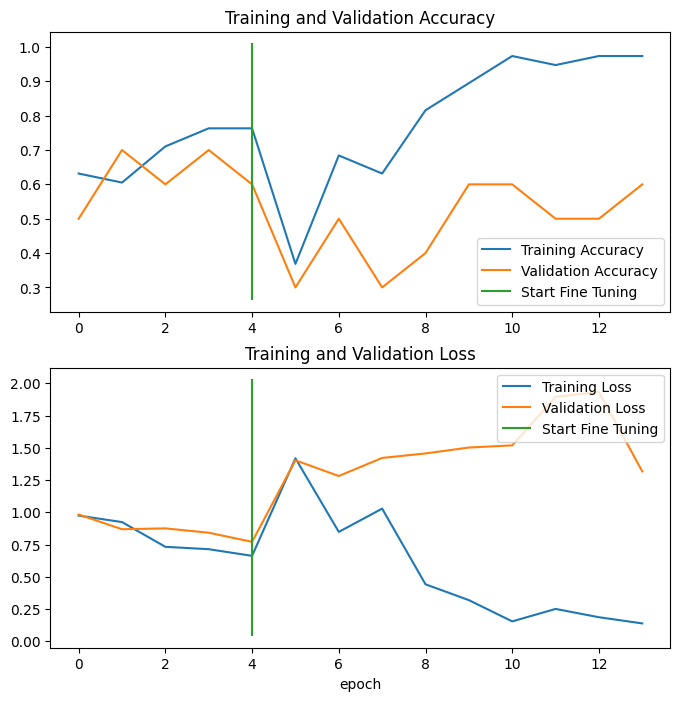

In [34]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
#plt.ylim([0.8, 1])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
#plt.ylim([0, 1.0])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

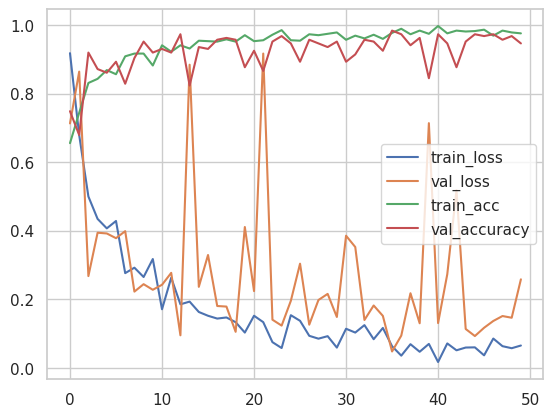

In [ ]:
# plot the loss and accuracy curves
plt.plot(history_DenseNet121_ft.history['loss'], label='train_loss')
plt.plot(history_DenseNet121_ft.history['val_loss'], label='val_loss')
plt.plot(history_DenseNet121_ft.history['accuracy'], label='train_acc')
plt.plot(history_DenseNet121_ft.history['val_accuracy'], label='val_accuracy')
plt.legend()
plt.show()

In [ ]:
y_pred = model.predict(X_test)

8/8 [==============================] - 9s 500ms/step


In [ ]:
y_pred = np.argmax(y_pred, axis=1)
y_test = np.argmax(y_test, axis=1)

In [ ]:
print('Classification Report DenseNet121:\n', classification_report(y_test, y_pred))

Classification Report DenseNet121:
               precision    recall  f1-score   support

           0       1.00      0.94      0.97        69
           1       0.96      1.00      0.98        65
           2       0.97      1.00      0.99        72
           3       0.93      0.89      0.91        28

    accuracy                           0.97       234
   macro avg       0.96      0.96      0.96       234
weighted avg       0.97      0.97      0.97       234



(array([0.5, 1.5, 2.5, 3.5]),
 [Text(0, 0.5, 'False Amaranth'),
  Text(0, 1.5, 'Horse Purslane'),
  Text(0, 2.5, 'Purple Nutsedge'),
  Text(0, 3.5, 'Wild Cucurbit')])

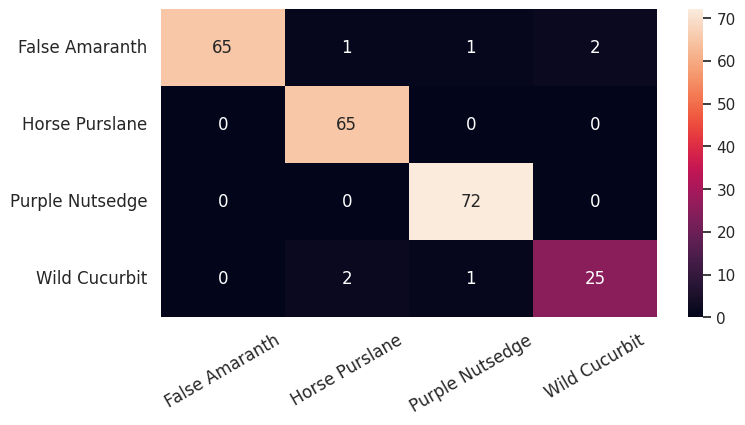

In [ ]:
cm = confusion_matrix(y_test, y_pred)

class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']


plt.figure(figsize=(8, 4))
df_cm = pd.DataFrame(cm, index=class_names,
                     columns=class_names)
sns.set(font_scale=1.0)
sns.heatmap(df_cm, annot=True, annot_kws={"size": 12},  fmt='0.0f')
plt.xticks(rotation=30, fontsize=12)
plt.yticks(fontsize=12)

#plt.savefig('EV2_bo_ftNA_heatmap.png')

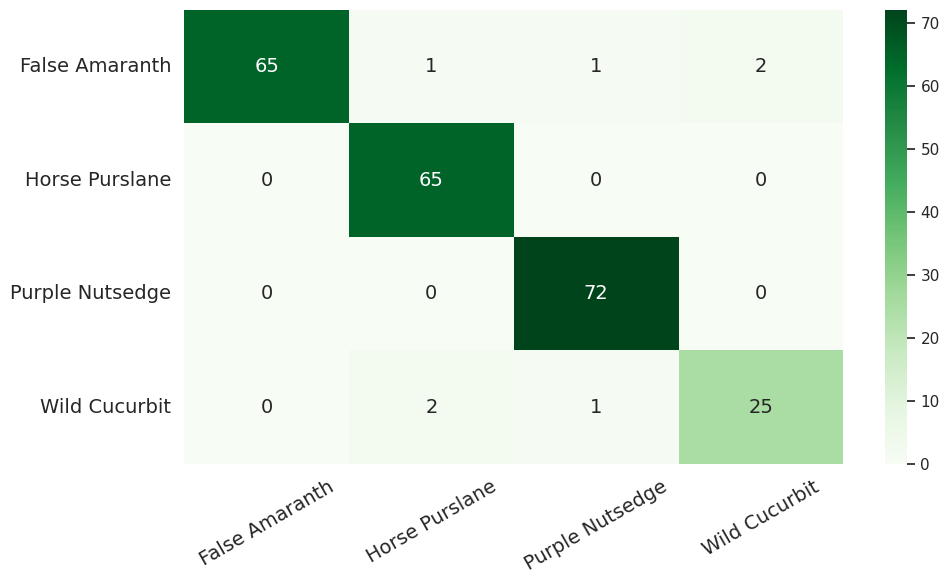

In [ ]:
plt.figure(figsize=(8, 4))
conf_mat = cm / np.sum(cm, 1)
class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']

df_cm1 = pd.DataFrame(conf_mat, index=class_names,
                     columns=class_names)
#sns.set(font_scale=1.0)
sns.heatmap(df_cm1, annot=True, annot_kws={"size": 14}, cmap='Greens',  fmt='0.0f')

plt.xticks(rotation=20, fontsize=12)
plt.yticks(fontsize=12)

In [1]:
import pandas as pd

from decimal import Decimal


#df_cm1

for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], Decimal):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 2))
for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], float):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 1))            
df_cm1

NameError: name 'df_cm1' is not defined

In [ ]:
model = get_architecture(y, Model_version="DenseNet201", as_feature_extractor=True)

74836368/74836368 [==============================] - 3s 0us/step


In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 zero_padding2d (ZeroPaddin  (None, 230, 230, 3)          0         ['input_1[0][0]']             
 g2D)                                                                                             
                                                                                                  
 conv1/conv (Conv2D)         (None, 112, 112, 64)         9408      ['zero_padding2d[0][0]']      
                                                                                                  
 conv1/bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1/conv[0][0]']      

In [ ]:
X_prep = tf.keras.applications.mobilenet_v3.preprocess_input(X)

X_train, X_test, y_train, y_test = train_test_split(
    X_prep,
    y,
    test_size=TEST_SPLIT,
    shuffle=True,
    stratify=y,
    random_state=RANDOM_STATE
)

X_train, X_val, y_train, y_val = train_test_split(
    X_train,
    y_train,
    test_size=VAL_SPLIT,
    shuffle=True,
    stratify=y_train,
    random_state=RANDOM_STATE,
)

In [ ]:

history_DenseNet201_fe = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=NUM_EPOCHS,
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, NUM_EPOCHS // 2, 0.25),
)
#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final DenseNet201 (Feature-Extractor) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 1/50
187/187 [==============================] - 151s 262ms/step - loss: 0.8704 - accuracy: 0.6743 - val_loss: 0.4672 - val_accuracy: 0.8128
Epoch 2/50
187/187 [==============================] - 30s 161ms/step - loss: 0.5708 - accuracy: 0.7775 - val_loss: 0.4402 - val_accuracy: 0.8235
Epoch 3/50
187/187 [==============================] - 28s 149ms/step - loss: 0.4647 - accuracy: 0.8418 - val_loss: 1.0593 - val_accuracy: 0.6364
Epoch 4/50
187/187 [==============================] - 30s 163ms/step - loss: 0.3762 - accuracy: 0.8794 - val_loss: 0.3166 - val_accuracy: 0.8770
Epoch 5/50
187/187 [==============================] - 29s 156ms/step - loss: 0.3771 - accuracy: 0.8633 - val_loss: 0.1228 - val_accuracy: 0.9626
Epoch 6/50
187/187 [==============================] - 28s 151ms/step - loss: 0.2437 - accuracy: 0.9142 - val_loss: 0.3988 - val_accuracy: 0.8556
Epoch 7/50
187/187 [==============================] - 27s 142ms/step - loss: 0.2442 - accuracy: 0.9330 - val_loss: 0.1501 - val_a

In [ ]:
history_DenseNet201_fe.history

{'loss': [0.8703902363777161,
  0.5707545280456543,
  0.4647441804409027,
  0.3761674761772156,
  0.3771037757396698,
  0.24365772306919098,
  0.2442186027765274,
  0.26436150074005127,
  0.1733088493347168,
  0.2036634087562561,
  0.16941359639167786,
  0.19158990681171417,
  0.22431986033916473,
  0.13914529979228973,
  0.1299266517162323,
  0.12253276258707047,
  0.15112562477588654,
  0.09022335708141327,
  0.10248301923274994,
  0.11157404631376266,
  0.10896454006433487,
  0.1188468188047409,
  0.14074695110321045,
  0.1140463799238205,
  0.11322735995054245,
  0.0567098967730999,
  0.039824530482292175,
  0.09706022590398788,
  0.11079864948987961,
  0.07639690488576889,
  0.05344344303011894,
  0.0506122000515461,
  0.038104888051748276,
  0.03411181643605232,
  0.07895281165838242,
  0.06107022613286972,
  0.05700450390577316,
  0.0537959448993206,
  0.04198833182454109,
  0.032556649297475815,
  0.03954562544822693,
  0.06956015527248383,
  0.052816376090049744,
  0.075395382

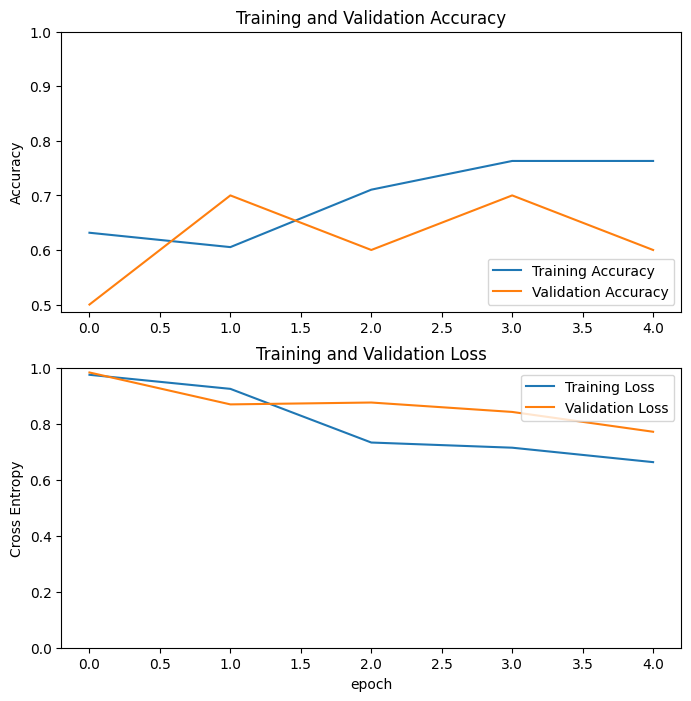

In [32]:
acc = history_DenseNet201_fe.history['accuracy']
val_acc = history_DenseNet201_fe.history['val_accuracy']

loss = history_DenseNet201_fe.history['loss']
val_loss = history_DenseNet201_fe.history['val_loss']

In [60]:
model = get_architecture(y, Model_version="DenseNet201", as_feature_extractor=False)

In [25]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                           

 block_3_expand_relu (ReLU)     (None, 56, 56, 144)  0           ['block_3_expand_BN[0][0]']      
                                                                                                  
 block_3_pad (ZeroPadding2D)    (None, 57, 57, 144)  0           ['block_3_expand_relu[0][0]']    
                                                                                                  
 block_3_depthwise (DepthwiseCo  (None, 28, 28, 144)  1296       ['block_3_pad[0][0]']            
 nv2D)                                                                                            
                                                                                                  
 block_3_depthwise_BN (BatchNor  (None, 28, 28, 144)  576        ['block_3_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_3_d

 lization)                                                                                        
                                                                                                  
 block_7_expand (Conv2D)        (None, 14, 14, 384)  24576       ['block_6_project_BN[0][0]']     
                                                                                                  
 block_7_expand_BN (BatchNormal  (None, 14, 14, 384)  1536       ['block_7_expand[0][0]']         
 ization)                                                                                         
                                                                                                  
 block_7_expand_relu (ReLU)     (None, 14, 14, 384)  0           ['block_7_expand_BN[0][0]']      
                                                                                                  
 block_7_depthwise (DepthwiseCo  (None, 14, 14, 384)  3456       ['block_7_expand_relu[0][0]']    
 nv2D)    

                                                                                                  
 block_10_depthwise_relu (ReLU)  (None, 14, 14, 384)  0          ['block_10_depthwise_BN[0][0]']  
                                                                                                  
 block_10_project (Conv2D)      (None, 14, 14, 96)   36864       ['block_10_depthwise_relu[0][0]']
                                                                                                  
 block_10_project_BN (BatchNorm  (None, 14, 14, 96)  384         ['block_10_project[0][0]']       
 alization)                                                                                       
                                                                                                  
 block_11_expand (Conv2D)       (None, 14, 14, 576)  55296       ['block_10_project_BN[0][0]']    
                                                                                                  
 block_11_

 block_14_depthwise (DepthwiseC  (None, 7, 7, 960)   8640        ['block_14_expand_relu[0][0]']   
 onv2D)                                                                                           
                                                                                                  
 block_14_depthwise_BN (BatchNo  (None, 7, 7, 960)   3840        ['block_14_depthwise[0][0]']     
 rmalization)                                                                                     
                                                                                                  
 block_14_depthwise_relu (ReLU)  (None, 7, 7, 960)   0           ['block_14_depthwise_BN[0][0]']  
                                                                                                  
 block_14_project (Conv2D)      (None, 7, 7, 160)    153600      ['block_14_depthwise_relu[0][0]']
                                                                                                  
 block_14_

In [30]:

history_DenseNet201_ft = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=total_epochs,
    initial_epoch = history_DenseNet201_fe.epoch[-1],
    
    
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, total_epochs // 2, 0.25),
)

#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final DenseNet201 (Fine-Tune) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 5/15
10/10 [==============================] - 14s 948ms/step - loss: 1.4189 - accuracy: 0.3684 - val_loss: 1.4031 - val_accuracy: 0.3000
Epoch 6/15
10/10 [==============================] - 8s 843ms/step - loss: 0.8484 - accuracy: 0.6842 - val_loss: 1.2818 - val_accuracy: 0.5000
Epoch 7/15
10/10 [==============================] - 8s 758ms/step - loss: 1.0287 - accuracy: 0.6316 - val_loss: 1.4217 - val_accuracy: 0.3000
Epoch 8/15
10/10 [==============================] - 8s 787ms/step - loss: 0.4423 - accuracy: 0.8158 - val_loss: 1.4566 - val_accuracy: 0.4000
Epoch 9/15
10/10 [==============================] - 9s 927ms/step - loss: 0.3196 - accuracy: 0.8947 - val_loss: 1.5023 - val_accuracy: 0.6000
Epoch 10/15
10/10 [==============================] - 9s 867ms/step - loss: 0.1549 - accuracy: 0.9737 - val_loss: 1.5191 - val_accuracy: 0.6000
Epoch 11/15
10/10 [==============================] - 8s 784ms/step - loss: 0.2514 - accuracy: 0.9474 - val_loss: 1.8953 - val_accuracy: 0.5000
Epo

In [33]:
acc += history_DenseNet201_ft.history['accuracy']
val_acc += history_DenseNet201_ft.history['val_accuracy']

loss += history_DenseNet201_ft.history['loss']
val_loss += history_DenseNet201_ft.history['val_loss']

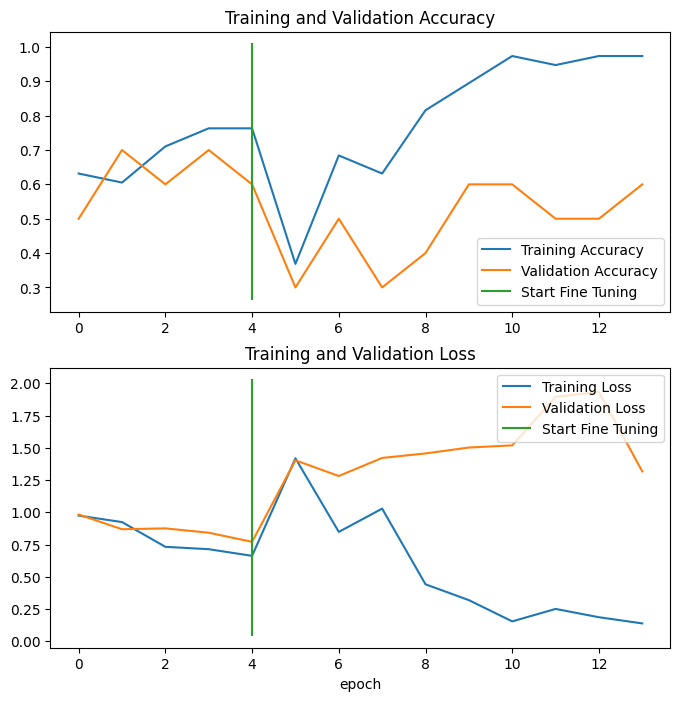

In [34]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
#plt.ylim([0.8, 1])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
#plt.ylim([0, 1.0])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

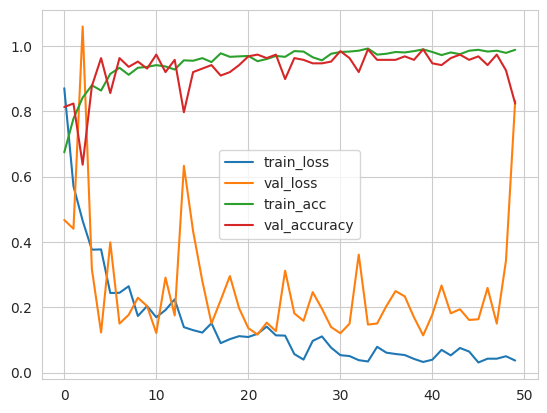

In [ ]:
# plot the loss and accuracy curves
plt.plot(history_DenseNet201_ft.history['loss'], label='train_loss')
plt.plot(history_DenseNet201_ft.history['val_loss'], label='val_loss')
plt.plot(history_DenseNet201_ft.history['accuracy'], label='train_acc')
plt.plot(history_DenseNet201_ft.history['val_accuracy'], label='val_accuracy')
plt.legend()
plt.show()

In [ ]:
y_pred = model.predict(X_test)

8/8 [==============================] - 16s 770ms/step


In [ ]:
y_pred = np.argmax(y_pred, axis=1)
y_test = np.argmax(y_test, axis=1)

In [ ]:
print('Classification Report DenseNet201:\n', classification_report(y_test, y_pred))

Classification Report DenseNet201:
               precision    recall  f1-score   support

           0       0.82      0.72      0.77        69
           1       0.98      0.71      0.82        65
           2       0.97      0.99      0.98        72
           3       0.51      0.96      0.67        28

    accuracy                           0.83       234
   macro avg       0.82      0.85      0.81       234
weighted avg       0.87      0.83      0.84       234



(array([0.5, 1.5, 2.5, 3.5]),
 [Text(0, 0.5, 'False Amaranth'),
  Text(0, 1.5, 'Horse Purslane'),
  Text(0, 2.5, 'Purple Nutsedge'),
  Text(0, 3.5, 'Wild Cucurbit')])

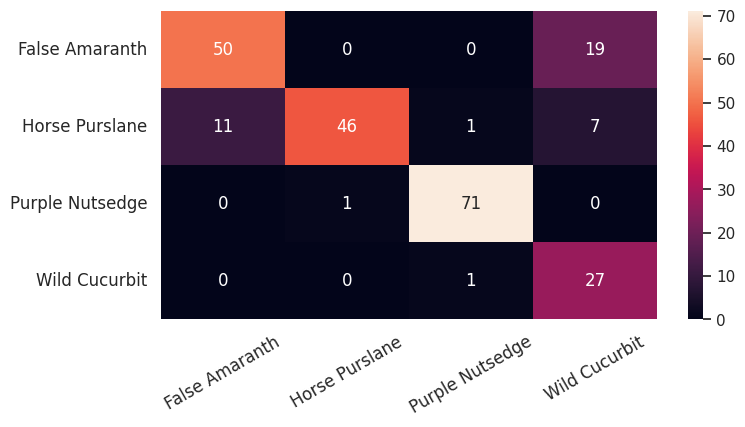

In [ ]:
cm = confusion_matrix(y_test, y_pred)

class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']


plt.figure(figsize=(8, 4))
df_cm = pd.DataFrame(cm, index=class_names,
                     columns=class_names)
sns.set(font_scale=1.0)
sns.heatmap(df_cm, annot=True, annot_kws={"size": 12},  fmt='0.0f')
plt.xticks(rotation=30, fontsize=12)
plt.yticks(fontsize=12)

#plt.savefig('EV2_bo_ftNA_heatmap.png')

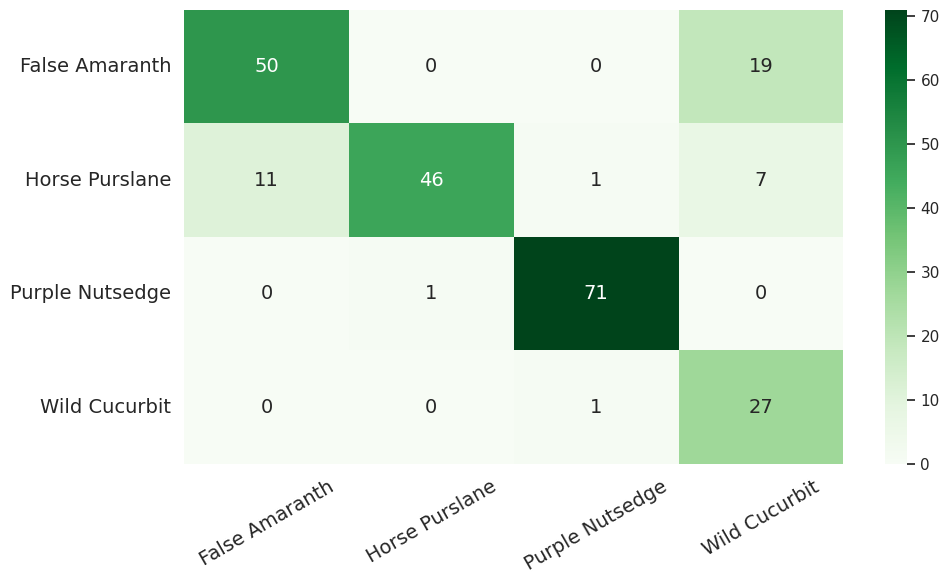

In [ ]:
plt.figure(figsize=(8, 4))
conf_mat = cm / np.sum(cm, 1)
class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']

df_cm1 = pd.DataFrame(conf_mat, index=class_names,
                     columns=class_names)
#sns.set(font_scale=1.0)
sns.heatmap(df_cm1, annot=True, annot_kws={"size": 14}, cmap='Greens',  fmt='0.0f')

plt.xticks(rotation=20, fontsize=12)
plt.yticks(fontsize=12)

In [1]:
import pandas as pd

from decimal import Decimal


#df_cm1

for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], Decimal):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 2))
for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], float):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 1))            
df_cm1

NameError: name 'df_cm1' is not defined

In [ ]:
model = get_architecture(y, Model_version="DenseNet169", as_feature_extractor=True)

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 zero_padding2d (ZeroPaddin  (None, 230, 230, 3)          0         ['input_1[0][0]']             
 g2D)                                                                                             
                                                                                                  
 conv1/conv (Conv2D)         (None, 112, 112, 64)         9408      ['zero_padding2d[0][0]']      
                                                                                                  
 conv1/bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1/conv[0][0]']      

In [ ]:
X_prep = tf.keras.applications.mobilenet_v3.preprocess_input(X)

X_train, X_test, y_train, y_test = train_test_split(
    X_prep,
    y,
    test_size=TEST_SPLIT,
    shuffle=True,
    stratify=y,
    random_state=RANDOM_STATE
)

X_train, X_val, y_train, y_val = train_test_split(
    X_train,
    y_train,
    test_size=VAL_SPLIT,
    shuffle=True,
    stratify=y_train,
    random_state=RANDOM_STATE,
)

In [ ]:
#New

history_DenseNet169_fe = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=NUM_EPOCHS,
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, NUM_EPOCHS // 2, 0.25),
)
#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final DenseNet169 (Feature-Extractor) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 1/50
187/187 [==============================] - 117s 206ms/step - loss: 0.9295 - accuracy: 0.6434 - val_loss: 0.3966 - val_accuracy: 0.8610
Epoch 2/50
187/187 [==============================] - 25s 135ms/step - loss: 0.5957 - accuracy: 0.7909 - val_loss: 0.6080 - val_accuracy: 0.8021
Epoch 3/50
187/187 [==============================] - 24s 126ms/step - loss: 0.5097 - accuracy: 0.8271 - val_loss: 0.2082 - val_accuracy: 0.9198
Epoch 4/50
187/187 [==============================] - 24s 129ms/step - loss: 0.3990 - accuracy: 0.8646 - val_loss: 0.3785 - val_accuracy: 0.8663
Epoch 5/50
187/187 [==============================] - 23s 121ms/step - loss: 0.4026 - accuracy: 0.8713 - val_loss: 0.4098 - val_accuracy: 0.8877
Epoch 6/50
187/187 [==============================] - 26s 137ms/step - loss: 0.3158 - accuracy: 0.9075 - val_loss: 0.2289 - val_accuracy: 0.9305
Epoch 7/50
187/187 [==============================] - 24s 126ms/step - loss: 0.3251 - accuracy: 0.8981 - val_loss: 0.5077 - val_a

In [ ]:
history_DenseNet169_fe.history

{'loss': [0.9294958114624023,
  0.5957347750663757,
  0.5096809267997742,
  0.39904722571372986,
  0.4026196300983429,
  0.3157608211040497,
  0.32508450746536255,
  0.2715747058391571,
  0.19510623812675476,
  0.26031142473220825,
  0.18480360507965088,
  0.20940779149532318,
  0.1486377716064453,
  0.1323162019252777,
  0.20330248773097992,
  0.18370738625526428,
  0.1490270346403122,
  0.1709076166152954,
  0.11129980534315109,
  0.10392928123474121,
  0.11562361568212509,
  0.12101958692073822,
  0.10450905561447144,
  0.12136901170015335,
  0.15339459478855133,
  0.13009598851203918,
  0.10296926647424698,
  0.06870856136083603,
  0.09652800112962723,
  0.06940513849258423,
  0.12199366837739944,
  0.09029670804738998,
  0.1233312115073204,
  0.13149189949035645,
  0.09350163489580154,
  0.04314345493912697,
  0.04932757094502449,
  0.10010868310928345,
  0.057880692183971405,
  0.08520958572626114,
  0.04318396747112274,
  0.07274579256772995,
  0.05191027745604515,
  0.049335509

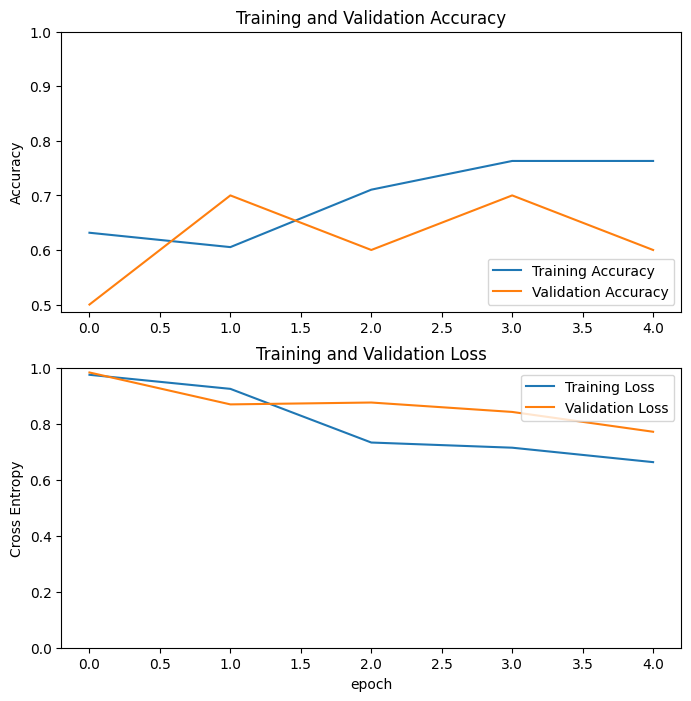

In [32]:
acc = history_DenseNet169_fe.history['accuracy']
val_acc = history_DenseNet169_fe.history['val_accuracy']

loss = history_DenseNet169_fe.history['loss']
val_loss = history_DenseNet169_fe.history['val_loss']

In [60]:
model = get_architecture(y, Model_version="DenseNet169", as_feature_extractor=False)

In [25]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                           

 block_3_expand_relu (ReLU)     (None, 56, 56, 144)  0           ['block_3_expand_BN[0][0]']      
                                                                                                  
 block_3_pad (ZeroPadding2D)    (None, 57, 57, 144)  0           ['block_3_expand_relu[0][0]']    
                                                                                                  
 block_3_depthwise (DepthwiseCo  (None, 28, 28, 144)  1296       ['block_3_pad[0][0]']            
 nv2D)                                                                                            
                                                                                                  
 block_3_depthwise_BN (BatchNor  (None, 28, 28, 144)  576        ['block_3_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_3_d

 lization)                                                                                        
                                                                                                  
 block_7_expand (Conv2D)        (None, 14, 14, 384)  24576       ['block_6_project_BN[0][0]']     
                                                                                                  
 block_7_expand_BN (BatchNormal  (None, 14, 14, 384)  1536       ['block_7_expand[0][0]']         
 ization)                                                                                         
                                                                                                  
 block_7_expand_relu (ReLU)     (None, 14, 14, 384)  0           ['block_7_expand_BN[0][0]']      
                                                                                                  
 block_7_depthwise (DepthwiseCo  (None, 14, 14, 384)  3456       ['block_7_expand_relu[0][0]']    
 nv2D)    

                                                                                                  
 block_10_depthwise_relu (ReLU)  (None, 14, 14, 384)  0          ['block_10_depthwise_BN[0][0]']  
                                                                                                  
 block_10_project (Conv2D)      (None, 14, 14, 96)   36864       ['block_10_depthwise_relu[0][0]']
                                                                                                  
 block_10_project_BN (BatchNorm  (None, 14, 14, 96)  384         ['block_10_project[0][0]']       
 alization)                                                                                       
                                                                                                  
 block_11_expand (Conv2D)       (None, 14, 14, 576)  55296       ['block_10_project_BN[0][0]']    
                                                                                                  
 block_11_

 block_14_depthwise (DepthwiseC  (None, 7, 7, 960)   8640        ['block_14_expand_relu[0][0]']   
 onv2D)                                                                                           
                                                                                                  
 block_14_depthwise_BN (BatchNo  (None, 7, 7, 960)   3840        ['block_14_depthwise[0][0]']     
 rmalization)                                                                                     
                                                                                                  
 block_14_depthwise_relu (ReLU)  (None, 7, 7, 960)   0           ['block_14_depthwise_BN[0][0]']  
                                                                                                  
 block_14_project (Conv2D)      (None, 7, 7, 160)    153600      ['block_14_depthwise_relu[0][0]']
                                                                                                  
 block_14_

In [30]:

history_DenseNet169_ft = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=total_epochs,
    initial_epoch = history_DenseNet169_fe.epoch[-1],
    
    
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, total_epochs // 2, 0.25),
)

#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final DenseNet169 (Fine-Tune) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 5/15
10/10 [==============================] - 14s 948ms/step - loss: 1.4189 - accuracy: 0.3684 - val_loss: 1.4031 - val_accuracy: 0.3000
Epoch 6/15
10/10 [==============================] - 8s 843ms/step - loss: 0.8484 - accuracy: 0.6842 - val_loss: 1.2818 - val_accuracy: 0.5000
Epoch 7/15
10/10 [==============================] - 8s 758ms/step - loss: 1.0287 - accuracy: 0.6316 - val_loss: 1.4217 - val_accuracy: 0.3000
Epoch 8/15
10/10 [==============================] - 8s 787ms/step - loss: 0.4423 - accuracy: 0.8158 - val_loss: 1.4566 - val_accuracy: 0.4000
Epoch 9/15
10/10 [==============================] - 9s 927ms/step - loss: 0.3196 - accuracy: 0.8947 - val_loss: 1.5023 - val_accuracy: 0.6000
Epoch 10/15
10/10 [==============================] - 9s 867ms/step - loss: 0.1549 - accuracy: 0.9737 - val_loss: 1.5191 - val_accuracy: 0.6000
Epoch 11/15
10/10 [==============================] - 8s 784ms/step - loss: 0.2514 - accuracy: 0.9474 - val_loss: 1.8953 - val_accuracy: 0.5000
Epo

In [33]:
acc += history_DenseNet169_ft.history['accuracy']
val_acc += history_DenseNet169_ft.history['val_accuracy']

loss += history_DenseNet169_ft.history['loss']
val_loss += history_DenseNet169_ft.history['val_loss']

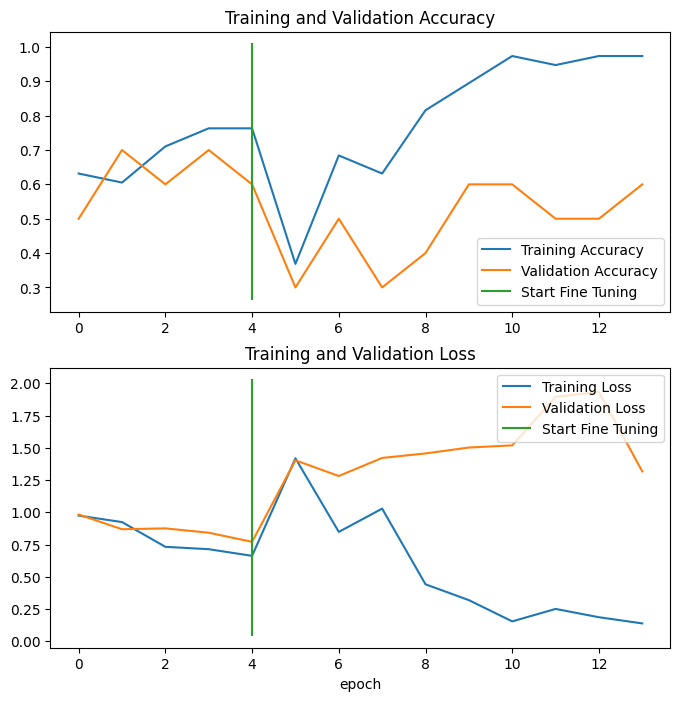

In [34]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
#plt.ylim([0.8, 1])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
#plt.ylim([0, 1.0])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

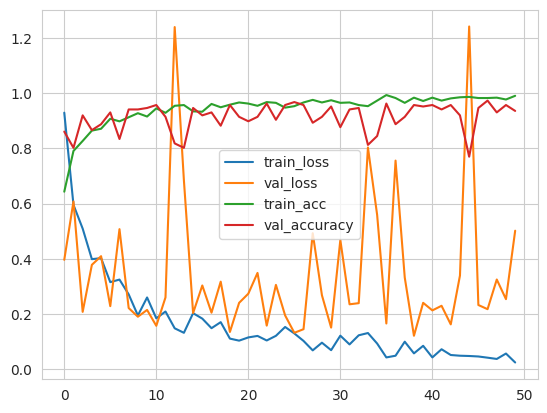

In [ ]:
# plot the loss and accuracy curves
plt.plot(history_DenseNet169_ft.history['loss'], label='train_loss')
plt.plot(history_DenseNet169_ft.history['val_loss'], label='val_loss')
plt.plot(history_DenseNet169_ft.history['accuracy'], label='train_acc')
plt.plot(history_DenseNet169_ft.history['val_accuracy'], label='val_accuracy')
plt.legend()
plt.show()

In [ ]:
y_pred = model.predict(X_test)

8/8 [==============================] - 1s 122ms/step


In [ ]:
y_pred = np.argmax(y_pred, axis=1)
y_test = np.argmax(y_test, axis=1)

In [ ]:
print('Classification Report DenseNet169:\n', classification_report(y_test, y_pred))

Classification Report DenseNet169:
               precision    recall  f1-score   support

           0       1.00      0.80      0.89        69
           1       0.89      0.95      0.92        65
           2       0.81      0.99      0.89        72
           3       1.00      0.75      0.86        28

    accuracy                           0.89       234
   macro avg       0.92      0.87      0.89       234
weighted avg       0.91      0.89      0.89       234



(array([0.5, 1.5, 2.5, 3.5]),
 [Text(0, 0.5, 'False Amaranth'),
  Text(0, 1.5, 'Horse Purslane'),
  Text(0, 2.5, 'Purple Nutsedge'),
  Text(0, 3.5, 'Wild Cucurbit')])

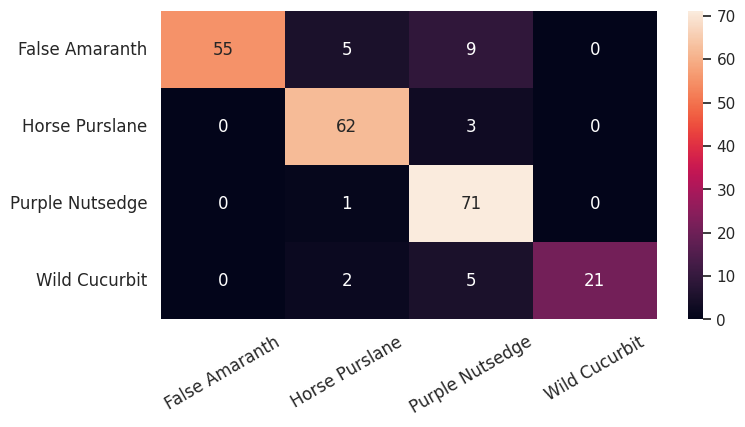

In [ ]:
cm = confusion_matrix(y_test, y_pred)

class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']


plt.figure(figsize=(8, 4))
df_cm = pd.DataFrame(cm, index=class_names,
                     columns=class_names)
sns.set(font_scale=1.0)
sns.heatmap(df_cm, annot=True, annot_kws={"size": 12},  fmt='0.0f')
plt.xticks(rotation=30, fontsize=12)
plt.yticks(fontsize=12)

#plt.savefig('EV2_bo_ftNA_heatmap.png')

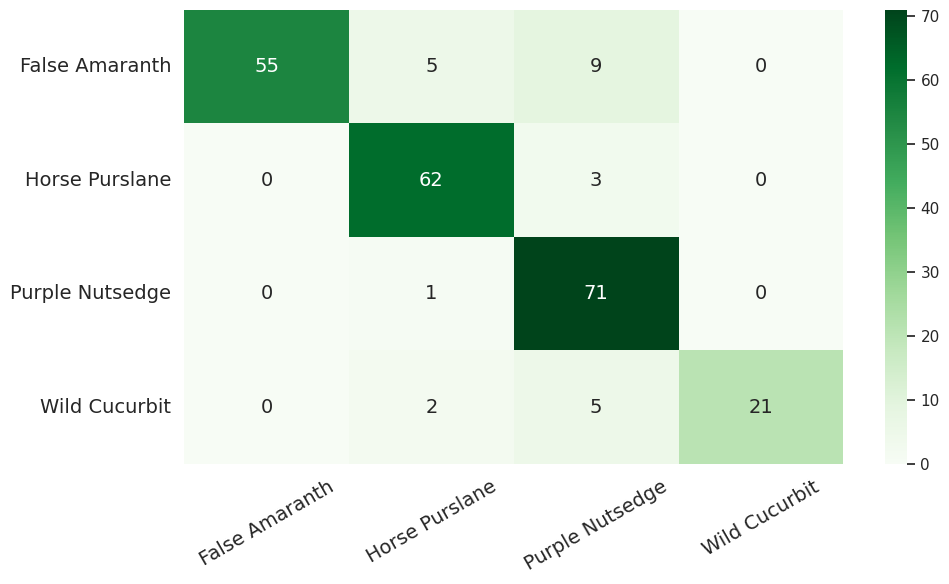

In [ ]:
plt.figure(figsize=(8, 4))
conf_mat = cm / np.sum(cm, 1)
class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']

df_cm1 = pd.DataFrame(conf_mat, index=class_names,
                     columns=class_names)
#sns.set(font_scale=1.0)
sns.heatmap(df_cm1, annot=True, annot_kws={"size": 14}, cmap='Greens',  fmt='0.0f')

plt.xticks(rotation=20, fontsize=12)
plt.yticks(fontsize=12)

In [1]:
import pandas as pd

from decimal import Decimal


#df_cm1

for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], Decimal):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 2))
for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], float):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 1))            
df_cm1

NameError: name 'df_cm1' is not defined

In [9]:
model = get_architecture(y, Model_version="EfficientNetV2S", as_feature_extractor=True)

82420632/82420632 [==============================] - 1s 0us/step


In [10]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 rescaling (Rescaling)       (None, 224, 224, 3)          0         ['input_1[0][0]']             
                                                                                                  
 stem_conv (Conv2D)          (None, 112, 112, 24)         648       ['rescaling[0][0]']           
                                                                                                  
 stem_bn (BatchNormalizatio  (None, 112, 112, 24)         96        ['stem_conv[0][0]']           
 n)                                                                                           

In [11]:
X_prep = tf.keras.applications.mobilenet_v3.preprocess_input(X)

X_train, X_test, y_train, y_test = train_test_split(
    X_prep,
    y,
    test_size=TEST_SPLIT,
    shuffle=True,
    stratify=y,
    random_state=RANDOM_STATE
)

X_train, X_val, y_train, y_val = train_test_split(
    X_train,
    y_train,
    test_size=VAL_SPLIT,
    shuffle=True,
    stratify=y_train,
    random_state=RANDOM_STATE,
)

In [12]:

history_EfficientNetV2S_fe = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=NUM_EPOCHS,
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, NUM_EPOCHS // 2, 0.25),
)
#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final EfficientNetV2S (Feature-Extractor) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 1/50
187/187 [==============================] - 78s 152ms/step - loss: 1.2205 - accuracy: 0.4745 - val_loss: 1.0528 - val_accuracy: 0.6578
Epoch 2/50
187/187 [==============================] - 21s 113ms/step - loss: 0.8726 - accuracy: 0.6729 - val_loss: 0.6452 - val_accuracy: 0.8503
Epoch 3/50
187/187 [==============================] - 21s 110ms/step - loss: 0.6639 - accuracy: 0.7601 - val_loss: 0.4373 - val_accuracy: 0.8770
Epoch 4/50
187/187 [==============================] - 21s 112ms/step - loss: 0.5452 - accuracy: 0.7989 - val_loss: 0.3499 - val_accuracy: 0.9198
Epoch 5/50
187/187 [==============================] - 21s 110ms/step - loss: 0.4204 - accuracy: 0.8592 - val_loss: 0.2556 - val_accuracy: 0.9465
Epoch 6/50
187/187 [==============================] - 20s 109ms/step - loss: 0.3381 - accuracy: 0.9008 - val_loss: 0.2151 - val_accuracy: 0.9251
Epoch 7/50
187/187 [==============================] - 20s 109ms/step - loss: 0.3321 - accuracy: 0.8834 - val_loss: 0.2371 - val_ac

In [13]:
history_EfficientNetV2S_fe.history

{'loss': [1.220513939857483,
  0.872615396976471,
  0.6638938188552856,
  0.5451750755310059,
  0.4203971326351166,
  0.33809560537338257,
  0.33209115266799927,
  0.2977956533432007,
  0.2550722062587738,
  0.2091321498155594,
  0.19550250470638275,
  0.19018620252609253,
  0.14427505433559418,
  0.14023138582706451,
  0.13612399995326996,
  0.15740759670734406,
  0.11385023593902588,
  0.10378755629062653,
  0.12834979593753815,
  0.12339861690998077,
  0.15713587403297424,
  0.10330339521169662,
  0.10767490416765213,
  0.09254001826047897,
  0.13559512794017792,
  0.05888551473617554,
  0.06136851757764816,
  0.10522311925888062,
  0.10831111669540405,
  0.06204730272293091,
  0.09531303495168686,
  0.08419040590524673,
  0.04867308586835861,
  0.07560042291879654,
  0.0374968983232975],
 'accuracy': [0.4745308458805084,
  0.6729222536087036,
  0.7600536346435547,
  0.7989276051521301,
  0.8592493534088135,
  0.9008042812347412,
  0.8833780288696289,
  0.8981233239173889,
  0.91420

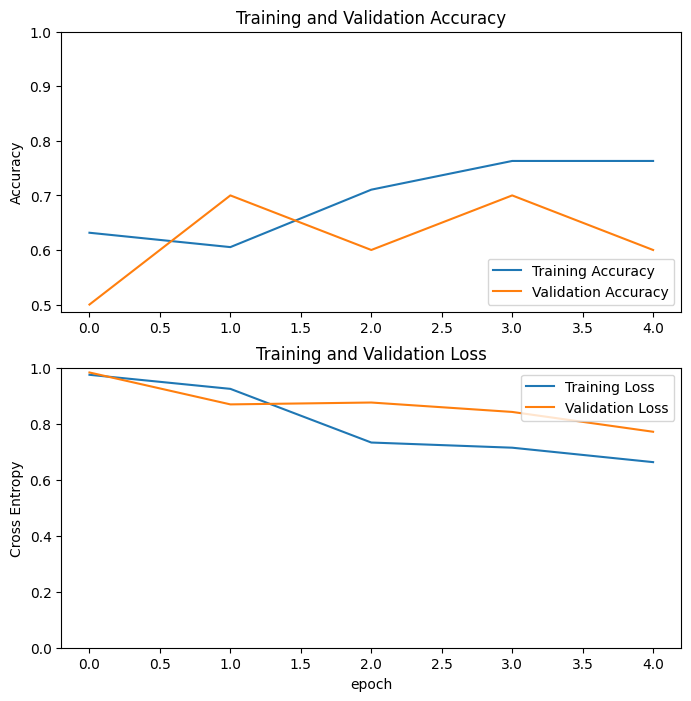

In [32]:
acc = history_EfficientNetV2S_fe.history['accuracy']
val_acc = history_EfficientNetV2S_fe.history['val_accuracy']

loss = history_EfficientNetV2S_fe.history['loss']
val_loss = history_EfficientNetV2S_fe.history['val_loss']

In [60]:
model = get_architecture(y, Model_version="EfficientNetV2S", as_feature_extractor=False)

In [25]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                           

 block_3_expand_relu (ReLU)     (None, 56, 56, 144)  0           ['block_3_expand_BN[0][0]']      
                                                                                                  
 block_3_pad (ZeroPadding2D)    (None, 57, 57, 144)  0           ['block_3_expand_relu[0][0]']    
                                                                                                  
 block_3_depthwise (DepthwiseCo  (None, 28, 28, 144)  1296       ['block_3_pad[0][0]']            
 nv2D)                                                                                            
                                                                                                  
 block_3_depthwise_BN (BatchNor  (None, 28, 28, 144)  576        ['block_3_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_3_d

 lization)                                                                                        
                                                                                                  
 block_7_expand (Conv2D)        (None, 14, 14, 384)  24576       ['block_6_project_BN[0][0]']     
                                                                                                  
 block_7_expand_BN (BatchNormal  (None, 14, 14, 384)  1536       ['block_7_expand[0][0]']         
 ization)                                                                                         
                                                                                                  
 block_7_expand_relu (ReLU)     (None, 14, 14, 384)  0           ['block_7_expand_BN[0][0]']      
                                                                                                  
 block_7_depthwise (DepthwiseCo  (None, 14, 14, 384)  3456       ['block_7_expand_relu[0][0]']    
 nv2D)    

                                                                                                  
 block_10_depthwise_relu (ReLU)  (None, 14, 14, 384)  0          ['block_10_depthwise_BN[0][0]']  
                                                                                                  
 block_10_project (Conv2D)      (None, 14, 14, 96)   36864       ['block_10_depthwise_relu[0][0]']
                                                                                                  
 block_10_project_BN (BatchNorm  (None, 14, 14, 96)  384         ['block_10_project[0][0]']       
 alization)                                                                                       
                                                                                                  
 block_11_expand (Conv2D)       (None, 14, 14, 576)  55296       ['block_10_project_BN[0][0]']    
                                                                                                  
 block_11_

 block_14_depthwise (DepthwiseC  (None, 7, 7, 960)   8640        ['block_14_expand_relu[0][0]']   
 onv2D)                                                                                           
                                                                                                  
 block_14_depthwise_BN (BatchNo  (None, 7, 7, 960)   3840        ['block_14_depthwise[0][0]']     
 rmalization)                                                                                     
                                                                                                  
 block_14_depthwise_relu (ReLU)  (None, 7, 7, 960)   0           ['block_14_depthwise_BN[0][0]']  
                                                                                                  
 block_14_project (Conv2D)      (None, 7, 7, 160)    153600      ['block_14_depthwise_relu[0][0]']
                                                                                                  
 block_14_

In [30]:

history_EfficientNetV2S_ft = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=total_epochs,
    initial_epoch = history_EfficientNetV2S_fe.epoch[-1],
    
    
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, total_epochs // 2, 0.25),
)

#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final EfficientNetV2S(Fine-Tune) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 5/15
10/10 [==============================] - 14s 948ms/step - loss: 1.4189 - accuracy: 0.3684 - val_loss: 1.4031 - val_accuracy: 0.3000
Epoch 6/15
10/10 [==============================] - 8s 843ms/step - loss: 0.8484 - accuracy: 0.6842 - val_loss: 1.2818 - val_accuracy: 0.5000
Epoch 7/15
10/10 [==============================] - 8s 758ms/step - loss: 1.0287 - accuracy: 0.6316 - val_loss: 1.4217 - val_accuracy: 0.3000
Epoch 8/15
10/10 [==============================] - 8s 787ms/step - loss: 0.4423 - accuracy: 0.8158 - val_loss: 1.4566 - val_accuracy: 0.4000
Epoch 9/15
10/10 [==============================] - 9s 927ms/step - loss: 0.3196 - accuracy: 0.8947 - val_loss: 1.5023 - val_accuracy: 0.6000
Epoch 10/15
10/10 [==============================] - 9s 867ms/step - loss: 0.1549 - accuracy: 0.9737 - val_loss: 1.5191 - val_accuracy: 0.6000
Epoch 11/15
10/10 [==============================] - 8s 784ms/step - loss: 0.2514 - accuracy: 0.9474 - val_loss: 1.8953 - val_accuracy: 0.5000
Epo

In [33]:
acc += history_EfficientNetV2S_ft.history['accuracy']
val_acc += history_EfficientNetV2S_ft.history['val_accuracy']

loss += history_EfficientNetV2S_ft.history['loss']
val_loss += history_EfficientNetV2S_ft.history['val_loss']

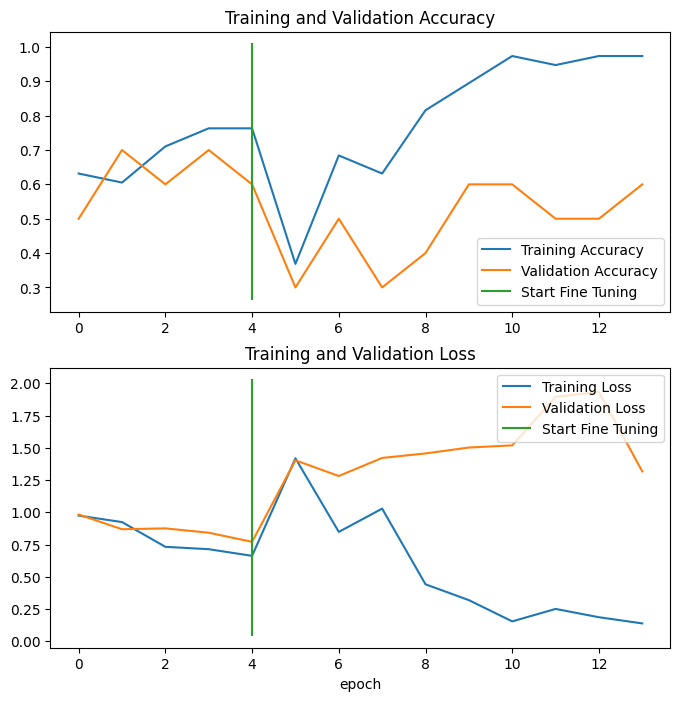

In [34]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
#plt.ylim([0.8, 1])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
#plt.ylim([0, 1.0])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

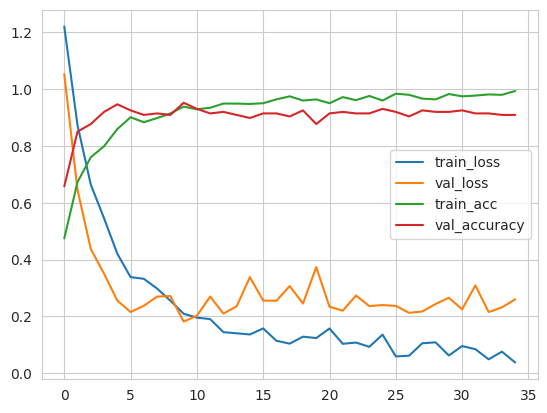

In [14]:
# plot the loss and accuracy curves
plt.plot(history_EfficientNetV2S_ft.history['loss'], label='train_loss')
plt.plot(history_EfficientNetV2S_ft.history['val_loss'], label='val_loss')
plt.plot(history_EfficientNetV2S_ft.history['accuracy'], label='train_acc')
plt.plot(history_EfficientNetV2S_ft.history['val_accuracy'], label='val_accuracy')
plt.legend()
plt.show()

In [18]:
y_pred = model.predict(X_test)

8/8 [==============================] - 9s 261ms/step


In [19]:
y_pred = np.argmax(y_pred, axis=1)
y_test = np.argmax(y_test, axis=1)

In [20]:
print('Classification Report EfficientNetV2S:\n', classification_report(y_test, y_pred))

Classification Report EfficientNetV2S:
               precision    recall  f1-score   support

           0       1.00      0.94      0.97        69
           1       0.95      0.95      0.95        65
           2       0.99      0.96      0.97        72
           3       0.79      0.96      0.87        28

    accuracy                           0.95       234
   macro avg       0.93      0.95      0.94       234
weighted avg       0.96      0.95      0.95       234



(array([0.5, 1.5, 2.5, 3.5]),
 [Text(0, 0.5, 'False Amaranth'),
  Text(0, 1.5, 'Horse Purslane'),
  Text(0, 2.5, 'Purple Nutsedge'),
  Text(0, 3.5, 'Wild Cucurbit')])

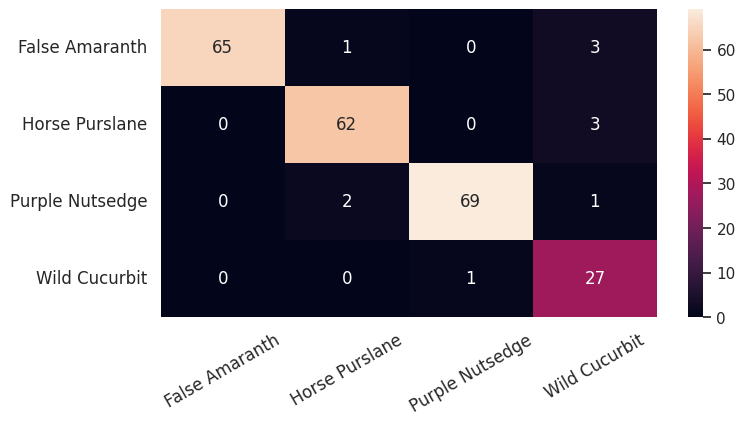

In [21]:
cm = confusion_matrix(y_test, y_pred)

class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']


plt.figure(figsize=(8, 4))
df_cm = pd.DataFrame(cm, index=class_names,
                     columns=class_names)
sns.set(font_scale=1.0)
sns.heatmap(df_cm, annot=True, annot_kws={"size": 12},  fmt='0.0f')
plt.xticks(rotation=30, fontsize=12)
plt.yticks(fontsize=12)

#plt.savefig('EV2_bo_ftNA_heatmap.png')

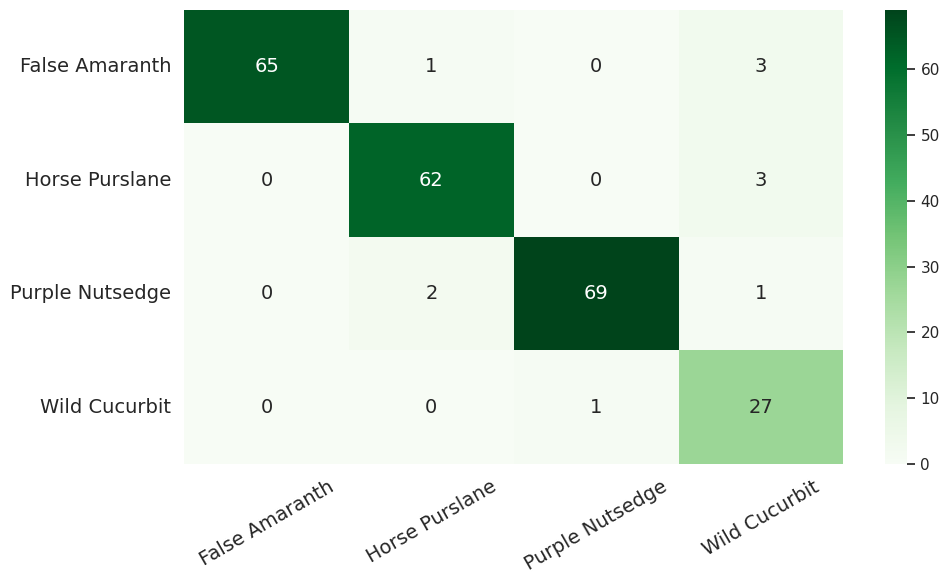

In [22]:
plt.figure(figsize=(8, 4))
conf_mat = cm / np.sum(cm, 1)
class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']

df_cm1 = pd.DataFrame(conf_mat, index=class_names,
                     columns=class_names)
#sns.set(font_scale=1.0)
sns.heatmap(df_cm1, annot=True, annot_kws={"size": 14}, cmap='Greens',  fmt='0.0f')

plt.xticks(rotation=20, fontsize=12)
plt.yticks(fontsize=12)

In [1]:
import pandas as pd

from decimal import Decimal


#df_cm1

for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], Decimal):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 2))
for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], float):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 1))            
df_cm1

NameError: name 'df_cm1' is not defined

In [23]:
model = get_architecture(y, Model_version="EfficientNetB1", as_feature_extractor=True)

27018416/27018416 [==============================] - 0s 0us/step


In [24]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 rescaling_1 (Rescaling)     (None, 224, 224, 3)          0         ['input_2[0][0]']             
                                                                                                  
 normalization (Normalizati  (None, 224, 224, 3)          7         ['rescaling_1[0][0]']         
 on)                                                                                              
                                                                                                  
 rescaling_2 (Rescaling)     (None, 224, 224, 3)          0         ['normalization[0][0]'] 

In [25]:
X_prep = tf.keras.applications.mobilenet_v3.preprocess_input(X)

X_train, X_test, y_train, y_test = train_test_split(
    X_prep,
    y,
    test_size=TEST_SPLIT,
    shuffle=True,
    stratify=y,
    random_state=RANDOM_STATE
)

X_train, X_val, y_train, y_val = train_test_split(
    X_train,
    y_train,
    test_size=VAL_SPLIT,
    shuffle=True,
    stratify=y_train,
    random_state=RANDOM_STATE,
)

In [26]:

history_EfficientNetB1_fe = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=NUM_EPOCHS,
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, NUM_EPOCHS // 2, 0.25),
)
#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final EfficientNetB1 (Feature-Extractor) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 1/50
187/187 [==============================] - 64s 137ms/step - loss: 1.1949 - accuracy: 0.5040 - val_loss: 0.8553 - val_accuracy: 0.7540
Epoch 2/50
187/187 [==============================] - 14s 77ms/step - loss: 0.7630 - accuracy: 0.7158 - val_loss: 0.5388 - val_accuracy: 0.8610
Epoch 3/50
187/187 [==============================] - 16s 85ms/step - loss: 0.6069 - accuracy: 0.7587 - val_loss: 0.4230 - val_accuracy: 0.8877
Epoch 4/50
187/187 [==============================] - 14s 74ms/step - loss: 0.4754 - accuracy: 0.8472 - val_loss: 0.3621 - val_accuracy: 0.8824
Epoch 5/50
187/187 [==============================] - 14s 77ms/step - loss: 0.3619 - accuracy: 0.8847 - val_loss: 0.2656 - val_accuracy: 0.9091
Epoch 6/50
187/187 [==============================] - 14s 74ms/step - loss: 0.2709 - accuracy: 0.9088 - val_loss: 0.2310 - val_accuracy: 0.9091
Epoch 7/50
187/187 [==============================] - 14s 77ms/step - loss: 0.2939 - accuracy: 0.9062 - val_loss: 0.2032 - val_accuracy

In [27]:
history_EfficientNetB1_fe.history

{'loss': [1.1949092149734497,
  0.7630330324172974,
  0.6069175004959106,
  0.47538504004478455,
  0.3618660271167755,
  0.27094772458076477,
  0.2939371168613434,
  0.27615171670913696,
  0.2153797149658203,
  0.19079424440860748,
  0.2023075670003891,
  0.17200468480587006,
  0.16174732148647308,
  0.10263065248727798,
  0.1611078679561615,
  0.12547975778579712,
  0.11397670954465866,
  0.12760697305202484,
  0.10450528562068939,
  0.09599488973617554,
  0.0924595445394516,
  0.07948572188615799,
  0.0551353320479393,
  0.06791045516729355,
  0.036544740200042725,
  0.04507586732506752,
  0.05117703229188919,
  0.04550912231206894,
  0.02562176249921322,
  0.044684331864118576,
  0.03220774233341217,
  0.036983098834753036,
  0.0446004644036293,
  0.042883824557065964,
  0.038812220096588135,
  0.041108470410108566,
  0.03673447296023369,
  0.02544385753571987,
  0.029114997014403343,
  0.027707582339644432,
  0.021692413836717606,
  0.022429248318076134,
  0.027113134041428566,
  0

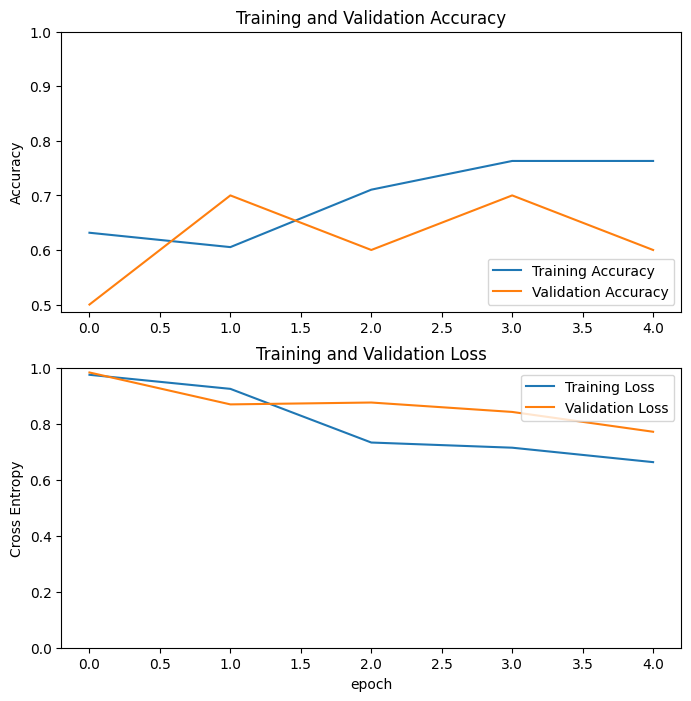

In [32]:
acc = history_EfficientNetB1_fe.history['accuracy']
val_acc = history_EfficientNetB1_fe.history['val_accuracy']

loss = history_EfficientNetB1_fe.history['loss']
val_loss = history_EfficientNetB1_fe.history['val_loss']

In [60]:
model = get_architecture(y, Model_version="EfficientNetB1", as_feature_extractor=False)

In [25]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                           

 block_3_expand_relu (ReLU)     (None, 56, 56, 144)  0           ['block_3_expand_BN[0][0]']      
                                                                                                  
 block_3_pad (ZeroPadding2D)    (None, 57, 57, 144)  0           ['block_3_expand_relu[0][0]']    
                                                                                                  
 block_3_depthwise (DepthwiseCo  (None, 28, 28, 144)  1296       ['block_3_pad[0][0]']            
 nv2D)                                                                                            
                                                                                                  
 block_3_depthwise_BN (BatchNor  (None, 28, 28, 144)  576        ['block_3_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_3_d

 lization)                                                                                        
                                                                                                  
 block_7_expand (Conv2D)        (None, 14, 14, 384)  24576       ['block_6_project_BN[0][0]']     
                                                                                                  
 block_7_expand_BN (BatchNormal  (None, 14, 14, 384)  1536       ['block_7_expand[0][0]']         
 ization)                                                                                         
                                                                                                  
 block_7_expand_relu (ReLU)     (None, 14, 14, 384)  0           ['block_7_expand_BN[0][0]']      
                                                                                                  
 block_7_depthwise (DepthwiseCo  (None, 14, 14, 384)  3456       ['block_7_expand_relu[0][0]']    
 nv2D)    

                                                                                                  
 block_10_depthwise_relu (ReLU)  (None, 14, 14, 384)  0          ['block_10_depthwise_BN[0][0]']  
                                                                                                  
 block_10_project (Conv2D)      (None, 14, 14, 96)   36864       ['block_10_depthwise_relu[0][0]']
                                                                                                  
 block_10_project_BN (BatchNorm  (None, 14, 14, 96)  384         ['block_10_project[0][0]']       
 alization)                                                                                       
                                                                                                  
 block_11_expand (Conv2D)       (None, 14, 14, 576)  55296       ['block_10_project_BN[0][0]']    
                                                                                                  
 block_11_

 block_14_depthwise (DepthwiseC  (None, 7, 7, 960)   8640        ['block_14_expand_relu[0][0]']   
 onv2D)                                                                                           
                                                                                                  
 block_14_depthwise_BN (BatchNo  (None, 7, 7, 960)   3840        ['block_14_depthwise[0][0]']     
 rmalization)                                                                                     
                                                                                                  
 block_14_depthwise_relu (ReLU)  (None, 7, 7, 960)   0           ['block_14_depthwise_BN[0][0]']  
                                                                                                  
 block_14_project (Conv2D)      (None, 7, 7, 160)    153600      ['block_14_depthwise_relu[0][0]']
                                                                                                  
 block_14_

In [30]:

history_EfficientNetB1_ft = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=total_epochs,
    initial_epoch = history_EfficientNetB1_fe.epoch[-1],
    
    
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, total_epochs // 2, 0.25),
)

#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final EfficientNetB1 (Fine-Tune) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 5/15
10/10 [==============================] - 14s 948ms/step - loss: 1.4189 - accuracy: 0.3684 - val_loss: 1.4031 - val_accuracy: 0.3000
Epoch 6/15
10/10 [==============================] - 8s 843ms/step - loss: 0.8484 - accuracy: 0.6842 - val_loss: 1.2818 - val_accuracy: 0.5000
Epoch 7/15
10/10 [==============================] - 8s 758ms/step - loss: 1.0287 - accuracy: 0.6316 - val_loss: 1.4217 - val_accuracy: 0.3000
Epoch 8/15
10/10 [==============================] - 8s 787ms/step - loss: 0.4423 - accuracy: 0.8158 - val_loss: 1.4566 - val_accuracy: 0.4000
Epoch 9/15
10/10 [==============================] - 9s 927ms/step - loss: 0.3196 - accuracy: 0.8947 - val_loss: 1.5023 - val_accuracy: 0.6000
Epoch 10/15
10/10 [==============================] - 9s 867ms/step - loss: 0.1549 - accuracy: 0.9737 - val_loss: 1.5191 - val_accuracy: 0.6000
Epoch 11/15
10/10 [==============================] - 8s 784ms/step - loss: 0.2514 - accuracy: 0.9474 - val_loss: 1.8953 - val_accuracy: 0.5000
Epo

In [33]:
acc += history_EfficientNetB1_ft.history['accuracy']
val_acc += history_EfficientNetB1_ft.history['val_accuracy']

loss += history_EfficientNetB1_ft.history['loss']
val_loss += history_EfficientNetB1_ft.history['val_loss']

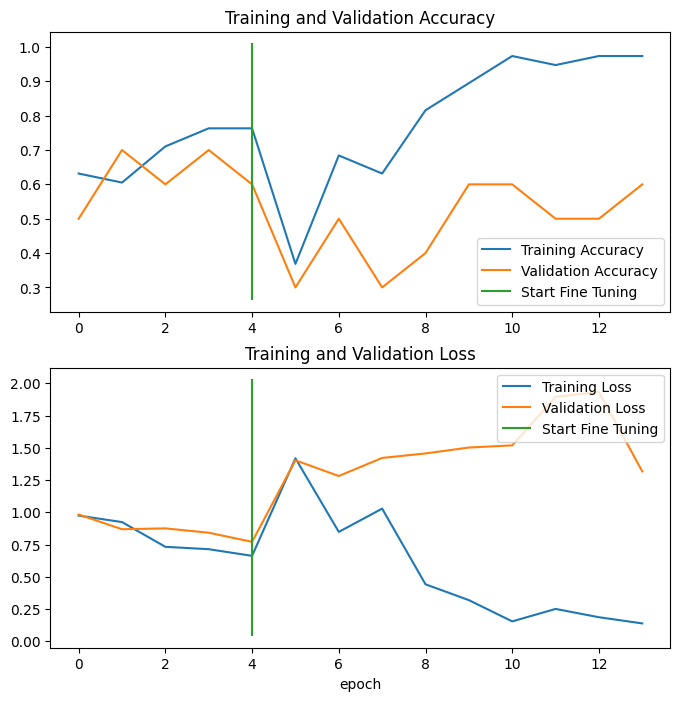

In [34]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
#plt.ylim([0.8, 1])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
#plt.ylim([0, 1.0])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

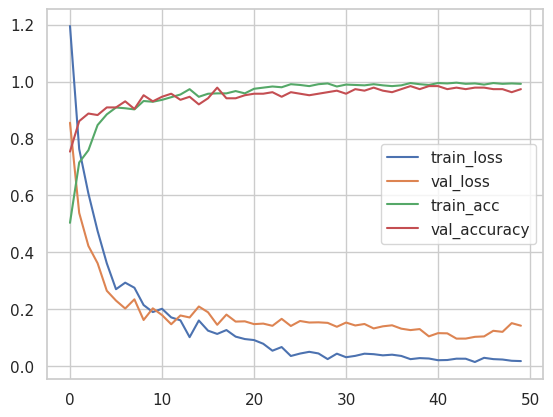

In [28]:
# plot the loss and accuracy curves
plt.plot(history_EfficientNetB1_ft.history['loss'], label='train_loss')
plt.plot(history_EfficientNetB1_ft.history['val_loss'], label='val_loss')
plt.plot(history_EfficientNetB1_ft.history['accuracy'], label='train_acc')
plt.plot(history_EfficientNetB1_ft.history['val_accuracy'], label='val_accuracy')
plt.legend()
plt.show()

In [32]:
y_pred = model.predict(X_test)

8/8 [==============================] - 6s 269ms/step


In [33]:
y_pred = np.argmax(y_pred, axis=1)
y_test = np.argmax(y_test, axis=1)

In [34]:
print('Classification Report EfficientNetB1:\n', classification_report(y_test, y_pred))

Classification Report EfficientNetB1:
               precision    recall  f1-score   support

           0       0.95      0.84      0.89        69
           1       0.97      0.98      0.98        65
           2       1.00      0.97      0.99        72
           3       0.76      1.00      0.86        28

    accuracy                           0.94       234
   macro avg       0.92      0.95      0.93       234
weighted avg       0.95      0.94      0.94       234



(array([0.5, 1.5, 2.5, 3.5]),
 [Text(0, 0.5, 'False Amaranth'),
  Text(0, 1.5, 'Horse Purslane'),
  Text(0, 2.5, 'Purple Nutsedge'),
  Text(0, 3.5, 'Wild Cucurbit')])

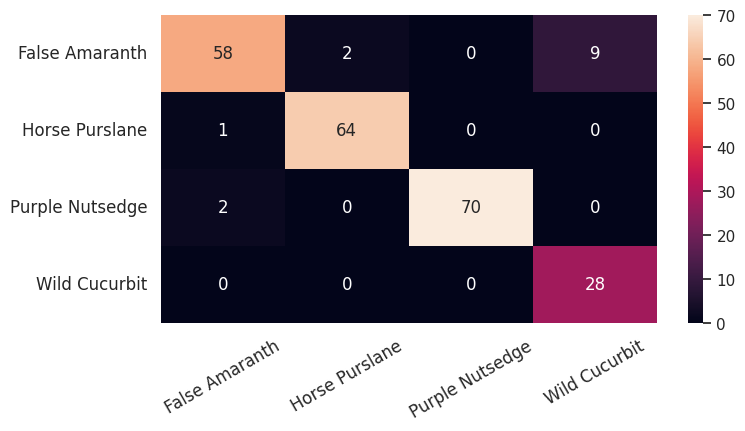

In [35]:
cm = confusion_matrix(y_test, y_pred)

class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']


plt.figure(figsize=(8, 4))
df_cm = pd.DataFrame(cm, index=class_names,
                     columns=class_names)
sns.set(font_scale=1.0)
sns.heatmap(df_cm, annot=True, annot_kws={"size": 12},  fmt='0.0f')
plt.xticks(rotation=30, fontsize=12)
plt.yticks(fontsize=12)

#plt.savefig('EV2_bo_ftNA_heatmap.png')

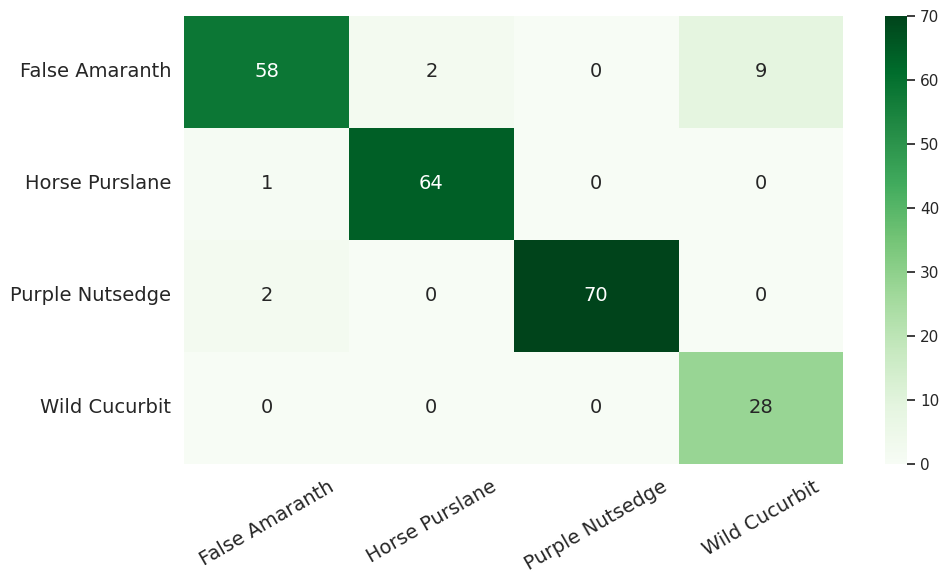

In [36]:
plt.figure(figsize=(8, 4))
conf_mat = cm / np.sum(cm, 1)
class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']

df_cm1 = pd.DataFrame(conf_mat, index=class_names,
                     columns=class_names)
#sns.set(font_scale=1.0)
sns.heatmap(df_cm1, annot=True, annot_kws={"size": 14}, cmap='Greens',  fmt='0.0f')

plt.xticks(rotation=20, fontsize=12)
plt.yticks(fontsize=12)

In [1]:
import pandas as pd

from decimal import Decimal


#df_cm1

for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], Decimal):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 2))
for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], float):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 1))            
df_cm1

NameError: name 'df_cm1' is not defined

In [37]:
model = get_architecture(y, Model_version="EfficientNetB2", as_feature_extractor=True)

31790344/31790344 [==============================] - 0s 0us/step


In [38]:
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 rescaling_3 (Rescaling)     (None, 224, 224, 3)          0         ['input_3[0][0]']             
                                                                                                  
 normalization_1 (Normaliza  (None, 224, 224, 3)          7         ['rescaling_3[0][0]']         
 tion)                                                                                            
                                                                                                  
 rescaling_4 (Rescaling)     (None, 224, 224, 3)          0         ['normalization_1[0][0]'

In [39]:
X_prep = tf.keras.applications.mobilenet_v3.preprocess_input(X)

X_train, X_test, y_train, y_test = train_test_split(
    X_prep,
    y,
    test_size=TEST_SPLIT,
    shuffle=True,
    stratify=y,
    random_state=RANDOM_STATE
)

X_train, X_val, y_train, y_val = train_test_split(
    X_train,
    y_train,
    test_size=VAL_SPLIT,
    shuffle=True,
    stratify=y_train,
    random_state=RANDOM_STATE,
)

In [40]:

history_EfficientNetB2_fe = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=NUM_EPOCHS,
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, NUM_EPOCHS // 2, 0.25),
)
#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final EfficientNetB2 (Feature-Extractor) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 1/50
187/187 [==============================] - 48s 101ms/step - loss: 1.1347 - accuracy: 0.5241 - val_loss: 0.7617 - val_accuracy: 0.7487
Epoch 2/50
187/187 [==============================] - 15s 78ms/step - loss: 0.6934 - accuracy: 0.7668 - val_loss: 0.5208 - val_accuracy: 0.8449
Epoch 3/50
187/187 [==============================] - 15s 82ms/step - loss: 0.5848 - accuracy: 0.7949 - val_loss: 0.4127 - val_accuracy: 0.8717
Epoch 4/50
187/187 [==============================] - 15s 79ms/step - loss: 0.4127 - accuracy: 0.8686 - val_loss: 0.3232 - val_accuracy: 0.8984
Epoch 5/50
187/187 [==============================] - 15s 79ms/step - loss: 0.3730 - accuracy: 0.8847 - val_loss: 0.3289 - val_accuracy: 0.8770
Epoch 6/50
187/187 [==============================] - 15s 83ms/step - loss: 0.3073 - accuracy: 0.8968 - val_loss: 0.2940 - val_accuracy: 0.9037
Epoch 7/50
187/187 [==============================] - 25s 132ms/step - loss: 0.3281 - accuracy: 0.8901 - val_loss: 0.2618 - val_accurac

In [41]:
history_EfficientNetB2_fe.history

{'loss': [1.13469398021698,
  0.693444550037384,
  0.5847703218460083,
  0.4127418100833893,
  0.3729613423347473,
  0.30727407336235046,
  0.32810676097869873,
  0.21810875833034515,
  0.23679119348526,
  0.17310971021652222,
  0.19323907792568207,
  0.13693496584892273,
  0.13729161024093628,
  0.1388879418373108,
  0.1331545114517212,
  0.11167353391647339,
  0.088105209171772,
  0.1298564225435257,
  0.10117556154727936,
  0.09373259544372559,
  0.07198230177164078,
  0.057730354368686676,
  0.08559076488018036,
  0.11501764506101608,
  0.0474177710711956,
  0.0771070122718811,
  0.07645787298679352,
  0.05506454035639763,
  0.05412692204117775,
  0.0561385378241539,
  0.05874353647232056,
  0.04280762001872063,
  0.05498911067843437,
  0.043624959886074066,
  0.0433989092707634,
  0.025097159668803215,
  0.027708478271961212,
  0.03830132260918617,
  0.04392661899328232,
  0.05776413902640343,
  0.041241396218538284,
  0.043039482086896896,
  0.024236779659986496,
  0.034926719963

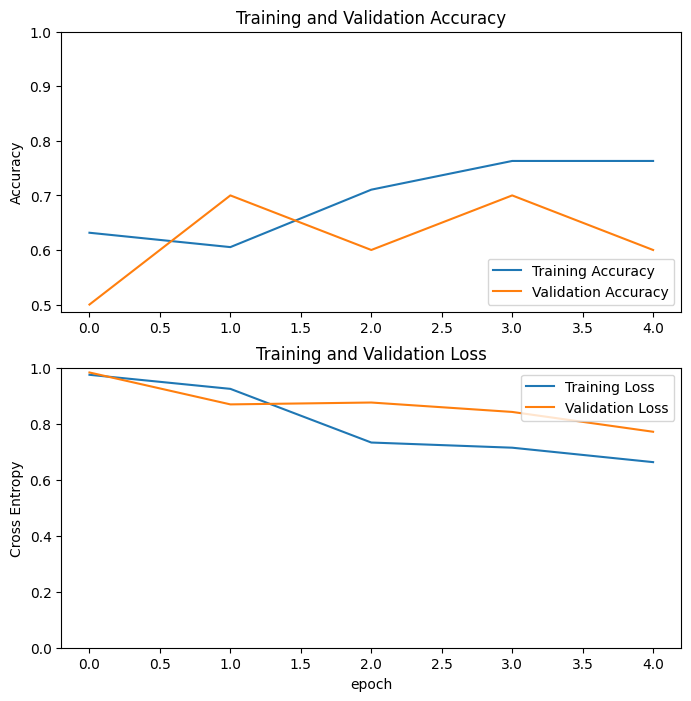

In [32]:
acc = history_EfficientNetB2_fe.history['accuracy']
val_acc = history_EfficientNetB2_fe.history['val_accuracy']

loss = history_EfficientNetB2_fe.history['loss']
val_loss = history_EfficientNetB2_fe.history['val_loss']

In [60]:
model = get_architecture(y, Model_version="EfficientNetB2", as_feature_extractor=False)

In [25]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                           

 block_3_expand_relu (ReLU)     (None, 56, 56, 144)  0           ['block_3_expand_BN[0][0]']      
                                                                                                  
 block_3_pad (ZeroPadding2D)    (None, 57, 57, 144)  0           ['block_3_expand_relu[0][0]']    
                                                                                                  
 block_3_depthwise (DepthwiseCo  (None, 28, 28, 144)  1296       ['block_3_pad[0][0]']            
 nv2D)                                                                                            
                                                                                                  
 block_3_depthwise_BN (BatchNor  (None, 28, 28, 144)  576        ['block_3_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_3_d

 lization)                                                                                        
                                                                                                  
 block_7_expand (Conv2D)        (None, 14, 14, 384)  24576       ['block_6_project_BN[0][0]']     
                                                                                                  
 block_7_expand_BN (BatchNormal  (None, 14, 14, 384)  1536       ['block_7_expand[0][0]']         
 ization)                                                                                         
                                                                                                  
 block_7_expand_relu (ReLU)     (None, 14, 14, 384)  0           ['block_7_expand_BN[0][0]']      
                                                                                                  
 block_7_depthwise (DepthwiseCo  (None, 14, 14, 384)  3456       ['block_7_expand_relu[0][0]']    
 nv2D)    

                                                                                                  
 block_10_depthwise_relu (ReLU)  (None, 14, 14, 384)  0          ['block_10_depthwise_BN[0][0]']  
                                                                                                  
 block_10_project (Conv2D)      (None, 14, 14, 96)   36864       ['block_10_depthwise_relu[0][0]']
                                                                                                  
 block_10_project_BN (BatchNorm  (None, 14, 14, 96)  384         ['block_10_project[0][0]']       
 alization)                                                                                       
                                                                                                  
 block_11_expand (Conv2D)       (None, 14, 14, 576)  55296       ['block_10_project_BN[0][0]']    
                                                                                                  
 block_11_

 block_14_depthwise (DepthwiseC  (None, 7, 7, 960)   8640        ['block_14_expand_relu[0][0]']   
 onv2D)                                                                                           
                                                                                                  
 block_14_depthwise_BN (BatchNo  (None, 7, 7, 960)   3840        ['block_14_depthwise[0][0]']     
 rmalization)                                                                                     
                                                                                                  
 block_14_depthwise_relu (ReLU)  (None, 7, 7, 960)   0           ['block_14_depthwise_BN[0][0]']  
                                                                                                  
 block_14_project (Conv2D)      (None, 7, 7, 160)    153600      ['block_14_depthwise_relu[0][0]']
                                                                                                  
 block_14_

In [30]:

history_EfficientNetB2_ft = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=total_epochs,
    initial_epoch = history_EfficientNetB2_fe.epoch[-1],
    
    
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, total_epochs // 2, 0.25),
)

#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final EfficientNetB2 (Fine-Tune) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 5/15
10/10 [==============================] - 14s 948ms/step - loss: 1.4189 - accuracy: 0.3684 - val_loss: 1.4031 - val_accuracy: 0.3000
Epoch 6/15
10/10 [==============================] - 8s 843ms/step - loss: 0.8484 - accuracy: 0.6842 - val_loss: 1.2818 - val_accuracy: 0.5000
Epoch 7/15
10/10 [==============================] - 8s 758ms/step - loss: 1.0287 - accuracy: 0.6316 - val_loss: 1.4217 - val_accuracy: 0.3000
Epoch 8/15
10/10 [==============================] - 8s 787ms/step - loss: 0.4423 - accuracy: 0.8158 - val_loss: 1.4566 - val_accuracy: 0.4000
Epoch 9/15
10/10 [==============================] - 9s 927ms/step - loss: 0.3196 - accuracy: 0.8947 - val_loss: 1.5023 - val_accuracy: 0.6000
Epoch 10/15
10/10 [==============================] - 9s 867ms/step - loss: 0.1549 - accuracy: 0.9737 - val_loss: 1.5191 - val_accuracy: 0.6000
Epoch 11/15
10/10 [==============================] - 8s 784ms/step - loss: 0.2514 - accuracy: 0.9474 - val_loss: 1.8953 - val_accuracy: 0.5000
Epo

In [33]:
acc += history_EfficientNetB2_ft.history['accuracy']
val_acc += history_EfficientNetB2_ft.history['val_accuracy']

loss += history_EfficientNetB2_ft.history['loss']
val_loss += history_EfficientNetB2_ft.history['val_loss']

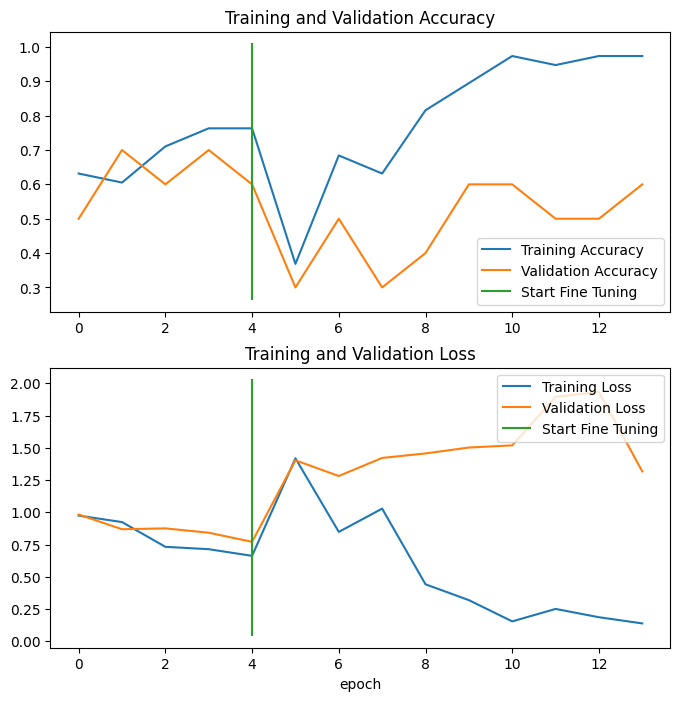

In [34]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
#plt.ylim([0.8, 1])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
#plt.ylim([0, 1.0])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

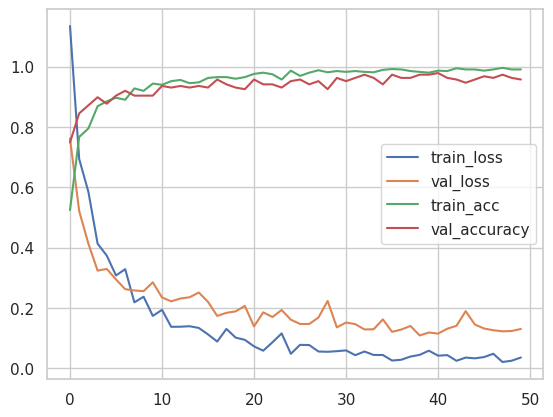

In [42]:
# plot the loss and accuracy curves
plt.plot(history_EfficientNetB2_ft.history['loss'], label='train_loss')
plt.plot(history_EfficientNetB2_ft.history['val_loss'], label='val_loss')
plt.plot(history_EfficientNetB2_ft.history['accuracy'], label='train_acc')
plt.plot(history_EfficientNetB2_ft.history['val_accuracy'], label='val_accuracy')
plt.legend()
plt.show()

In [46]:
y_pred = model.predict(X_test)

8/8 [==============================] - 4s 188ms/step


In [47]:
y_pred = np.argmax(y_pred, axis=1)
y_test = np.argmax(y_test, axis=1)

In [48]:
print('Classification Report EfficientNetB2:\n', classification_report(y_test, y_pred))

Classification Report EfficientNetB2:
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        69
           1       0.97      1.00      0.98        65
           2       0.99      1.00      0.99        72
           3       0.84      0.96      0.90        28

    accuracy                           0.97       234
   macro avg       0.95      0.97      0.96       234
weighted avg       0.97      0.97      0.97       234



(array([0.5, 1.5, 2.5, 3.5]),
 [Text(0, 0.5, 'False Amaranth'),
  Text(0, 1.5, 'Horse Purslane'),
  Text(0, 2.5, 'Purple Nutsedge'),
  Text(0, 3.5, 'Wild Cucurbit')])

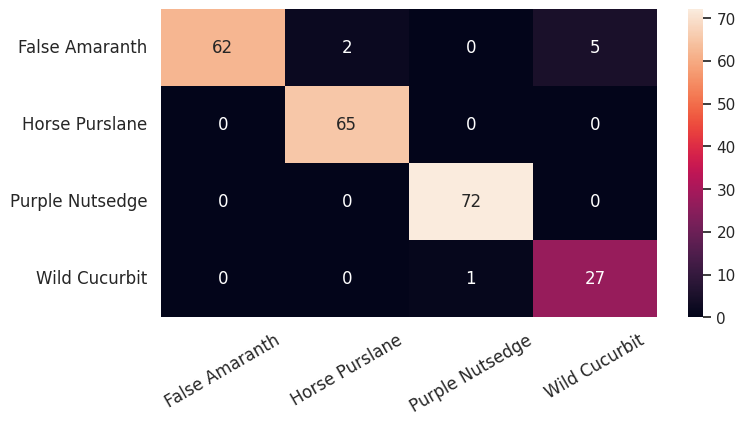

In [49]:
cm = confusion_matrix(y_test, y_pred)

class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']


plt.figure(figsize=(8, 4))
df_cm = pd.DataFrame(cm, index=class_names,
                     columns=class_names)
sns.set(font_scale=1.0)
sns.heatmap(df_cm, annot=True, annot_kws={"size": 12},  fmt='0.0f')
plt.xticks(rotation=30, fontsize=12)
plt.yticks(fontsize=12)

#plt.savefig('EV2_bo_ftNA_heatmap.png')

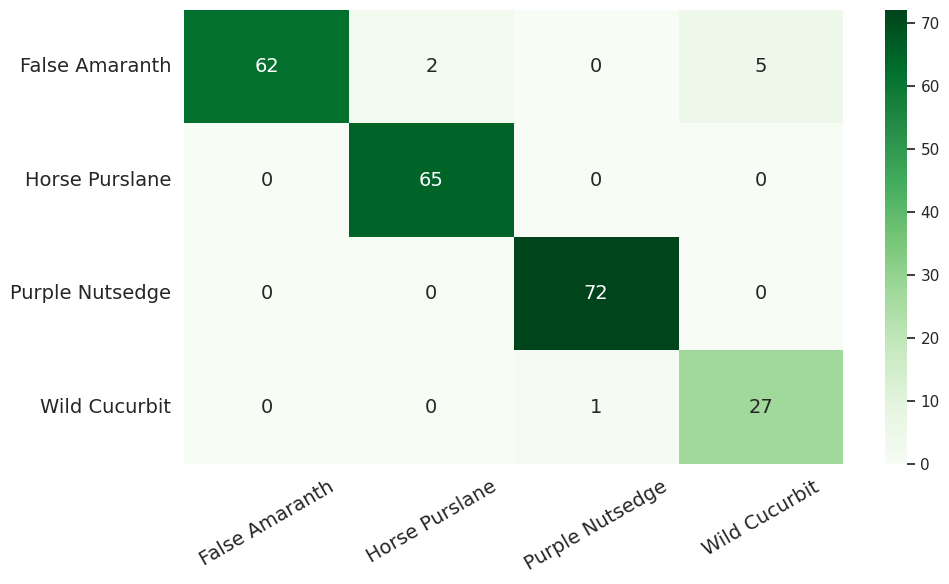

In [50]:
plt.figure(figsize=(8, 4))
conf_mat = cm / np.sum(cm, 1)
class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']

df_cm1 = pd.DataFrame(conf_mat, index=class_names,
                     columns=class_names)
#sns.set(font_scale=1.0)
sns.heatmap(df_cm1, annot=True, annot_kws={"size": 14}, cmap='Greens',  fmt='0.0f')

plt.xticks(rotation=20, fontsize=12)
plt.yticks(fontsize=12)

In [1]:
import pandas as pd

from decimal import Decimal


#df_cm1

for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], Decimal):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 2))
for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], float):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 1))            
df_cm1

NameError: name 'df_cm1' is not defined

In [51]:
model = get_architecture(y, Model_version="EfficientNetB3", as_feature_extractor=True)

43941136/43941136 [==============================] - 0s 0us/step


In [52]:
model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 rescaling_5 (Rescaling)     (None, 224, 224, 3)          0         ['input_4[0][0]']             
                                                                                                  
 normalization_2 (Normaliza  (None, 224, 224, 3)          7         ['rescaling_5[0][0]']         
 tion)                                                                                            
                                                                                                  
 rescaling_6 (Rescaling)     (None, 224, 224, 3)          0         ['normalization_2[0][0]'

In [53]:
X_prep = tf.keras.applications.mobilenet_v3.preprocess_input(X)

X_train, X_test, y_train, y_test = train_test_split(
    X_prep,
    y,
    test_size=TEST_SPLIT,
    shuffle=True,
    stratify=y,
    random_state=RANDOM_STATE
)

X_train, X_val, y_train, y_val = train_test_split(
    X_train,
    y_train,
    test_size=VAL_SPLIT,
    shuffle=True,
    stratify=y_train,
    random_state=RANDOM_STATE,
)

In [54]:

history_EfficientNetB3_fe = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=NUM_EPOCHS,
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, NUM_EPOCHS // 2, 0.25),
)
#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final EfficientNetB3 (Feature-Extractor) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 1/50
187/187 [==============================] - 59s 130ms/step - loss: 1.0590 - accuracy: 0.5777 - val_loss: 0.7374 - val_accuracy: 0.8021
Epoch 2/50
187/187 [==============================] - 17s 93ms/step - loss: 0.6938 - accuracy: 0.7520 - val_loss: 0.5001 - val_accuracy: 0.8877
Epoch 3/50
187/187 [==============================] - 18s 95ms/step - loss: 0.4856 - accuracy: 0.8271 - val_loss: 0.3471 - val_accuracy: 0.9305
Epoch 4/50
187/187 [==============================] - 17s 93ms/step - loss: 0.3936 - accuracy: 0.8633 - val_loss: 0.3022 - val_accuracy: 0.9305
Epoch 5/50
187/187 [==============================] - 17s 91ms/step - loss: 0.3648 - accuracy: 0.8820 - val_loss: 0.3363 - val_accuracy: 0.8770
Epoch 6/50
187/187 [==============================] - 18s 98ms/step - loss: 0.3039 - accuracy: 0.8968 - val_loss: 0.2381 - val_accuracy: 0.9358
Epoch 7/50
187/187 [==============================] - 17s 90ms/step - loss: 0.2447 - accuracy: 0.9075 - val_loss: 0.2235 - val_accuracy

In [55]:
history_EfficientNetB3_fe.history

{'loss': [1.0589532852172852,
  0.6938373446464539,
  0.48558035492897034,
  0.3936174511909485,
  0.3648190200328827,
  0.30387744307518005,
  0.24470408260822296,
  0.19427606463432312,
  0.2478572577238083,
  0.1423330157995224,
  0.13537374138832092,
  0.11594423651695251,
  0.13954514265060425,
  0.11032677441835403,
  0.12089768797159195,
  0.16136260330677032,
  0.07711277902126312,
  0.09167082607746124,
  0.09640655666589737,
  0.08574965596199036,
  0.08145509660243988,
  0.08305040746927261,
  0.06193803250789642,
  0.08193036168813705,
  0.09482760727405548,
  0.034641098231077194,
  0.06487872451543808,
  0.03252391889691353,
  0.028090503066778183,
  0.028649048879742622,
  0.06059959530830383,
  0.05263660475611687,
  0.05197662487626076,
  0.06390734016895294,
  0.06382858753204346,
  0.022829029709100723,
  0.05045066028833389,
  0.053290411829948425,
  0.05775963142514229,
  0.03515380993485451,
  0.07138199359178543,
  0.023995427414774895,
  0.038619622588157654,
  

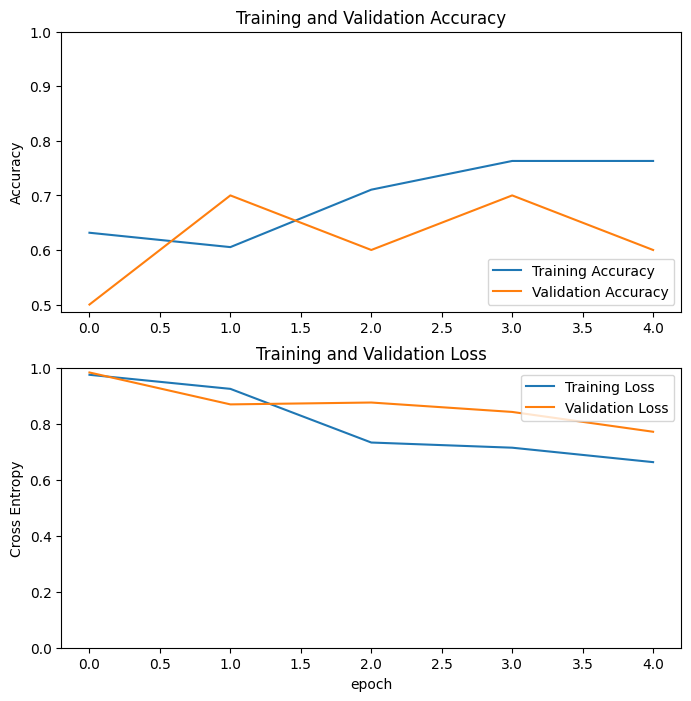

In [32]:
acc = history_EfficientNetB3_fe.history['accuracy']
val_acc = history_EfficientNetB3_fe.history['val_accuracy']

loss = history_EfficientNetB3_fe.history['loss']
val_loss = history_EfficientNetB3_fe.history['val_loss']

In [60]:
model = get_architecture(y, Model_version="EfficientNetB3", as_feature_extractor=False)

In [25]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                           

 block_3_expand_relu (ReLU)     (None, 56, 56, 144)  0           ['block_3_expand_BN[0][0]']      
                                                                                                  
 block_3_pad (ZeroPadding2D)    (None, 57, 57, 144)  0           ['block_3_expand_relu[0][0]']    
                                                                                                  
 block_3_depthwise (DepthwiseCo  (None, 28, 28, 144)  1296       ['block_3_pad[0][0]']            
 nv2D)                                                                                            
                                                                                                  
 block_3_depthwise_BN (BatchNor  (None, 28, 28, 144)  576        ['block_3_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_3_d

 lization)                                                                                        
                                                                                                  
 block_7_expand (Conv2D)        (None, 14, 14, 384)  24576       ['block_6_project_BN[0][0]']     
                                                                                                  
 block_7_expand_BN (BatchNormal  (None, 14, 14, 384)  1536       ['block_7_expand[0][0]']         
 ization)                                                                                         
                                                                                                  
 block_7_expand_relu (ReLU)     (None, 14, 14, 384)  0           ['block_7_expand_BN[0][0]']      
                                                                                                  
 block_7_depthwise (DepthwiseCo  (None, 14, 14, 384)  3456       ['block_7_expand_relu[0][0]']    
 nv2D)    

                                                                                                  
 block_10_depthwise_relu (ReLU)  (None, 14, 14, 384)  0          ['block_10_depthwise_BN[0][0]']  
                                                                                                  
 block_10_project (Conv2D)      (None, 14, 14, 96)   36864       ['block_10_depthwise_relu[0][0]']
                                                                                                  
 block_10_project_BN (BatchNorm  (None, 14, 14, 96)  384         ['block_10_project[0][0]']       
 alization)                                                                                       
                                                                                                  
 block_11_expand (Conv2D)       (None, 14, 14, 576)  55296       ['block_10_project_BN[0][0]']    
                                                                                                  
 block_11_

 block_14_depthwise (DepthwiseC  (None, 7, 7, 960)   8640        ['block_14_expand_relu[0][0]']   
 onv2D)                                                                                           
                                                                                                  
 block_14_depthwise_BN (BatchNo  (None, 7, 7, 960)   3840        ['block_14_depthwise[0][0]']     
 rmalization)                                                                                     
                                                                                                  
 block_14_depthwise_relu (ReLU)  (None, 7, 7, 960)   0           ['block_14_depthwise_BN[0][0]']  
                                                                                                  
 block_14_project (Conv2D)      (None, 7, 7, 160)    153600      ['block_14_depthwise_relu[0][0]']
                                                                                                  
 block_14_

In [30]:

history_EfficientNetB3_ft = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=total_epochs,
    initial_epoch = history_EfficientNetB3_fe.epoch[-1],
    
    
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, total_epochs // 2, 0.25),
)

#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final EfficientNetB3 (Fine-Tune) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 5/15
10/10 [==============================] - 14s 948ms/step - loss: 1.4189 - accuracy: 0.3684 - val_loss: 1.4031 - val_accuracy: 0.3000
Epoch 6/15
10/10 [==============================] - 8s 843ms/step - loss: 0.8484 - accuracy: 0.6842 - val_loss: 1.2818 - val_accuracy: 0.5000
Epoch 7/15
10/10 [==============================] - 8s 758ms/step - loss: 1.0287 - accuracy: 0.6316 - val_loss: 1.4217 - val_accuracy: 0.3000
Epoch 8/15
10/10 [==============================] - 8s 787ms/step - loss: 0.4423 - accuracy: 0.8158 - val_loss: 1.4566 - val_accuracy: 0.4000
Epoch 9/15
10/10 [==============================] - 9s 927ms/step - loss: 0.3196 - accuracy: 0.8947 - val_loss: 1.5023 - val_accuracy: 0.6000
Epoch 10/15
10/10 [==============================] - 9s 867ms/step - loss: 0.1549 - accuracy: 0.9737 - val_loss: 1.5191 - val_accuracy: 0.6000
Epoch 11/15
10/10 [==============================] - 8s 784ms/step - loss: 0.2514 - accuracy: 0.9474 - val_loss: 1.8953 - val_accuracy: 0.5000
Epo

In [33]:
acc += history_EfficientNetB3_ft.history['accuracy']
val_acc += history_EfficientNetB3_ft.history['val_accuracy']

loss += history_EfficientNetB3_ft.history['loss']
val_loss += history_EfficientNetB3_ft.history['val_loss']

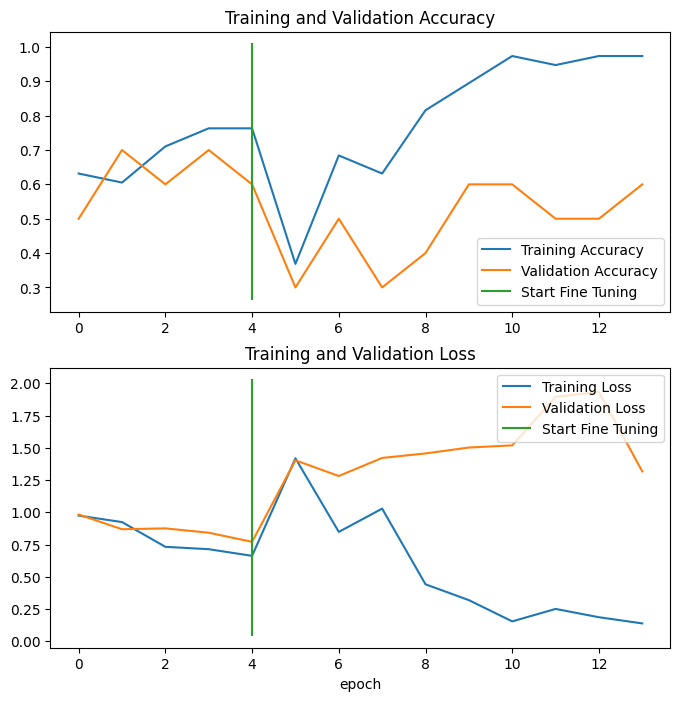

In [34]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
#plt.ylim([0.8, 1])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
#plt.ylim([0, 1.0])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

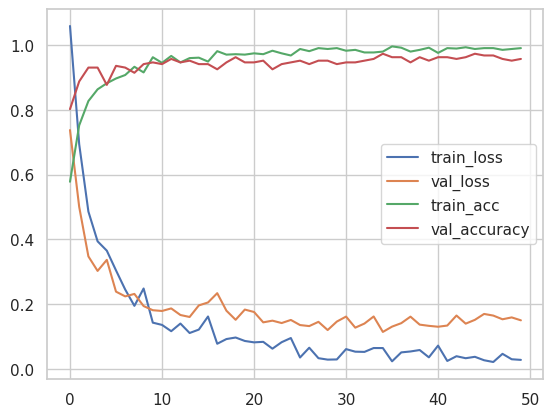

In [56]:
# plot the loss and accuracy curves
plt.plot(history_EfficientNetB3_ft.history['loss'], label='train_loss')
plt.plot(history_EfficientNetB3_ft.history['val_loss'], label='val_loss')
plt.plot(history_EfficientNetB3_ft.history['accuracy'], label='train_acc')
plt.plot(history_EfficientNetB3_ft.history['val_accuracy'], label='val_accuracy')
plt.legend()
plt.show()

In [60]:
y_pred = model.predict(X_test)

8/8 [==============================] - 6s 250ms/step


In [61]:
y_pred = np.argmax(y_pred, axis=1)
y_test = np.argmax(y_test, axis=1)

In [62]:
print('Classification Report EfficientNetB3:\n', classification_report(y_test, y_pred))

Classification Report EfficientNetB3:
               precision    recall  f1-score   support

           0       1.00      0.93      0.96        69
           1       0.90      1.00      0.95        65
           2       0.99      0.96      0.97        72
           3       0.93      0.93      0.93        28

    accuracy                           0.96       234
   macro avg       0.95      0.95      0.95       234
weighted avg       0.96      0.96      0.96       234



(array([0.5, 1.5, 2.5, 3.5]),
 [Text(0, 0.5, 'False Amaranth'),
  Text(0, 1.5, 'Horse Purslane'),
  Text(0, 2.5, 'Purple Nutsedge'),
  Text(0, 3.5, 'Wild Cucurbit')])

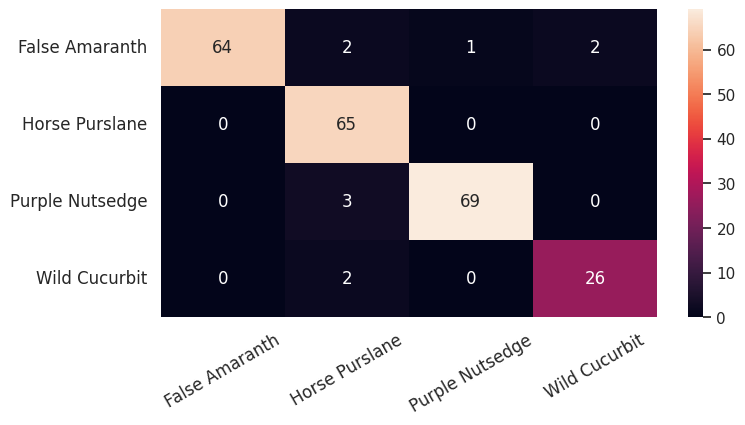

In [63]:
cm = confusion_matrix(y_test, y_pred)

class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']


plt.figure(figsize=(8, 4))
df_cm = pd.DataFrame(cm, index=class_names,
                     columns=class_names)
sns.set(font_scale=1.0)
sns.heatmap(df_cm, annot=True, annot_kws={"size": 12},  fmt='0.0f')
plt.xticks(rotation=30, fontsize=12)
plt.yticks(fontsize=12)

#plt.savefig('EV2_bo_ftNA_heatmap.png')

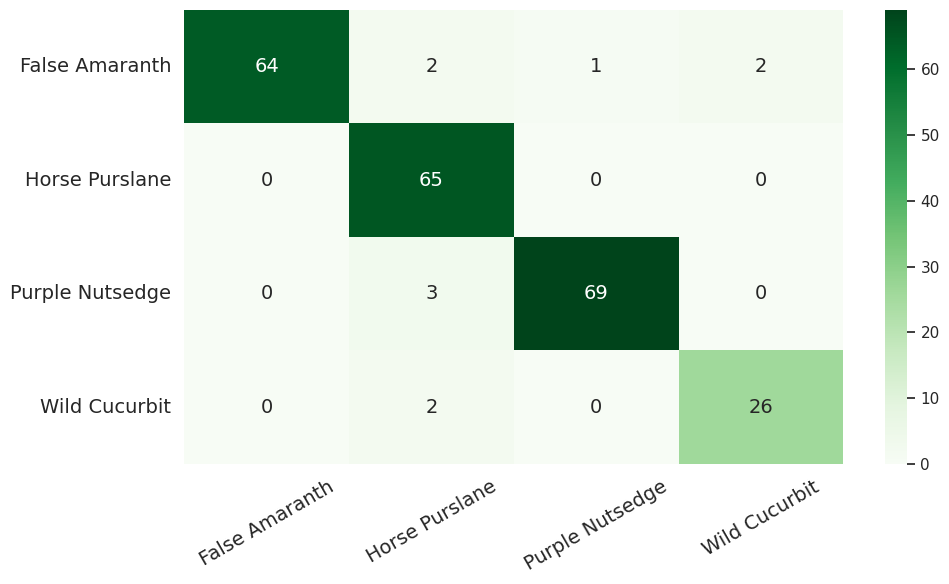

In [64]:
plt.figure(figsize=(8, 4))
conf_mat = cm / np.sum(cm, 1)
class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']

df_cm1 = pd.DataFrame(conf_mat, index=class_names,
                     columns=class_names)
#sns.set(font_scale=1.0)
sns.heatmap(df_cm1, annot=True, annot_kws={"size": 14}, cmap='Greens',  fmt='0.0f')

plt.xticks(rotation=20, fontsize=12)
plt.yticks(fontsize=12)

In [1]:
import pandas as pd

from decimal import Decimal


#df_cm1

for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], Decimal):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 2))
for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], float):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 1))            
df_cm1

NameError: name 'df_cm1' is not defined

In [65]:
model = get_architecture(y, Model_version="EfficientNetB4", as_feature_extractor=True)

71686520/71686520 [==============================] - 0s 0us/step


In [66]:
model.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_5 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 rescaling_7 (Rescaling)     (None, 224, 224, 3)          0         ['input_5[0][0]']             
                                                                                                  
 normalization_3 (Normaliza  (None, 224, 224, 3)          7         ['rescaling_7[0][0]']         
 tion)                                                                                            
                                                                                                  
 rescaling_8 (Rescaling)     (None, 224, 224, 3)          0         ['normalization_3[0][0]'

In [67]:
X_prep = tf.keras.applications.mobilenet_v3.preprocess_input(X)

X_train, X_test, y_train, y_test = train_test_split(
    X_prep,
    y,
    test_size=TEST_SPLIT,
    shuffle=True,
    stratify=y,
    random_state=RANDOM_STATE
)

X_train, X_val, y_train, y_val = train_test_split(
    X_train,
    y_train,
    test_size=VAL_SPLIT,
    shuffle=True,
    stratify=y_train,
    random_state=RANDOM_STATE,
)

In [68]:

history_EfficientNetB4_fe = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=NUM_EPOCHS,
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, NUM_EPOCHS // 2, 0.25),
)
#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final EfficientNetB4 (Feature-Extractor) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 1/50
187/187 [==============================] - 69s 145ms/step - loss: 1.1791 - accuracy: 0.4933 - val_loss: 0.9402 - val_accuracy: 0.7005
Epoch 2/50
187/187 [==============================] - 22s 117ms/step - loss: 0.8190 - accuracy: 0.6863 - val_loss: 0.6322 - val_accuracy: 0.7968
Epoch 3/50
187/187 [==============================] - 23s 123ms/step - loss: 0.5605 - accuracy: 0.8164 - val_loss: 0.4599 - val_accuracy: 0.8824
Epoch 4/50
187/187 [==============================] - 22s 120ms/step - loss: 0.4584 - accuracy: 0.8445 - val_loss: 0.3806 - val_accuracy: 0.9037
Epoch 5/50
187/187 [==============================] - 25s 133ms/step - loss: 0.3941 - accuracy: 0.8660 - val_loss: 0.3677 - val_accuracy: 0.9091
Epoch 6/50
187/187 [==============================] - 21s 114ms/step - loss: 0.3375 - accuracy: 0.8954 - val_loss: 0.3357 - val_accuracy: 0.9037
Epoch 7/50
187/187 [==============================] - 22s 119ms/step - loss: 0.2937 - accuracy: 0.9008 - val_loss: 0.3113 - val_ac

In [69]:
history_EfficientNetB4_fe.history

{'loss': [1.1790906190872192,
  0.8190033435821533,
  0.5604548454284668,
  0.4584398567676544,
  0.39407065510749817,
  0.33752843737602234,
  0.29367271065711975,
  0.21202486753463745,
  0.28382590413093567,
  0.267744779586792,
  0.20287412405014038,
  0.19768542051315308,
  0.14393864572048187,
  0.15061499178409576,
  0.15682104229927063,
  0.10941608250141144,
  0.12228377908468246,
  0.12246536463499069,
  0.09375317394733429,
  0.10185497254133224,
  0.08673055469989777,
  0.07306365668773651,
  0.08631106466054916,
  0.10206807404756546,
  0.07013358920812607,
  0.08389666676521301,
  0.06834136694669724,
  0.04370944947004318,
  0.06437837332487106,
  0.10039202868938446,
  0.07649246603250504,
  0.06467490643262863,
  0.05401318147778511,
  0.02870030514895916,
  0.036451369524002075,
  0.05731391906738281,
  0.054502084851264954,
  0.03519761189818382,
  0.03856821730732918,
  0.05659467354416847,
  0.05510106682777405,
  0.047794509679079056,
  0.051169220358133316,
  0.0

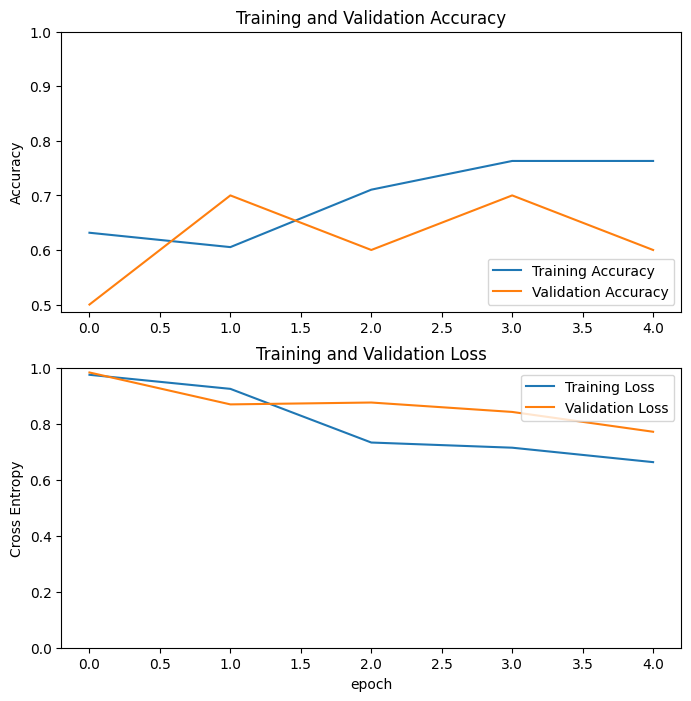

In [32]:
acc = history_EfficientNetB4_fe.history['accuracy']
val_acc = history_EfficientNetB4_fe.history['val_accuracy']

loss = history_EfficientNetB4_fe.history['loss']
val_loss = history_EfficientNetB4_fe.history['val_loss']

In [60]:
model = get_architecture(y, Model_version="EfficientNetB4", as_feature_extractor=False)

In [25]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                           

 block_3_expand_relu (ReLU)     (None, 56, 56, 144)  0           ['block_3_expand_BN[0][0]']      
                                                                                                  
 block_3_pad (ZeroPadding2D)    (None, 57, 57, 144)  0           ['block_3_expand_relu[0][0]']    
                                                                                                  
 block_3_depthwise (DepthwiseCo  (None, 28, 28, 144)  1296       ['block_3_pad[0][0]']            
 nv2D)                                                                                            
                                                                                                  
 block_3_depthwise_BN (BatchNor  (None, 28, 28, 144)  576        ['block_3_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_3_d

 lization)                                                                                        
                                                                                                  
 block_7_expand (Conv2D)        (None, 14, 14, 384)  24576       ['block_6_project_BN[0][0]']     
                                                                                                  
 block_7_expand_BN (BatchNormal  (None, 14, 14, 384)  1536       ['block_7_expand[0][0]']         
 ization)                                                                                         
                                                                                                  
 block_7_expand_relu (ReLU)     (None, 14, 14, 384)  0           ['block_7_expand_BN[0][0]']      
                                                                                                  
 block_7_depthwise (DepthwiseCo  (None, 14, 14, 384)  3456       ['block_7_expand_relu[0][0]']    
 nv2D)    

                                                                                                  
 block_10_depthwise_relu (ReLU)  (None, 14, 14, 384)  0          ['block_10_depthwise_BN[0][0]']  
                                                                                                  
 block_10_project (Conv2D)      (None, 14, 14, 96)   36864       ['block_10_depthwise_relu[0][0]']
                                                                                                  
 block_10_project_BN (BatchNorm  (None, 14, 14, 96)  384         ['block_10_project[0][0]']       
 alization)                                                                                       
                                                                                                  
 block_11_expand (Conv2D)       (None, 14, 14, 576)  55296       ['block_10_project_BN[0][0]']    
                                                                                                  
 block_11_

 block_14_depthwise (DepthwiseC  (None, 7, 7, 960)   8640        ['block_14_expand_relu[0][0]']   
 onv2D)                                                                                           
                                                                                                  
 block_14_depthwise_BN (BatchNo  (None, 7, 7, 960)   3840        ['block_14_depthwise[0][0]']     
 rmalization)                                                                                     
                                                                                                  
 block_14_depthwise_relu (ReLU)  (None, 7, 7, 960)   0           ['block_14_depthwise_BN[0][0]']  
                                                                                                  
 block_14_project (Conv2D)      (None, 7, 7, 160)    153600      ['block_14_depthwise_relu[0][0]']
                                                                                                  
 block_14_

In [30]:

history_EfficientNetB4_ft = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=total_epochs,
    initial_epoch = history_EfficientNetB4_fe.epoch[-1],
    
    
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, total_epochs // 2, 0.25),
)

#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final EfficientNetB4 (Fine-Tune) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 5/15
10/10 [==============================] - 14s 948ms/step - loss: 1.4189 - accuracy: 0.3684 - val_loss: 1.4031 - val_accuracy: 0.3000
Epoch 6/15
10/10 [==============================] - 8s 843ms/step - loss: 0.8484 - accuracy: 0.6842 - val_loss: 1.2818 - val_accuracy: 0.5000
Epoch 7/15
10/10 [==============================] - 8s 758ms/step - loss: 1.0287 - accuracy: 0.6316 - val_loss: 1.4217 - val_accuracy: 0.3000
Epoch 8/15
10/10 [==============================] - 8s 787ms/step - loss: 0.4423 - accuracy: 0.8158 - val_loss: 1.4566 - val_accuracy: 0.4000
Epoch 9/15
10/10 [==============================] - 9s 927ms/step - loss: 0.3196 - accuracy: 0.8947 - val_loss: 1.5023 - val_accuracy: 0.6000
Epoch 10/15
10/10 [==============================] - 9s 867ms/step - loss: 0.1549 - accuracy: 0.9737 - val_loss: 1.5191 - val_accuracy: 0.6000
Epoch 11/15
10/10 [==============================] - 8s 784ms/step - loss: 0.2514 - accuracy: 0.9474 - val_loss: 1.8953 - val_accuracy: 0.5000
Epo

In [33]:
acc += history_EfficientNetB4_ft.history['accuracy']
val_acc += history_EfficientNetB4_ft.history['val_accuracy']

loss += history_EfficientNetB4_ft.history['loss']
val_loss += history_EfficientNetB4_ft.history['val_loss']

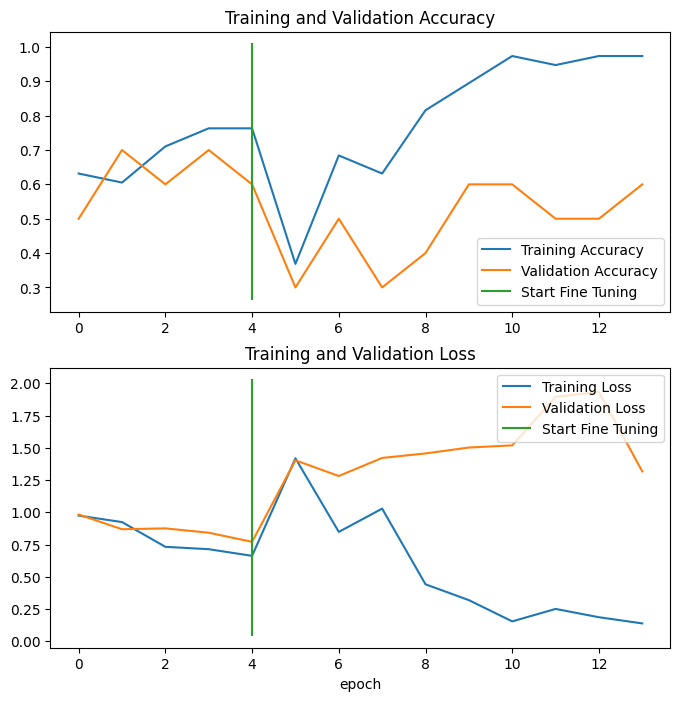

In [34]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
#plt.ylim([0.8, 1])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
#plt.ylim([0, 1.0])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

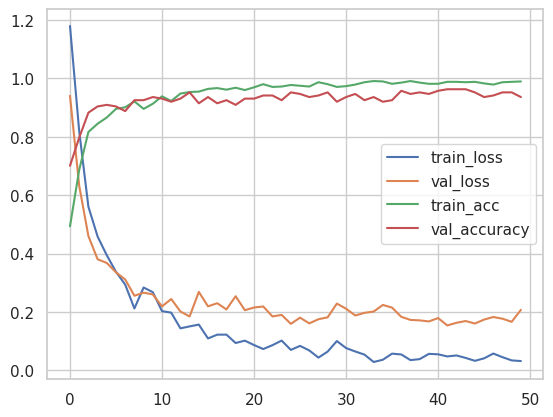

In [70]:
# plot the loss and accuracy curves
plt.plot(history_EfficientNetB4_ft.history['loss'], label='train_loss')
plt.plot(history_EfficientNetB4_ft.history['val_loss'], label='val_loss')
plt.plot(history_EfficientNetB4_ft.history['accuracy'], label='train_acc')
plt.plot(history_EfficientNetB4_ft.history['val_accuracy'], label='val_accuracy')
plt.legend()
plt.show()

In [74]:
y_pred = model.predict(X_test)

8/8 [==============================] - 6s 241ms/step


In [75]:
y_pred = np.argmax(y_pred, axis=1)
y_test = np.argmax(y_test, axis=1)

In [76]:
print('Classification Report EfficientNetB4:\n', classification_report(y_test, y_pred))

Classification Report EfficientNetB4:
               precision    recall  f1-score   support

           0       0.97      0.88      0.92        69
           1       0.89      0.98      0.93        65
           2       0.96      0.94      0.95        72
           3       0.89      0.89      0.89        28

    accuracy                           0.93       234
   macro avg       0.93      0.93      0.93       234
weighted avg       0.93      0.93      0.93       234



(array([0.5, 1.5, 2.5, 3.5]),
 [Text(0, 0.5, 'False Amaranth'),
  Text(0, 1.5, 'Horse Purslane'),
  Text(0, 2.5, 'Purple Nutsedge'),
  Text(0, 3.5, 'Wild Cucurbit')])

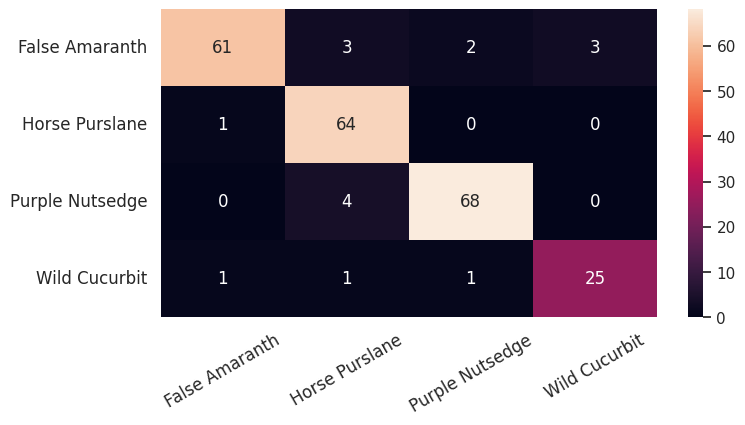

In [77]:
cm = confusion_matrix(y_test, y_pred)

class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']


plt.figure(figsize=(8, 4))
df_cm = pd.DataFrame(cm, index=class_names,
                     columns=class_names)
sns.set(font_scale=1.0)
sns.heatmap(df_cm, annot=True, annot_kws={"size": 12},  fmt='0.0f')
plt.xticks(rotation=30, fontsize=12)
plt.yticks(fontsize=12)

#plt.savefig('EV2_bo_ftNA_heatmap.png')

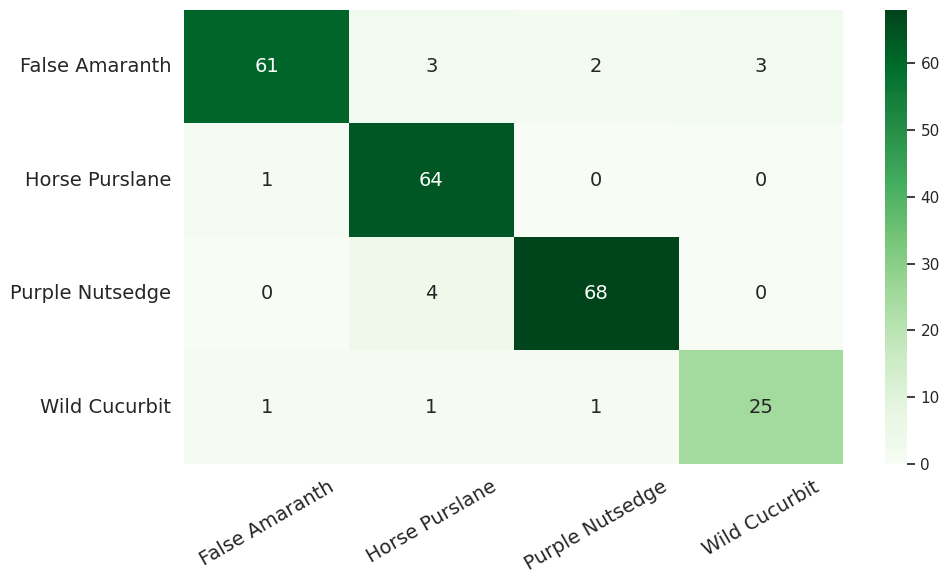

In [78]:
plt.figure(figsize=(8, 4))
conf_mat = cm / np.sum(cm, 1)
class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']

df_cm1 = pd.DataFrame(conf_mat, index=class_names,
                     columns=class_names)
#sns.set(font_scale=1.0)
sns.heatmap(df_cm1, annot=True, annot_kws={"size": 14}, cmap='Greens',  fmt='0.0f')

plt.xticks(rotation=20, fontsize=12)
plt.yticks(fontsize=12)

In [1]:
import pandas as pd

from decimal import Decimal


#df_cm1

for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], Decimal):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 2))
for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], float):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 1))            
df_cm1

NameError: name 'df_cm1' is not defined

In [10]:
model = get_architecture(y, Model_version="Xception", as_feature_extractor=True)

83683744/83683744 [==============================] - 0s 0us/step


In [11]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 block1_conv1 (Conv2D)       (None, 111, 111, 32)         864       ['input_1[0][0]']             
                                                                                                  
 block1_conv1_bn (BatchNorm  (None, 111, 111, 32)         128       ['block1_conv1[0][0]']        
 alization)                                                                                       
                                                                                                  
 block1_conv1_act (Activati  (None, 111, 111, 32)         0         ['block1_conv1_bn[0][0]'] 

In [12]:
X_prep = tf.keras.applications.mobilenet_v3.preprocess_input(X)

X_train, X_test, y_train, y_test = train_test_split(
    X_prep,
    y,
    test_size=TEST_SPLIT,
    shuffle=True,
    stratify=y,
    random_state=RANDOM_STATE
)

X_train, X_val, y_train, y_val = train_test_split(
    X_train,
    y_train,
    test_size=VAL_SPLIT,
    shuffle=True,
    stratify=y_train,
    random_state=RANDOM_STATE,
)

In [13]:

history_Xception_fe = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=NUM_EPOCHS,
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, NUM_EPOCHS // 2, 0.25),
)
#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final Xception (Feature-Extarctor) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 1/50
187/187 [==============================] - 39s 98ms/step - loss: 1.1624 - accuracy: 0.5161 - val_loss: 0.7335 - val_accuracy: 0.7059
Epoch 2/50
187/187 [==============================] - 15s 78ms/step - loss: 0.7911 - accuracy: 0.7118 - val_loss: 0.4286 - val_accuracy: 0.8503
Epoch 3/50
187/187 [==============================] - 15s 81ms/step - loss: 0.5966 - accuracy: 0.7735 - val_loss: 0.3351 - val_accuracy: 0.8930
Epoch 4/50
187/187 [==============================] - 15s 80ms/step - loss: 0.4739 - accuracy: 0.8391 - val_loss: 0.3554 - val_accuracy: 0.8770
Epoch 5/50
187/187 [==============================] - 16s 85ms/step - loss: 0.3623 - accuracy: 0.8794 - val_loss: 0.2304 - val_accuracy: 0.9144
Epoch 6/50
187/187 [==============================] - 15s 83ms/step - loss: 0.3058 - accuracy: 0.8954 - val_loss: 0.2582 - val_accuracy: 0.9144
Epoch 7/50
187/187 [==============================] - 16s 83ms/step - loss: 0.2508 - accuracy: 0.9182 - val_loss: 0.1834 - val_accuracy:

In [14]:
history_Xception_fe.history

{'loss': [1.162381649017334,
  0.7911049723625183,
  0.5965899229049683,
  0.473942369222641,
  0.36234015226364136,
  0.30578601360321045,
  0.2507668137550354,
  0.21953533589839935,
  0.19676558673381805,
  0.13442733883857727,
  0.15983575582504272,
  0.1199875995516777,
  0.12217268347740173,
  0.10433551669120789,
  0.09383691847324371,
  0.08927127718925476,
  0.06957463920116425,
  0.06971398741006851,
  0.05300452187657356,
  0.06509087234735489,
  0.035416197031736374,
  0.04906182736158371,
  0.02907310239970684,
  0.030477572232484818,
  0.04181451350450516,
  0.04887248948216438,
  0.05738883838057518,
  0.03297891095280647,
  0.054178595542907715,
  0.030080711469054222,
  0.03075616993010044,
  0.0185808427631855,
  0.022051770240068436,
  0.014264490455389023,
  0.021692907437682152,
  0.015652146190404892,
  0.011733726598322392,
  0.030219819396734238,
  0.012874400243163109,
  0.010173364542424679,
  0.008201153948903084,
  0.011223582550883293,
  0.01302220299839973

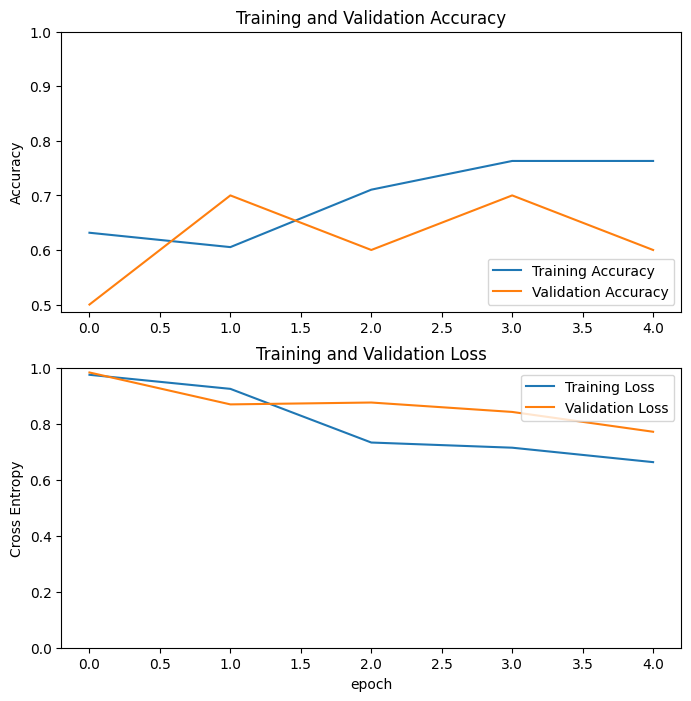

In [32]:
acc = history_Xception_fe.history['accuracy']
val_acc = history_Xception_fe.history['val_accuracy']

loss = history_Xception_fe.history['loss']
val_loss = history_Xception_fe.history['val_loss']

In [60]:
model = get_architecture(y, Model_version="Xception", as_feature_extractor=False)

In [25]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                           

 block_3_expand_relu (ReLU)     (None, 56, 56, 144)  0           ['block_3_expand_BN[0][0]']      
                                                                                                  
 block_3_pad (ZeroPadding2D)    (None, 57, 57, 144)  0           ['block_3_expand_relu[0][0]']    
                                                                                                  
 block_3_depthwise (DepthwiseCo  (None, 28, 28, 144)  1296       ['block_3_pad[0][0]']            
 nv2D)                                                                                            
                                                                                                  
 block_3_depthwise_BN (BatchNor  (None, 28, 28, 144)  576        ['block_3_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_3_d

 lization)                                                                                        
                                                                                                  
 block_7_expand (Conv2D)        (None, 14, 14, 384)  24576       ['block_6_project_BN[0][0]']     
                                                                                                  
 block_7_expand_BN (BatchNormal  (None, 14, 14, 384)  1536       ['block_7_expand[0][0]']         
 ization)                                                                                         
                                                                                                  
 block_7_expand_relu (ReLU)     (None, 14, 14, 384)  0           ['block_7_expand_BN[0][0]']      
                                                                                                  
 block_7_depthwise (DepthwiseCo  (None, 14, 14, 384)  3456       ['block_7_expand_relu[0][0]']    
 nv2D)    

                                                                                                  
 block_10_depthwise_relu (ReLU)  (None, 14, 14, 384)  0          ['block_10_depthwise_BN[0][0]']  
                                                                                                  
 block_10_project (Conv2D)      (None, 14, 14, 96)   36864       ['block_10_depthwise_relu[0][0]']
                                                                                                  
 block_10_project_BN (BatchNorm  (None, 14, 14, 96)  384         ['block_10_project[0][0]']       
 alization)                                                                                       
                                                                                                  
 block_11_expand (Conv2D)       (None, 14, 14, 576)  55296       ['block_10_project_BN[0][0]']    
                                                                                                  
 block_11_

 block_14_depthwise (DepthwiseC  (None, 7, 7, 960)   8640        ['block_14_expand_relu[0][0]']   
 onv2D)                                                                                           
                                                                                                  
 block_14_depthwise_BN (BatchNo  (None, 7, 7, 960)   3840        ['block_14_depthwise[0][0]']     
 rmalization)                                                                                     
                                                                                                  
 block_14_depthwise_relu (ReLU)  (None, 7, 7, 960)   0           ['block_14_depthwise_BN[0][0]']  
                                                                                                  
 block_14_project (Conv2D)      (None, 7, 7, 160)    153600      ['block_14_depthwise_relu[0][0]']
                                                                                                  
 block_14_

In [30]:

history_Xception_ft = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=total_epochs,
    initial_epoch = history_Xception_fe.epoch[-1],
    
    
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, total_epochs // 2, 0.25),
)

#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final hXception (Fine-Tune) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 5/15
10/10 [==============================] - 14s 948ms/step - loss: 1.4189 - accuracy: 0.3684 - val_loss: 1.4031 - val_accuracy: 0.3000
Epoch 6/15
10/10 [==============================] - 8s 843ms/step - loss: 0.8484 - accuracy: 0.6842 - val_loss: 1.2818 - val_accuracy: 0.5000
Epoch 7/15
10/10 [==============================] - 8s 758ms/step - loss: 1.0287 - accuracy: 0.6316 - val_loss: 1.4217 - val_accuracy: 0.3000
Epoch 8/15
10/10 [==============================] - 8s 787ms/step - loss: 0.4423 - accuracy: 0.8158 - val_loss: 1.4566 - val_accuracy: 0.4000
Epoch 9/15
10/10 [==============================] - 9s 927ms/step - loss: 0.3196 - accuracy: 0.8947 - val_loss: 1.5023 - val_accuracy: 0.6000
Epoch 10/15
10/10 [==============================] - 9s 867ms/step - loss: 0.1549 - accuracy: 0.9737 - val_loss: 1.5191 - val_accuracy: 0.6000
Epoch 11/15
10/10 [==============================] - 8s 784ms/step - loss: 0.2514 - accuracy: 0.9474 - val_loss: 1.8953 - val_accuracy: 0.5000
Epo

In [33]:
acc += history_Xception_ft.history['accuracy']
val_acc += history_Xception_ft.history['val_accuracy']

loss += history_Xception_ft.history['loss']
val_loss += history_Xception_ft.history['val_loss']

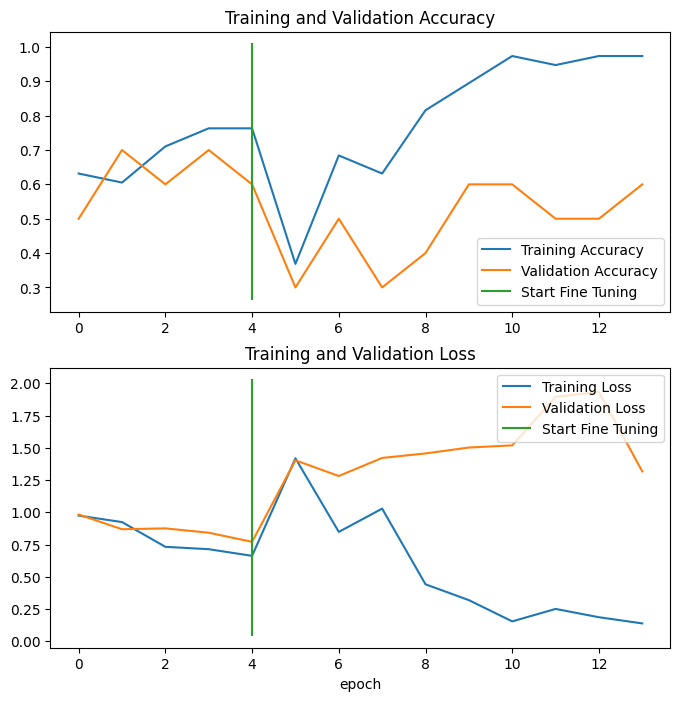

In [34]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
#plt.ylim([0.8, 1])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
#plt.ylim([0, 1.0])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

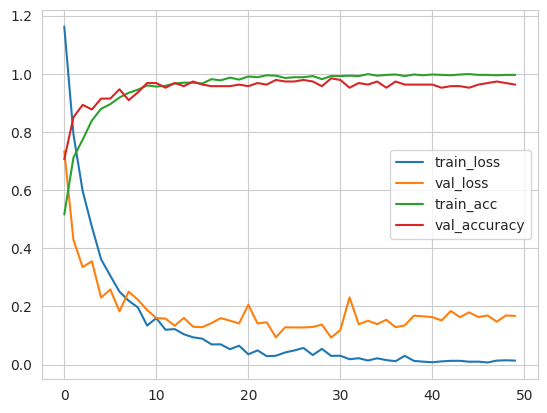

In [15]:
# plot the loss and accuracy curves
plt.plot(history_Xception_ft.history['loss'], label='train_loss')
plt.plot(history_Xception_ft.history['val_loss'], label='val_loss')
plt.plot(history_Xception_ft.history['accuracy'], label='train_acc')
plt.plot(history_Xception_ft.history['val_accuracy'], label='val_accuracy')
plt.legend()
plt.show()

In [19]:
y_pred = model.predict(X_test)

8/8 [==============================] - 7s 383ms/step


In [ ]:
#test_pred = np.argmax(model.predict(X_test), axis=1)

8/8 [==============================] - 14s 2s/step


In [20]:
y_pred = np.argmax(y_pred, axis=1)
y_test = np.argmax(y_test, axis=1)

In [21]:
print('Classification Report Xception:\n', classification_report(y_test, y_pred))

Classification Report Xception:
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        69
           1       0.94      0.97      0.95        65
           2       0.96      0.99      0.97        72
           3       0.81      0.89      0.85        28

    accuracy                           0.94       234
   macro avg       0.93      0.94      0.93       234
weighted avg       0.95      0.94      0.94       234



(array([0.5, 1.5, 2.5, 3.5]),
 [Text(0, 0.5, 'False Amaranth'),
  Text(0, 1.5, 'Horse Purslane'),
  Text(0, 2.5, 'Purple Nutsedge'),
  Text(0, 3.5, 'Wild Cucurbit')])

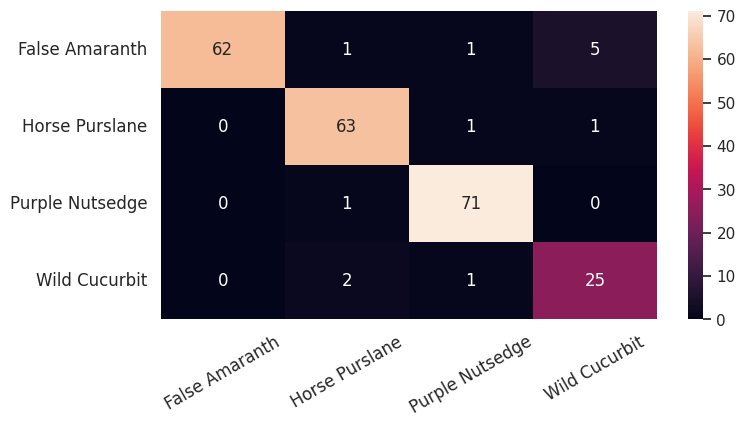

In [22]:
cm = confusion_matrix(y_test, y_pred)

class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']


plt.figure(figsize=(8, 4))
df_cm = pd.DataFrame(cm, index=class_names,
                     columns=class_names)
sns.set(font_scale=1.0)
sns.heatmap(df_cm, annot=True, annot_kws={"size": 12},  fmt='0.0f')
plt.xticks(rotation=30, fontsize=12)
plt.yticks(fontsize=12)

#plt.savefig('EV2_bo_ftNA_heatmap.png')

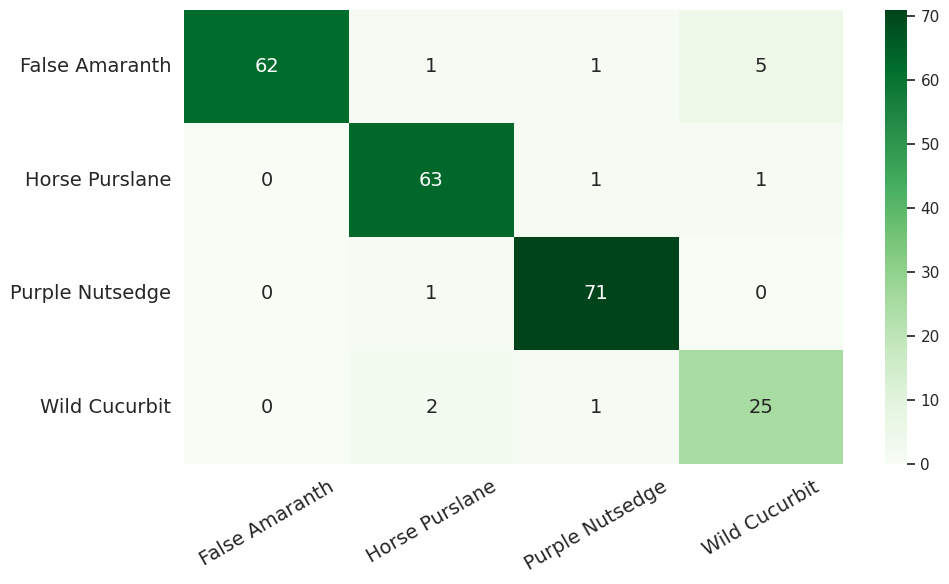

In [23]:
plt.figure(figsize=(8, 4))
conf_mat = cm / np.sum(cm, 1)
class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']

df_cm1 = pd.DataFrame(conf_mat, index=class_names,
                     columns=class_names)
#sns.set(font_scale=1.0)
sns.heatmap(df_cm1, annot=True, annot_kws={"size": 14}, cmap='Greens',  fmt='0.0f')

plt.xticks(rotation=20, fontsize=12)
plt.yticks(fontsize=12)

In [1]:
import pandas as pd

from decimal import Decimal


#df_cm1

for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], Decimal):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 2))
for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], float):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 1))            
df_cm1

NameError: name 'df_cm1' is not defined

In [24]:
model = get_architecture(y, Model_version="InceptionV3", as_feature_extractor=True)

87910968/87910968 [==============================] - 0s 0us/step


In [25]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d_4 (Conv2D)           (None, 111, 111, 32)         864       ['input_2[0][0]']             
                                                                                                  
 batch_normalization_4 (Bat  (None, 111, 111, 32)         96        ['conv2d_4[0][0]']            
 chNormalization)                                                                                 
                                                                                                  
 activation (Activation)     (None, 111, 111, 32)         0         ['batch_normalization_4[

In [26]:
X_prep = tf.keras.applications.mobilenet_v3.preprocess_input(X)

X_train, X_test, y_train, y_test = train_test_split(
    X_prep,
    y,
    test_size=TEST_SPLIT,
    shuffle=True,
    stratify=y,
    random_state=RANDOM_STATE
)

X_train, X_val, y_train, y_val = train_test_split(
    X_train,
    y_train,
    test_size=VAL_SPLIT,
    shuffle=True,
    stratify=y_train,
    random_state=RANDOM_STATE,
)

In [27]:

history_InceptionV3_fe = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=NUM_EPOCHS,
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, NUM_EPOCHS // 2, 0.25),
)
#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final InceptionV3 (Feature-Ecxtractor) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 1/50
187/187 [==============================] - 41s 103ms/step - loss: 0.9997 - accuracy: 0.6046 - val_loss: 0.7658 - val_accuracy: 0.7059
Epoch 2/50
187/187 [==============================] - 12s 63ms/step - loss: 0.6596 - accuracy: 0.7668 - val_loss: 1.0643 - val_accuracy: 0.5722
Epoch 3/50
187/187 [==============================] - 12s 64ms/step - loss: 0.5222 - accuracy: 0.8177 - val_loss: 0.5383 - val_accuracy: 0.8182
Epoch 4/50
187/187 [==============================] - 11s 59ms/step - loss: 0.4980 - accuracy: 0.8257 - val_loss: 0.7683 - val_accuracy: 0.7326
Epoch 5/50
187/187 [==============================] - 12s 67ms/step - loss: 0.4142 - accuracy: 0.8619 - val_loss: 0.3778 - val_accuracy: 0.8930
Epoch 6/50
187/187 [==============================] - 12s 64ms/step - loss: 0.4435 - accuracy: 0.8445 - val_loss: 0.4823 - val_accuracy: 0.8556
Epoch 7/50
187/187 [==============================] - 11s 61ms/step - loss: 0.3471 - accuracy: 0.8901 - val_loss: 0.4997 - val_accuracy

In [28]:
history_InceptionV3_fe.history

{'loss': [0.9997467994689941,
  0.659633457660675,
  0.5222491025924683,
  0.49797266721725464,
  0.4141649305820465,
  0.44348564743995667,
  0.3471364974975586,
  0.344079852104187,
  0.34052008390426636,
  0.2578972280025482,
  0.2676588296890259,
  0.21811315417289734,
  0.21464194357395172,
  0.21146143972873688,
  0.20549018681049347,
  0.18441595137119293,
  0.13009729981422424,
  0.1698635369539261,
  0.1661216765642166,
  0.16445982456207275,
  0.1005006730556488,
  0.06408043205738068,
  0.12293992936611176,
  0.08726567029953003,
  0.15005233883857727,
  0.1024390384554863,
  0.08090201020240784,
  0.060754332691431046,
  0.07861987501382828,
  0.08462239056825638,
  0.07184956222772598,
  0.09725915640592575,
  0.07150145620107651,
  0.0660846084356308,
  0.07629890739917755,
  0.1115482822060585,
  0.06917442381381989,
  0.04611911624670029,
  0.04619399830698967,
  0.06761305779218674,
  0.039405182003974915,
  0.029583359137177467,
  0.046296801418066025,
  0.01790462993

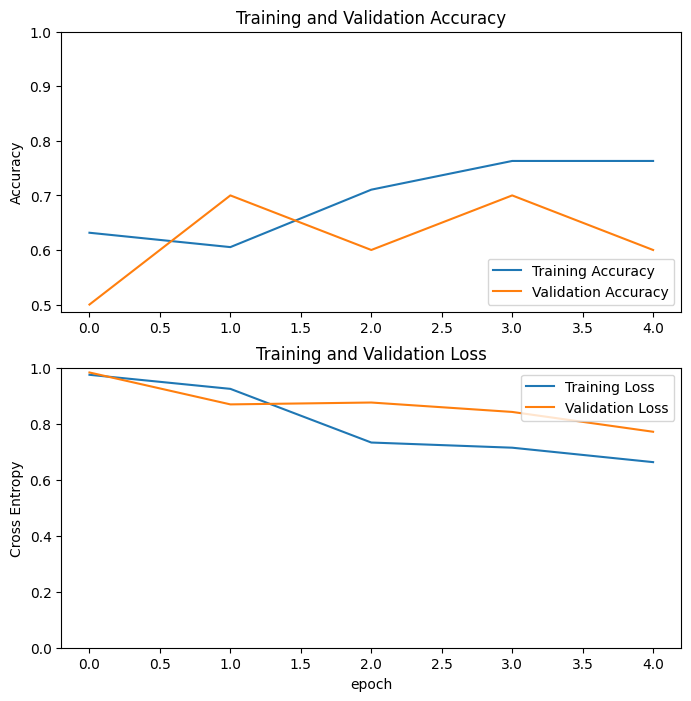

In [32]:
acc = history_InceptionV3_fe.history['accuracy']
val_acc = history_InceptionV3_fe.history['val_accuracy']

loss = history_InceptionV3_fe.history['loss']
val_loss = history_InceptionV3_fe.history['val_loss']

In [60]:
model = get_architecture(y, Model_version="InceptionV3", as_feature_extractor=False)

In [25]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                           

 block_3_expand_relu (ReLU)     (None, 56, 56, 144)  0           ['block_3_expand_BN[0][0]']      
                                                                                                  
 block_3_pad (ZeroPadding2D)    (None, 57, 57, 144)  0           ['block_3_expand_relu[0][0]']    
                                                                                                  
 block_3_depthwise (DepthwiseCo  (None, 28, 28, 144)  1296       ['block_3_pad[0][0]']            
 nv2D)                                                                                            
                                                                                                  
 block_3_depthwise_BN (BatchNor  (None, 28, 28, 144)  576        ['block_3_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_3_d

 lization)                                                                                        
                                                                                                  
 block_7_expand (Conv2D)        (None, 14, 14, 384)  24576       ['block_6_project_BN[0][0]']     
                                                                                                  
 block_7_expand_BN (BatchNormal  (None, 14, 14, 384)  1536       ['block_7_expand[0][0]']         
 ization)                                                                                         
                                                                                                  
 block_7_expand_relu (ReLU)     (None, 14, 14, 384)  0           ['block_7_expand_BN[0][0]']      
                                                                                                  
 block_7_depthwise (DepthwiseCo  (None, 14, 14, 384)  3456       ['block_7_expand_relu[0][0]']    
 nv2D)    

                                                                                                  
 block_10_depthwise_relu (ReLU)  (None, 14, 14, 384)  0          ['block_10_depthwise_BN[0][0]']  
                                                                                                  
 block_10_project (Conv2D)      (None, 14, 14, 96)   36864       ['block_10_depthwise_relu[0][0]']
                                                                                                  
 block_10_project_BN (BatchNorm  (None, 14, 14, 96)  384         ['block_10_project[0][0]']       
 alization)                                                                                       
                                                                                                  
 block_11_expand (Conv2D)       (None, 14, 14, 576)  55296       ['block_10_project_BN[0][0]']    
                                                                                                  
 block_11_

 block_14_depthwise (DepthwiseC  (None, 7, 7, 960)   8640        ['block_14_expand_relu[0][0]']   
 onv2D)                                                                                           
                                                                                                  
 block_14_depthwise_BN (BatchNo  (None, 7, 7, 960)   3840        ['block_14_depthwise[0][0]']     
 rmalization)                                                                                     
                                                                                                  
 block_14_depthwise_relu (ReLU)  (None, 7, 7, 960)   0           ['block_14_depthwise_BN[0][0]']  
                                                                                                  
 block_14_project (Conv2D)      (None, 7, 7, 160)    153600      ['block_14_depthwise_relu[0][0]']
                                                                                                  
 block_14_

In [30]:

history_InceptionV3_ft = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=total_epochs,
    initial_epoch = history_InceptionV3_fe.epoch[-1],
    
    
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, total_epochs // 2, 0.25),
)

#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final InceptionV3 (Fine-Tune) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 5/15
10/10 [==============================] - 14s 948ms/step - loss: 1.4189 - accuracy: 0.3684 - val_loss: 1.4031 - val_accuracy: 0.3000
Epoch 6/15
10/10 [==============================] - 8s 843ms/step - loss: 0.8484 - accuracy: 0.6842 - val_loss: 1.2818 - val_accuracy: 0.5000
Epoch 7/15
10/10 [==============================] - 8s 758ms/step - loss: 1.0287 - accuracy: 0.6316 - val_loss: 1.4217 - val_accuracy: 0.3000
Epoch 8/15
10/10 [==============================] - 8s 787ms/step - loss: 0.4423 - accuracy: 0.8158 - val_loss: 1.4566 - val_accuracy: 0.4000
Epoch 9/15
10/10 [==============================] - 9s 927ms/step - loss: 0.3196 - accuracy: 0.8947 - val_loss: 1.5023 - val_accuracy: 0.6000
Epoch 10/15
10/10 [==============================] - 9s 867ms/step - loss: 0.1549 - accuracy: 0.9737 - val_loss: 1.5191 - val_accuracy: 0.6000
Epoch 11/15
10/10 [==============================] - 8s 784ms/step - loss: 0.2514 - accuracy: 0.9474 - val_loss: 1.8953 - val_accuracy: 0.5000
Epo

In [33]:
acc += history_InceptionV3_ft.history['accuracy']
val_acc += history_InceptionV3_ft.history['val_accuracy']

loss += history_InceptionV3_ft.history['loss']
val_loss += history_InceptionV3_ft.history['val_loss']

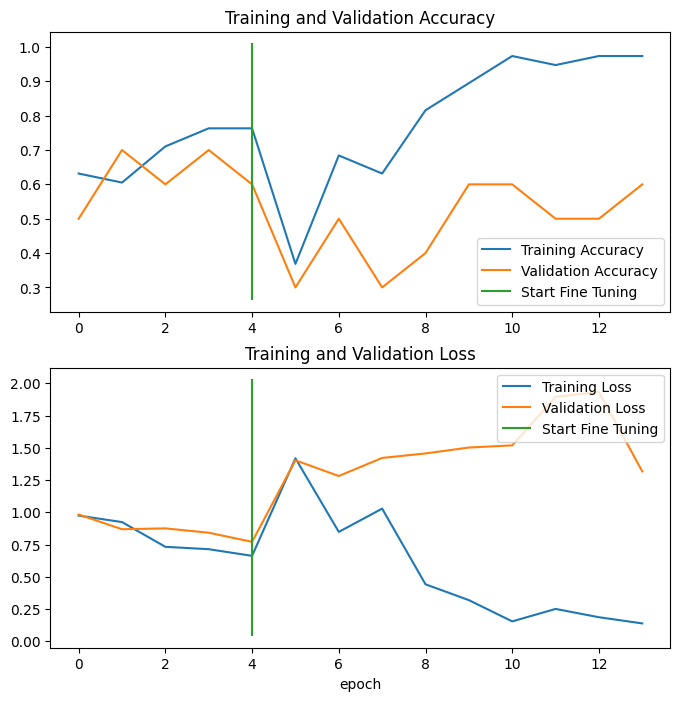

In [34]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
#plt.ylim([0.8, 1])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
#plt.ylim([0, 1.0])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

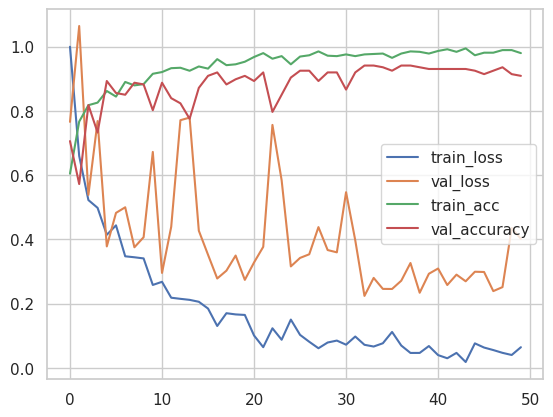

In [29]:
# plot the loss and accuracy curves
plt.plot(history_InceptionV3_ft.history['loss'], label='train_loss')
plt.plot(history_InceptionV3_ft.history['val_loss'], label='val_loss')
plt.plot(history_InceptionV3_ft.history['accuracy'], label='train_acc')
plt.plot(history_InceptionV3_ft.history['val_accuracy'], label='val_accuracy')
plt.legend()
plt.show()

In [33]:
y_pred = model.predict(X_test)

8/8 [==============================] - 6s 308ms/step


In [34]:
y_pred = np.argmax(y_pred, axis=1)
y_test = np.argmax(y_test, axis=1)

In [35]:
print('Classification Report InceptionV3:\n', classification_report(y_test, y_pred))

Classification Report InceptionV3:
               precision    recall  f1-score   support

           0       0.93      0.91      0.92        69
           1       0.93      0.95      0.94        65
           2       0.96      0.96      0.96        72
           3       0.89      0.86      0.87        28

    accuracy                           0.93       234
   macro avg       0.92      0.92      0.92       234
weighted avg       0.93      0.93      0.93       234



(array([0.5, 1.5, 2.5, 3.5]),
 [Text(0, 0.5, 'False Amaranth'),
  Text(0, 1.5, 'Horse Purslane'),
  Text(0, 2.5, 'Purple Nutsedge'),
  Text(0, 3.5, 'Wild Cucurbit')])

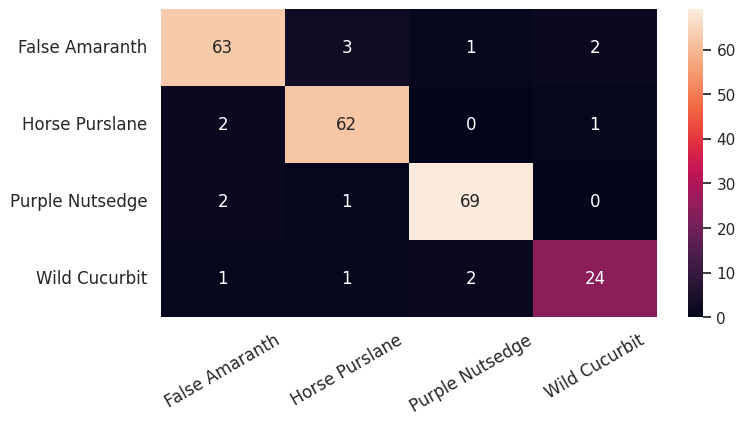

In [36]:
cm = confusion_matrix(y_test, y_pred)

class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']


plt.figure(figsize=(8, 4))
df_cm = pd.DataFrame(cm, index=class_names,
                     columns=class_names)
sns.set(font_scale=1.0)
sns.heatmap(df_cm, annot=True, annot_kws={"size": 12},  fmt='0.0f')
plt.xticks(rotation=30, fontsize=12)
plt.yticks(fontsize=12)

#plt.savefig('EV2_bo_ftNA_heatmap.png')

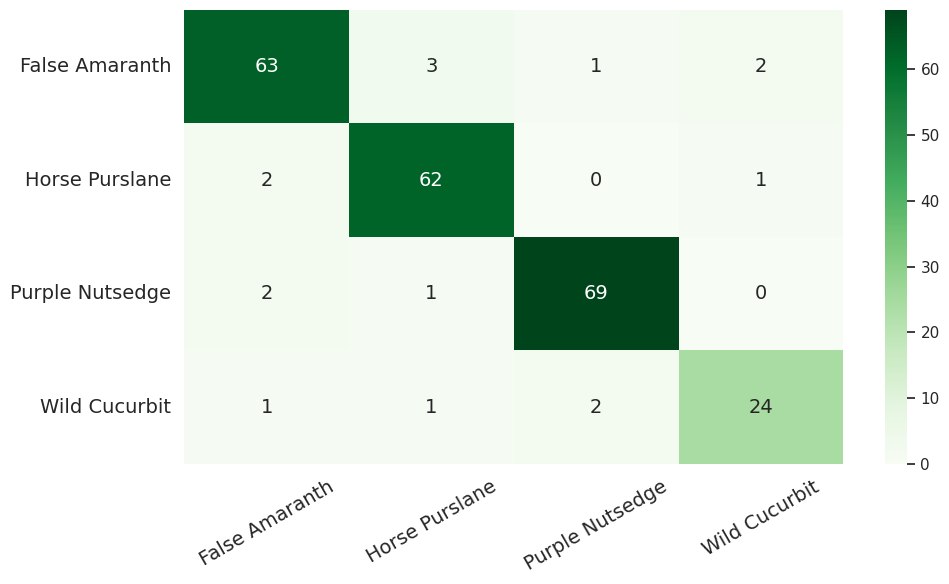

In [37]:
plt.figure(figsize=(8, 4))
conf_mat = cm / np.sum(cm, 1)
class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']

df_cm1 = pd.DataFrame(conf_mat, index=class_names,
                     columns=class_names)
#sns.set(font_scale=1.0)
sns.heatmap(df_cm1, annot=True, annot_kws={"size": 14}, cmap='Greens',  fmt='0.0f')

plt.xticks(rotation=20, fontsize=12)
plt.yticks(fontsize=12)

In [1]:
import pandas as pd

from decimal import Decimal


#df_cm1

for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], Decimal):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 2))
for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], float):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 1))            
df_cm1

NameError: name 'df_cm1' is not defined

In [38]:
model = get_architecture(y, Model_version="MobileNet", as_feature_extractor=True)

17225924/17225924 [==============================] - 0s 0us/step


In [39]:
model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv1 (Conv2D)              (None, 112, 112, 32)      864       
                                                                 
 conv1_bn (BatchNormalizati  (None, 112, 112, 32)      128       
 on)                                                             
                                                                 
 conv1_relu (ReLU)           (None, 112, 112, 32)      0         
                                                                 
 conv_dw_1 (DepthwiseConv2D  (None, 112, 112, 32)      288       
 )                                                               
                                                                 
 conv_dw_1_bn (BatchNormali  (None, 112, 112, 32)      128 

In [40]:
X_prep = tf.keras.applications.mobilenet_v3.preprocess_input(X)

X_train, X_test, y_train, y_test = train_test_split(
    X_prep,
    y,
    test_size=TEST_SPLIT,
    shuffle=True,
    stratify=y,
    random_state=RANDOM_STATE
)

X_train, X_val, y_train, y_val = train_test_split(
    X_train,
    y_train,
    test_size=VAL_SPLIT,
    shuffle=True,
    stratify=y_train,
    random_state=RANDOM_STATE,
)

In [41]:

history_MobileNet_fe = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=NUM_EPOCHS,
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, NUM_EPOCHS // 2, 0.25),
)
#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final MobileNet (Feature-Extractor) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 1/50
187/187 [==============================] - 13s 29ms/step - loss: 0.9227 - accuracy: 0.6501 - val_loss: 0.4116 - val_accuracy: 0.8663
Epoch 2/50
187/187 [==============================] - 5s 25ms/step - loss: 0.6156 - accuracy: 0.7775 - val_loss: 0.4730 - val_accuracy: 0.8289
Epoch 3/50
187/187 [==============================] - 4s 20ms/step - loss: 0.4778 - accuracy: 0.8391 - val_loss: 0.1663 - val_accuracy: 0.9412
Epoch 4/50
187/187 [==============================] - 4s 20ms/step - loss: 0.4161 - accuracy: 0.8432 - val_loss: 0.2847 - val_accuracy: 0.8984
Epoch 5/50
187/187 [==============================] - 4s 23ms/step - loss: 0.3535 - accuracy: 0.8807 - val_loss: 0.2256 - val_accuracy: 0.9358
Epoch 6/50
187/187 [==============================] - 4s 21ms/step - loss: 0.2614 - accuracy: 0.9008 - val_loss: 0.2514 - val_accuracy: 0.9037
Epoch 7/50
187/187 [==============================] - 4s 22ms/step - loss: 0.3207 - accuracy: 0.8794 - val_loss: 0.3080 - val_accuracy: 0.887

In [43]:
history_MobileNet_fe.history

{'loss': [0.9226855635643005,
  0.6155994534492493,
  0.477766752243042,
  0.4161275029182434,
  0.35349491238594055,
  0.26135963201522827,
  0.3207397162914276,
  0.2794039249420166,
  0.2775729298591614,
  0.24916651844978333,
  0.22340333461761475,
  0.1989755779504776,
  0.20911552011966705,
  0.15898002684116364,
  0.17887970805168152,
  0.1884429156780243,
  0.21418461203575134,
  0.13605406880378723,
  0.1169876903295517,
  0.09327211230993271,
  0.1440310925245285,
  0.18230821192264557,
  0.13005802035331726,
  0.11912175267934799,
  0.07466937601566315,
  0.1480678915977478,
  0.12943392992019653,
  0.06823279708623886,
  0.1178131029009819,
  0.062104202806949615,
  0.09911470115184784,
  0.13138505816459656,
  0.07989330589771271,
  0.06924665719270706],
 'accuracy': [0.6501340270042419,
  0.777479887008667,
  0.8391420841217041,
  0.8431635499000549,
  0.8806970715522766,
  0.9008042812347412,
  0.8793565630912781,
  0.9008042812347412,
  0.8967828154563904,
  0.923592507

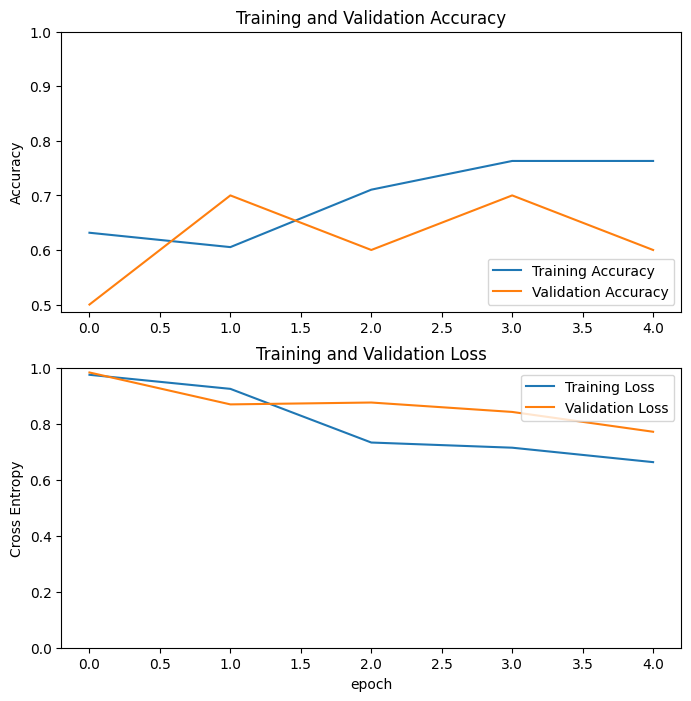

In [32]:
acc = history_MobileNet_fe.history['accuracy']
val_acc = history_MobileNet_fe.history['val_accuracy']

loss = history_MobileNet_fe.history['loss']
val_loss = history_MobileNet_fe.history['val_loss']

In [60]:
model = get_architecture(y, Model_version="MobileNet", as_feature_extractor=False)

In [25]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                           

 block_3_expand_relu (ReLU)     (None, 56, 56, 144)  0           ['block_3_expand_BN[0][0]']      
                                                                                                  
 block_3_pad (ZeroPadding2D)    (None, 57, 57, 144)  0           ['block_3_expand_relu[0][0]']    
                                                                                                  
 block_3_depthwise (DepthwiseCo  (None, 28, 28, 144)  1296       ['block_3_pad[0][0]']            
 nv2D)                                                                                            
                                                                                                  
 block_3_depthwise_BN (BatchNor  (None, 28, 28, 144)  576        ['block_3_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_3_d

 lization)                                                                                        
                                                                                                  
 block_7_expand (Conv2D)        (None, 14, 14, 384)  24576       ['block_6_project_BN[0][0]']     
                                                                                                  
 block_7_expand_BN (BatchNormal  (None, 14, 14, 384)  1536       ['block_7_expand[0][0]']         
 ization)                                                                                         
                                                                                                  
 block_7_expand_relu (ReLU)     (None, 14, 14, 384)  0           ['block_7_expand_BN[0][0]']      
                                                                                                  
 block_7_depthwise (DepthwiseCo  (None, 14, 14, 384)  3456       ['block_7_expand_relu[0][0]']    
 nv2D)    

                                                                                                  
 block_10_depthwise_relu (ReLU)  (None, 14, 14, 384)  0          ['block_10_depthwise_BN[0][0]']  
                                                                                                  
 block_10_project (Conv2D)      (None, 14, 14, 96)   36864       ['block_10_depthwise_relu[0][0]']
                                                                                                  
 block_10_project_BN (BatchNorm  (None, 14, 14, 96)  384         ['block_10_project[0][0]']       
 alization)                                                                                       
                                                                                                  
 block_11_expand (Conv2D)       (None, 14, 14, 576)  55296       ['block_10_project_BN[0][0]']    
                                                                                                  
 block_11_

 block_14_depthwise (DepthwiseC  (None, 7, 7, 960)   8640        ['block_14_expand_relu[0][0]']   
 onv2D)                                                                                           
                                                                                                  
 block_14_depthwise_BN (BatchNo  (None, 7, 7, 960)   3840        ['block_14_depthwise[0][0]']     
 rmalization)                                                                                     
                                                                                                  
 block_14_depthwise_relu (ReLU)  (None, 7, 7, 960)   0           ['block_14_depthwise_BN[0][0]']  
                                                                                                  
 block_14_project (Conv2D)      (None, 7, 7, 160)    153600      ['block_14_depthwise_relu[0][0]']
                                                                                                  
 block_14_

In [30]:

history_MobileNet_ft = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=total_epochs,
    initial_epoch = history_MobileNet_fe.epoch[-1],
    
    
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, total_epochs // 2, 0.25),
)

#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final MobileNet (Fine-Tune) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 5/15
10/10 [==============================] - 14s 948ms/step - loss: 1.4189 - accuracy: 0.3684 - val_loss: 1.4031 - val_accuracy: 0.3000
Epoch 6/15
10/10 [==============================] - 8s 843ms/step - loss: 0.8484 - accuracy: 0.6842 - val_loss: 1.2818 - val_accuracy: 0.5000
Epoch 7/15
10/10 [==============================] - 8s 758ms/step - loss: 1.0287 - accuracy: 0.6316 - val_loss: 1.4217 - val_accuracy: 0.3000
Epoch 8/15
10/10 [==============================] - 8s 787ms/step - loss: 0.4423 - accuracy: 0.8158 - val_loss: 1.4566 - val_accuracy: 0.4000
Epoch 9/15
10/10 [==============================] - 9s 927ms/step - loss: 0.3196 - accuracy: 0.8947 - val_loss: 1.5023 - val_accuracy: 0.6000
Epoch 10/15
10/10 [==============================] - 9s 867ms/step - loss: 0.1549 - accuracy: 0.9737 - val_loss: 1.5191 - val_accuracy: 0.6000
Epoch 11/15
10/10 [==============================] - 8s 784ms/step - loss: 0.2514 - accuracy: 0.9474 - val_loss: 1.8953 - val_accuracy: 0.5000
Epo

In [33]:
acc += history_MobileNet_ft.history['accuracy']
val_acc += history_MobileNet_ft.history['val_accuracy']

loss += history_MobileNet_ft.history['loss']
val_loss += history_MobileNet_ft.history['val_loss']

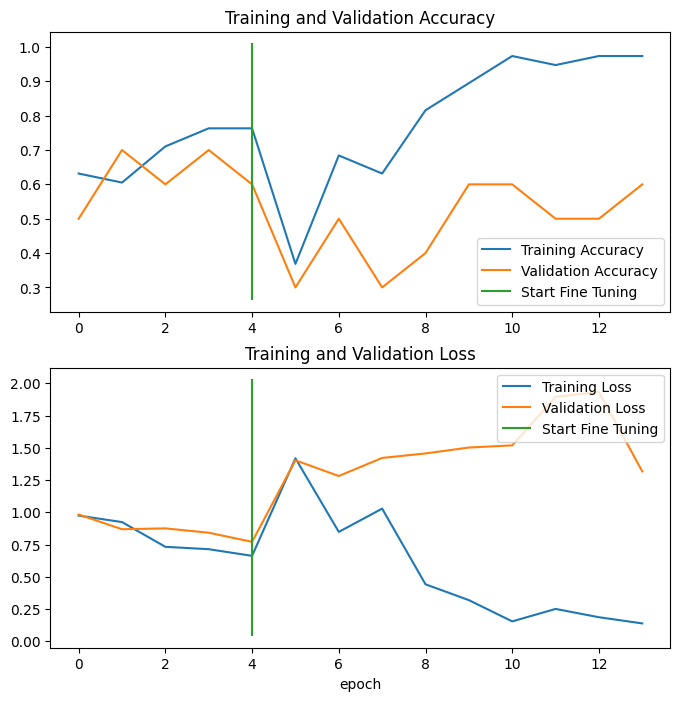

In [34]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
#plt.ylim([0.8, 1])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
#plt.ylim([0, 1.0])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

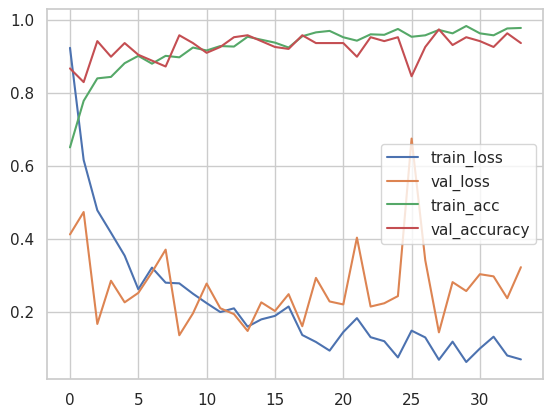

In [44]:
# plot the loss and accuracy curves
plt.plot(history_MobileNet_ft.history['loss'], label='train_loss')
plt.plot(history_MobileNet_ft.history['val_loss'], label='val_loss')
plt.plot(history_MobileNet_ft.history['accuracy'], label='train_acc')
plt.plot(history_MobileNet_ft.history['val_accuracy'], label='val_accuracy')
plt.legend()
plt.show()

In [48]:
y_pred = model.predict(X_test)

8/8 [==============================] - 2s 90ms/step


In [49]:
y_pred = np.argmax(y_pred, axis=1)
y_test = np.argmax(y_test, axis=1)

In [50]:
print('Classification Report MobileNet:\n', classification_report(y_test, y_pred))

Classification Report MobileNet:
               precision    recall  f1-score   support

           0       0.97      0.93      0.95        69
           1       0.95      0.97      0.96        65
           2       0.96      1.00      0.98        72
           3       0.93      0.89      0.91        28

    accuracy                           0.96       234
   macro avg       0.95      0.95      0.95       234
weighted avg       0.96      0.96      0.96       234



(array([0.5, 1.5, 2.5, 3.5]),
 [Text(0, 0.5, 'False Amaranth'),
  Text(0, 1.5, 'Horse Purslane'),
  Text(0, 2.5, 'Purple Nutsedge'),
  Text(0, 3.5, 'Wild Cucurbit')])

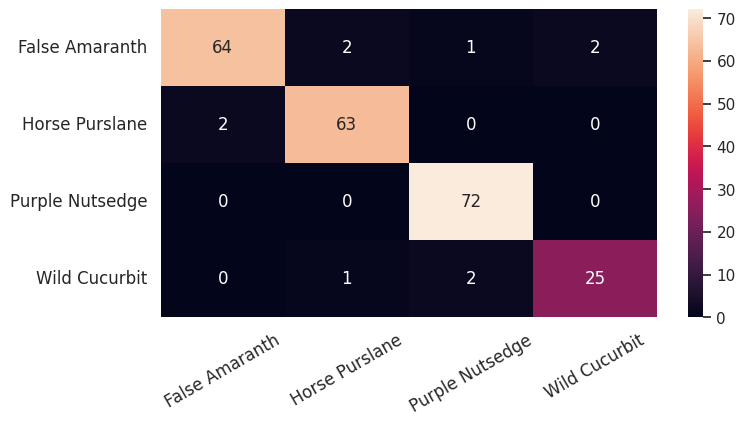

In [51]:
cm = confusion_matrix(y_test, y_pred)

class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']


plt.figure(figsize=(8, 4))
df_cm = pd.DataFrame(cm, index=class_names,
                     columns=class_names)
sns.set(font_scale=1.0)
sns.heatmap(df_cm, annot=True, annot_kws={"size": 12},  fmt='0.0f')
plt.xticks(rotation=30, fontsize=12)
plt.yticks(fontsize=12)

#plt.savefig('EV2_bo_ftNA_heatmap.png')

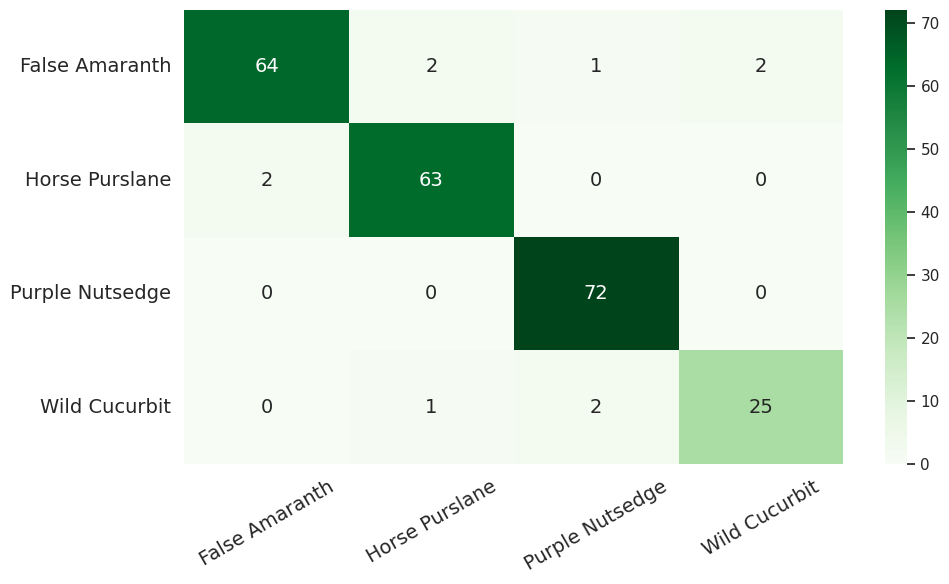

In [52]:
plt.figure(figsize=(8, 4))
conf_mat = cm / np.sum(cm, 1)
class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']

df_cm1 = pd.DataFrame(conf_mat, index=class_names,
                     columns=class_names)
#sns.set(font_scale=1.0)
sns.heatmap(df_cm1, annot=True, annot_kws={"size": 14}, cmap='Greens',  fmt='0.0f')

plt.xticks(rotation=20, fontsize=12)
plt.yticks(fontsize=12)

In [1]:
import pandas as pd

from decimal import Decimal


#df_cm1

for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], Decimal):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 2))
for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], float):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 1))            
df_cm1

NameError: name 'df_cm1' is not defined

In [38]:
model = get_architecture(y, Model_version="ResNet50", as_feature_extractor=True)

17225924/17225924 [==============================] - 0s 0us/step


In [39]:
model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv1 (Conv2D)              (None, 112, 112, 32)      864       
                                                                 
 conv1_bn (BatchNormalizati  (None, 112, 112, 32)      128       
 on)                                                             
                                                                 
 conv1_relu (ReLU)           (None, 112, 112, 32)      0         
                                                                 
 conv_dw_1 (DepthwiseConv2D  (None, 112, 112, 32)      288       
 )                                                               
                                                                 
 conv_dw_1_bn (BatchNormali  (None, 112, 112, 32)      128 

In [40]:
X_prep = tf.keras.applications.mobilenet_v3.preprocess_input(X)

X_train, X_test, y_train, y_test = train_test_split(
    X_prep,
    y,
    test_size=TEST_SPLIT,
    shuffle=True,
    stratify=y,
    random_state=RANDOM_STATE
)

X_train, X_val, y_train, y_val = train_test_split(
    X_train,
    y_train,
    test_size=VAL_SPLIT,
    shuffle=True,
    stratify=y_train,
    random_state=RANDOM_STATE,
)

In [41]:

history_ResNet50_fe = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=NUM_EPOCHS,
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, NUM_EPOCHS // 2, 0.25),
)
#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final ResNet50 (Feature-Extractor) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 1/50
187/187 [==============================] - 13s 29ms/step - loss: 0.9227 - accuracy: 0.6501 - val_loss: 0.4116 - val_accuracy: 0.8663
Epoch 2/50
187/187 [==============================] - 5s 25ms/step - loss: 0.6156 - accuracy: 0.7775 - val_loss: 0.4730 - val_accuracy: 0.8289
Epoch 3/50
187/187 [==============================] - 4s 20ms/step - loss: 0.4778 - accuracy: 0.8391 - val_loss: 0.1663 - val_accuracy: 0.9412
Epoch 4/50
187/187 [==============================] - 4s 20ms/step - loss: 0.4161 - accuracy: 0.8432 - val_loss: 0.2847 - val_accuracy: 0.8984
Epoch 5/50
187/187 [==============================] - 4s 23ms/step - loss: 0.3535 - accuracy: 0.8807 - val_loss: 0.2256 - val_accuracy: 0.9358
Epoch 6/50
187/187 [==============================] - 4s 21ms/step - loss: 0.2614 - accuracy: 0.9008 - val_loss: 0.2514 - val_accuracy: 0.9037
Epoch 7/50
187/187 [==============================] - 4s 22ms/step - loss: 0.3207 - accuracy: 0.8794 - val_loss: 0.3080 - val_accuracy: 0.887

In [43]:
history_ResNet50_fe.history

{'loss': [0.9226855635643005,
  0.6155994534492493,
  0.477766752243042,
  0.4161275029182434,
  0.35349491238594055,
  0.26135963201522827,
  0.3207397162914276,
  0.2794039249420166,
  0.2775729298591614,
  0.24916651844978333,
  0.22340333461761475,
  0.1989755779504776,
  0.20911552011966705,
  0.15898002684116364,
  0.17887970805168152,
  0.1884429156780243,
  0.21418461203575134,
  0.13605406880378723,
  0.1169876903295517,
  0.09327211230993271,
  0.1440310925245285,
  0.18230821192264557,
  0.13005802035331726,
  0.11912175267934799,
  0.07466937601566315,
  0.1480678915977478,
  0.12943392992019653,
  0.06823279708623886,
  0.1178131029009819,
  0.062104202806949615,
  0.09911470115184784,
  0.13138505816459656,
  0.07989330589771271,
  0.06924665719270706],
 'accuracy': [0.6501340270042419,
  0.777479887008667,
  0.8391420841217041,
  0.8431635499000549,
  0.8806970715522766,
  0.9008042812347412,
  0.8793565630912781,
  0.9008042812347412,
  0.8967828154563904,
  0.923592507

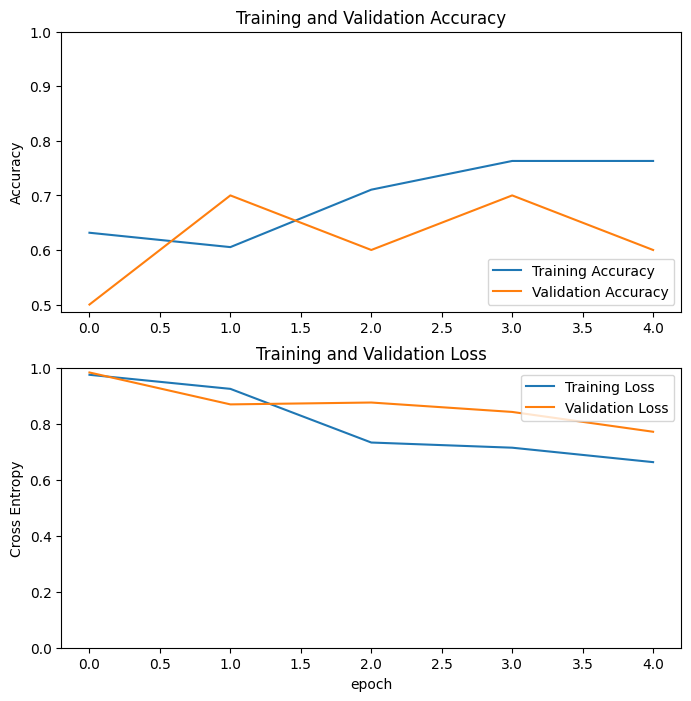

In [32]:
acc = history_ResNet50_fe.history['accuracy']
val_acc = history_ResNet50_fe.history['val_accuracy']

loss = history_ResNet50_fe.history['loss']
val_loss = history_ResNet50_fe.history['val_loss']

In [60]:
model = get_architecture(y, Model_version="ResNet50", as_feature_extractor=False)

In [25]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                           

 block_3_expand_relu (ReLU)     (None, 56, 56, 144)  0           ['block_3_expand_BN[0][0]']      
                                                                                                  
 block_3_pad (ZeroPadding2D)    (None, 57, 57, 144)  0           ['block_3_expand_relu[0][0]']    
                                                                                                  
 block_3_depthwise (DepthwiseCo  (None, 28, 28, 144)  1296       ['block_3_pad[0][0]']            
 nv2D)                                                                                            
                                                                                                  
 block_3_depthwise_BN (BatchNor  (None, 28, 28, 144)  576        ['block_3_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_3_d

 lization)                                                                                        
                                                                                                  
 block_7_expand (Conv2D)        (None, 14, 14, 384)  24576       ['block_6_project_BN[0][0]']     
                                                                                                  
 block_7_expand_BN (BatchNormal  (None, 14, 14, 384)  1536       ['block_7_expand[0][0]']         
 ization)                                                                                         
                                                                                                  
 block_7_expand_relu (ReLU)     (None, 14, 14, 384)  0           ['block_7_expand_BN[0][0]']      
                                                                                                  
 block_7_depthwise (DepthwiseCo  (None, 14, 14, 384)  3456       ['block_7_expand_relu[0][0]']    
 nv2D)    

                                                                                                  
 block_10_depthwise_relu (ReLU)  (None, 14, 14, 384)  0          ['block_10_depthwise_BN[0][0]']  
                                                                                                  
 block_10_project (Conv2D)      (None, 14, 14, 96)   36864       ['block_10_depthwise_relu[0][0]']
                                                                                                  
 block_10_project_BN (BatchNorm  (None, 14, 14, 96)  384         ['block_10_project[0][0]']       
 alization)                                                                                       
                                                                                                  
 block_11_expand (Conv2D)       (None, 14, 14, 576)  55296       ['block_10_project_BN[0][0]']    
                                                                                                  
 block_11_

 block_14_depthwise (DepthwiseC  (None, 7, 7, 960)   8640        ['block_14_expand_relu[0][0]']   
 onv2D)                                                                                           
                                                                                                  
 block_14_depthwise_BN (BatchNo  (None, 7, 7, 960)   3840        ['block_14_depthwise[0][0]']     
 rmalization)                                                                                     
                                                                                                  
 block_14_depthwise_relu (ReLU)  (None, 7, 7, 960)   0           ['block_14_depthwise_BN[0][0]']  
                                                                                                  
 block_14_project (Conv2D)      (None, 7, 7, 160)    153600      ['block_14_depthwise_relu[0][0]']
                                                                                                  
 block_14_

In [30]:

history_ResNet50_ft = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=total_epochs,
    initial_epoch = history_ResNet50_fe.epoch[-1],
    
    
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, total_epochs // 2, 0.25),
)

#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final ResNet50 (Fine-Tune) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 5/15
10/10 [==============================] - 14s 948ms/step - loss: 1.4189 - accuracy: 0.3684 - val_loss: 1.4031 - val_accuracy: 0.3000
Epoch 6/15
10/10 [==============================] - 8s 843ms/step - loss: 0.8484 - accuracy: 0.6842 - val_loss: 1.2818 - val_accuracy: 0.5000
Epoch 7/15
10/10 [==============================] - 8s 758ms/step - loss: 1.0287 - accuracy: 0.6316 - val_loss: 1.4217 - val_accuracy: 0.3000
Epoch 8/15
10/10 [==============================] - 8s 787ms/step - loss: 0.4423 - accuracy: 0.8158 - val_loss: 1.4566 - val_accuracy: 0.4000
Epoch 9/15
10/10 [==============================] - 9s 927ms/step - loss: 0.3196 - accuracy: 0.8947 - val_loss: 1.5023 - val_accuracy: 0.6000
Epoch 10/15
10/10 [==============================] - 9s 867ms/step - loss: 0.1549 - accuracy: 0.9737 - val_loss: 1.5191 - val_accuracy: 0.6000
Epoch 11/15
10/10 [==============================] - 8s 784ms/step - loss: 0.2514 - accuracy: 0.9474 - val_loss: 1.8953 - val_accuracy: 0.5000
Epo

In [33]:
acc += history_ResNet50_ft.history['accuracy']
val_acc += history_ResNet50_ft.history['val_accuracy']

loss += history_ResNet50_ft.history['loss']
val_loss += history_ResNet50_ft.history['val_loss']

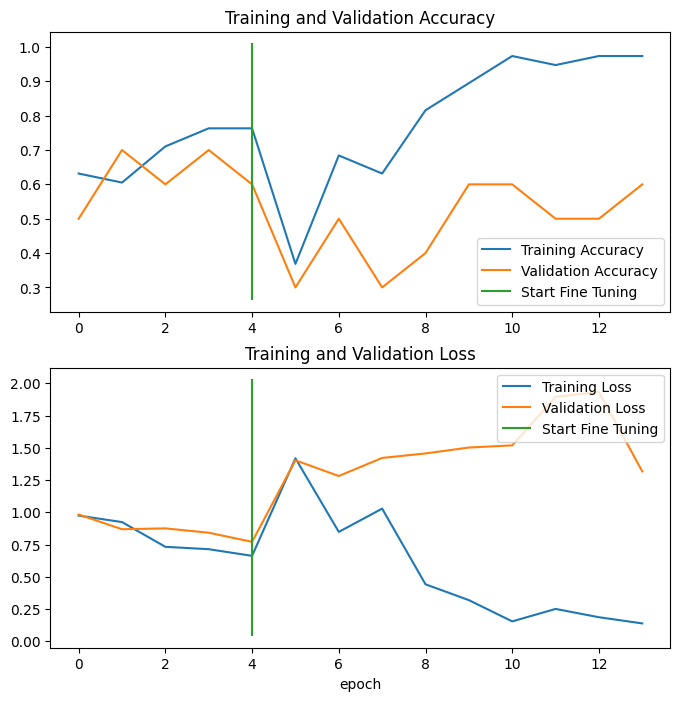

In [34]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
#plt.ylim([0.8, 1])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
#plt.ylim([0, 1.0])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

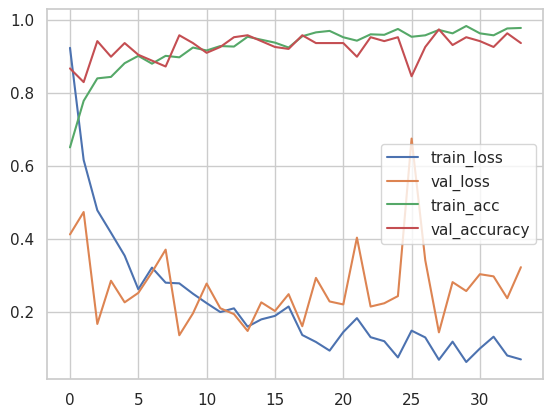

In [44]:
# plot the loss and accuracy curves
plt.plot(history_ResNet50_ft.history['loss'], label='train_loss')
plt.plot(history_ResNet50_ft.history['val_loss'], label='val_loss')
plt.plot(history_ResNet50_ft.history['accuracy'], label='train_acc')
plt.plot(history_ResNet50_ft.history['val_accuracy'], label='val_accuracy')
plt.legend()
plt.show()

In [48]:
y_pred = model.predict(X_test)

8/8 [==============================] - 2s 90ms/step


In [49]:
y_pred = np.argmax(y_pred, axis=1)
y_test = np.argmax(y_test, axis=1)

In [50]:
print('Classification Report ResNet50:\n', classification_report(y_test, y_pred))

Classification Report MobileNet:
               precision    recall  f1-score   support

           0       0.97      0.93      0.95        69
           1       0.95      0.97      0.96        65
           2       0.96      1.00      0.98        72
           3       0.93      0.89      0.91        28

    accuracy                           0.96       234
   macro avg       0.95      0.95      0.95       234
weighted avg       0.96      0.96      0.96       234



(array([0.5, 1.5, 2.5, 3.5]),
 [Text(0, 0.5, 'False Amaranth'),
  Text(0, 1.5, 'Horse Purslane'),
  Text(0, 2.5, 'Purple Nutsedge'),
  Text(0, 3.5, 'Wild Cucurbit')])

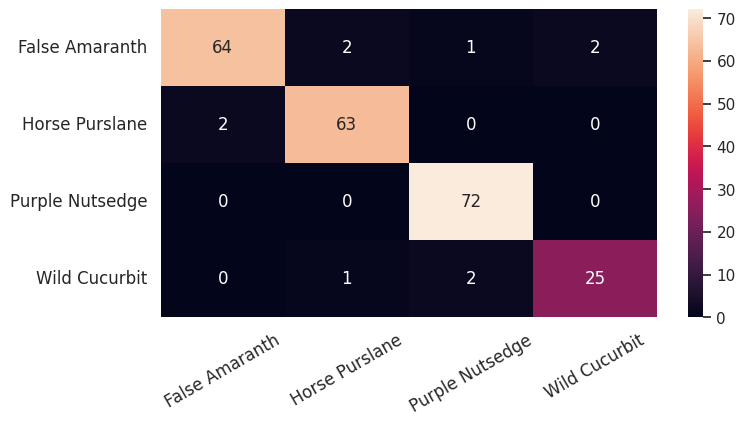

In [51]:
cm = confusion_matrix(y_test, y_pred)

class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']


plt.figure(figsize=(8, 4))
df_cm = pd.DataFrame(cm, index=class_names,
                     columns=class_names)
sns.set(font_scale=1.0)
sns.heatmap(df_cm, annot=True, annot_kws={"size": 12},  fmt='0.0f')
plt.xticks(rotation=30, fontsize=12)
plt.yticks(fontsize=12)

#plt.savefig('EV2_bo_ftNA_heatmap.png')

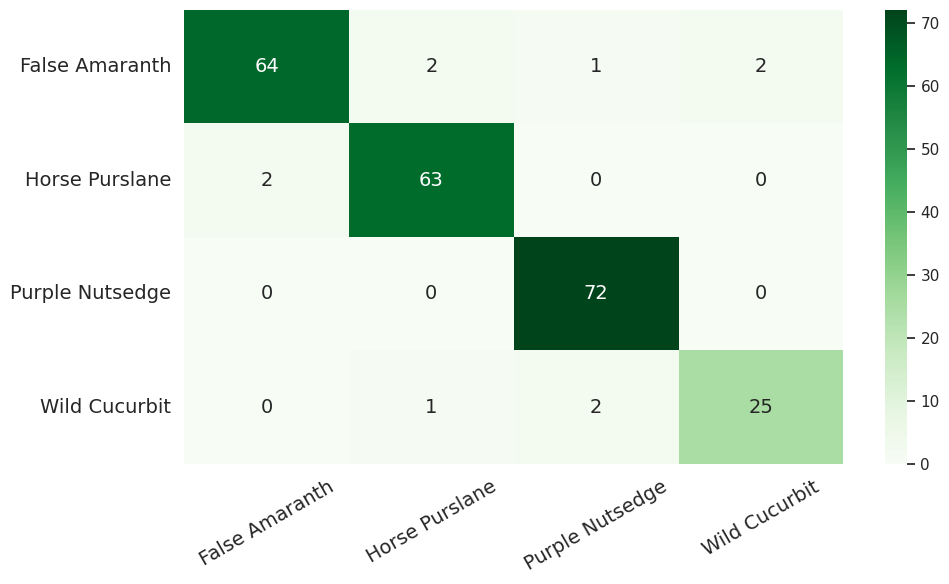

In [52]:
plt.figure(figsize=(8, 4))
conf_mat = cm / np.sum(cm, 1)
class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']

df_cm1 = pd.DataFrame(conf_mat, index=class_names,
                     columns=class_names)
#sns.set(font_scale=1.0)
sns.heatmap(df_cm1, annot=True, annot_kws={"size": 14}, cmap='Greens',  fmt='0.0f')

plt.xticks(rotation=20, fontsize=12)
plt.yticks(fontsize=12)

In [1]:
import pandas as pd

from decimal import Decimal


#df_cm1

for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], Decimal):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 2))
for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], float):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 1))            
df_cm1

NameError: name 'df_cm1' is not defined

In [38]:
model = get_architecture(y, Model_version="ResNet50V2", as_feature_extractor=True)

17225924/17225924 [==============================] - 0s 0us/step


In [39]:
model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv1 (Conv2D)              (None, 112, 112, 32)      864       
                                                                 
 conv1_bn (BatchNormalizati  (None, 112, 112, 32)      128       
 on)                                                             
                                                                 
 conv1_relu (ReLU)           (None, 112, 112, 32)      0         
                                                                 
 conv_dw_1 (DepthwiseConv2D  (None, 112, 112, 32)      288       
 )                                                               
                                                                 
 conv_dw_1_bn (BatchNormali  (None, 112, 112, 32)      128 

In [40]:
X_prep = tf.keras.applications.mobilenet_v3.preprocess_input(X)

X_train, X_test, y_train, y_test = train_test_split(
    X_prep,
    y,
    test_size=TEST_SPLIT,
    shuffle=True,
    stratify=y,
    random_state=RANDOM_STATE
)

X_train, X_val, y_train, y_val = train_test_split(
    X_train,
    y_train,
    test_size=VAL_SPLIT,
    shuffle=True,
    stratify=y_train,
    random_state=RANDOM_STATE,
)

In [41]:

history_ResNet50V2_fe = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=NUM_EPOCHS,
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, NUM_EPOCHS // 2, 0.25),
)
#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final ResNet50V2 (Feature-Extractor) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 1/50
187/187 [==============================] - 13s 29ms/step - loss: 0.9227 - accuracy: 0.6501 - val_loss: 0.4116 - val_accuracy: 0.8663
Epoch 2/50
187/187 [==============================] - 5s 25ms/step - loss: 0.6156 - accuracy: 0.7775 - val_loss: 0.4730 - val_accuracy: 0.8289
Epoch 3/50
187/187 [==============================] - 4s 20ms/step - loss: 0.4778 - accuracy: 0.8391 - val_loss: 0.1663 - val_accuracy: 0.9412
Epoch 4/50
187/187 [==============================] - 4s 20ms/step - loss: 0.4161 - accuracy: 0.8432 - val_loss: 0.2847 - val_accuracy: 0.8984
Epoch 5/50
187/187 [==============================] - 4s 23ms/step - loss: 0.3535 - accuracy: 0.8807 - val_loss: 0.2256 - val_accuracy: 0.9358
Epoch 6/50
187/187 [==============================] - 4s 21ms/step - loss: 0.2614 - accuracy: 0.9008 - val_loss: 0.2514 - val_accuracy: 0.9037
Epoch 7/50
187/187 [==============================] - 4s 22ms/step - loss: 0.3207 - accuracy: 0.8794 - val_loss: 0.3080 - val_accuracy: 0.887

In [43]:
history_ResNet50V2_fe.history

{'loss': [0.9226855635643005,
  0.6155994534492493,
  0.477766752243042,
  0.4161275029182434,
  0.35349491238594055,
  0.26135963201522827,
  0.3207397162914276,
  0.2794039249420166,
  0.2775729298591614,
  0.24916651844978333,
  0.22340333461761475,
  0.1989755779504776,
  0.20911552011966705,
  0.15898002684116364,
  0.17887970805168152,
  0.1884429156780243,
  0.21418461203575134,
  0.13605406880378723,
  0.1169876903295517,
  0.09327211230993271,
  0.1440310925245285,
  0.18230821192264557,
  0.13005802035331726,
  0.11912175267934799,
  0.07466937601566315,
  0.1480678915977478,
  0.12943392992019653,
  0.06823279708623886,
  0.1178131029009819,
  0.062104202806949615,
  0.09911470115184784,
  0.13138505816459656,
  0.07989330589771271,
  0.06924665719270706],
 'accuracy': [0.6501340270042419,
  0.777479887008667,
  0.8391420841217041,
  0.8431635499000549,
  0.8806970715522766,
  0.9008042812347412,
  0.8793565630912781,
  0.9008042812347412,
  0.8967828154563904,
  0.923592507

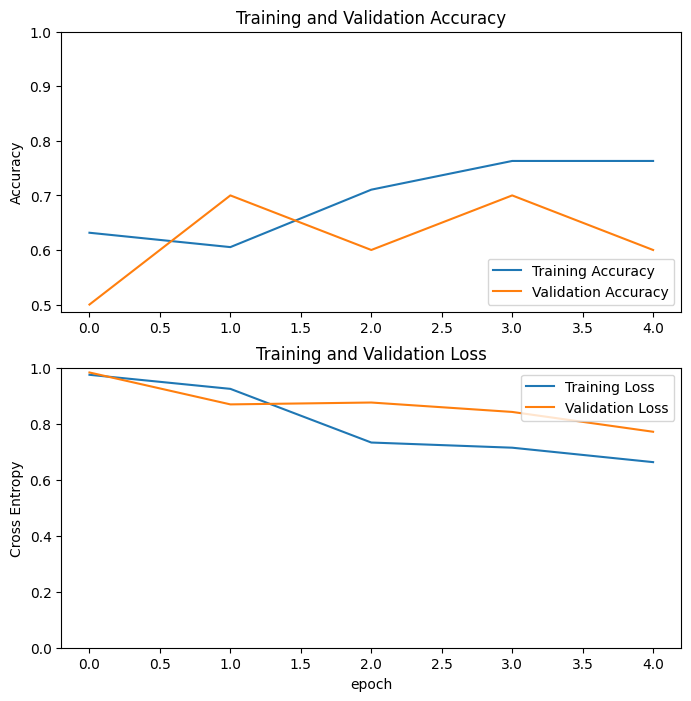

In [32]:
acc = history_ResNet50V2_fe.history['accuracy']
val_acc = history_ResNet50V2_fe.history['val_accuracy']

loss = history_ResNet50V2_fe.history['loss']
val_loss = history_ResNet50V2_fe.history['val_loss']

In [60]:
model = get_architecture(y, Model_version="ResNet50V2", as_feature_extractor=False)

In [25]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                           

 block_3_expand_relu (ReLU)     (None, 56, 56, 144)  0           ['block_3_expand_BN[0][0]']      
                                                                                                  
 block_3_pad (ZeroPadding2D)    (None, 57, 57, 144)  0           ['block_3_expand_relu[0][0]']    
                                                                                                  
 block_3_depthwise (DepthwiseCo  (None, 28, 28, 144)  1296       ['block_3_pad[0][0]']            
 nv2D)                                                                                            
                                                                                                  
 block_3_depthwise_BN (BatchNor  (None, 28, 28, 144)  576        ['block_3_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_3_d

 lization)                                                                                        
                                                                                                  
 block_7_expand (Conv2D)        (None, 14, 14, 384)  24576       ['block_6_project_BN[0][0]']     
                                                                                                  
 block_7_expand_BN (BatchNormal  (None, 14, 14, 384)  1536       ['block_7_expand[0][0]']         
 ization)                                                                                         
                                                                                                  
 block_7_expand_relu (ReLU)     (None, 14, 14, 384)  0           ['block_7_expand_BN[0][0]']      
                                                                                                  
 block_7_depthwise (DepthwiseCo  (None, 14, 14, 384)  3456       ['block_7_expand_relu[0][0]']    
 nv2D)    

                                                                                                  
 block_10_depthwise_relu (ReLU)  (None, 14, 14, 384)  0          ['block_10_depthwise_BN[0][0]']  
                                                                                                  
 block_10_project (Conv2D)      (None, 14, 14, 96)   36864       ['block_10_depthwise_relu[0][0]']
                                                                                                  
 block_10_project_BN (BatchNorm  (None, 14, 14, 96)  384         ['block_10_project[0][0]']       
 alization)                                                                                       
                                                                                                  
 block_11_expand (Conv2D)       (None, 14, 14, 576)  55296       ['block_10_project_BN[0][0]']    
                                                                                                  
 block_11_

 block_14_depthwise (DepthwiseC  (None, 7, 7, 960)   8640        ['block_14_expand_relu[0][0]']   
 onv2D)                                                                                           
                                                                                                  
 block_14_depthwise_BN (BatchNo  (None, 7, 7, 960)   3840        ['block_14_depthwise[0][0]']     
 rmalization)                                                                                     
                                                                                                  
 block_14_depthwise_relu (ReLU)  (None, 7, 7, 960)   0           ['block_14_depthwise_BN[0][0]']  
                                                                                                  
 block_14_project (Conv2D)      (None, 7, 7, 160)    153600      ['block_14_depthwise_relu[0][0]']
                                                                                                  
 block_14_

In [30]:

history_ResNet50V2_ft = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=total_epochs,
    initial_epoch = history_ResNet50V2_fe.epoch[-1],
    
    
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, total_epochs // 2, 0.25),
)

#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final ResNet50V2 (Fine-Tune) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 5/15
10/10 [==============================] - 14s 948ms/step - loss: 1.4189 - accuracy: 0.3684 - val_loss: 1.4031 - val_accuracy: 0.3000
Epoch 6/15
10/10 [==============================] - 8s 843ms/step - loss: 0.8484 - accuracy: 0.6842 - val_loss: 1.2818 - val_accuracy: 0.5000
Epoch 7/15
10/10 [==============================] - 8s 758ms/step - loss: 1.0287 - accuracy: 0.6316 - val_loss: 1.4217 - val_accuracy: 0.3000
Epoch 8/15
10/10 [==============================] - 8s 787ms/step - loss: 0.4423 - accuracy: 0.8158 - val_loss: 1.4566 - val_accuracy: 0.4000
Epoch 9/15
10/10 [==============================] - 9s 927ms/step - loss: 0.3196 - accuracy: 0.8947 - val_loss: 1.5023 - val_accuracy: 0.6000
Epoch 10/15
10/10 [==============================] - 9s 867ms/step - loss: 0.1549 - accuracy: 0.9737 - val_loss: 1.5191 - val_accuracy: 0.6000
Epoch 11/15
10/10 [==============================] - 8s 784ms/step - loss: 0.2514 - accuracy: 0.9474 - val_loss: 1.8953 - val_accuracy: 0.5000
Epo

In [33]:
acc += history_ResNet50V2_ft.history['accuracy']
val_acc += history_ResNet50V2_ft.history['val_accuracy']

loss += history_ResNet50V2_ft.history['loss']
val_loss += history_ResNet50V2_ft.history['val_loss']

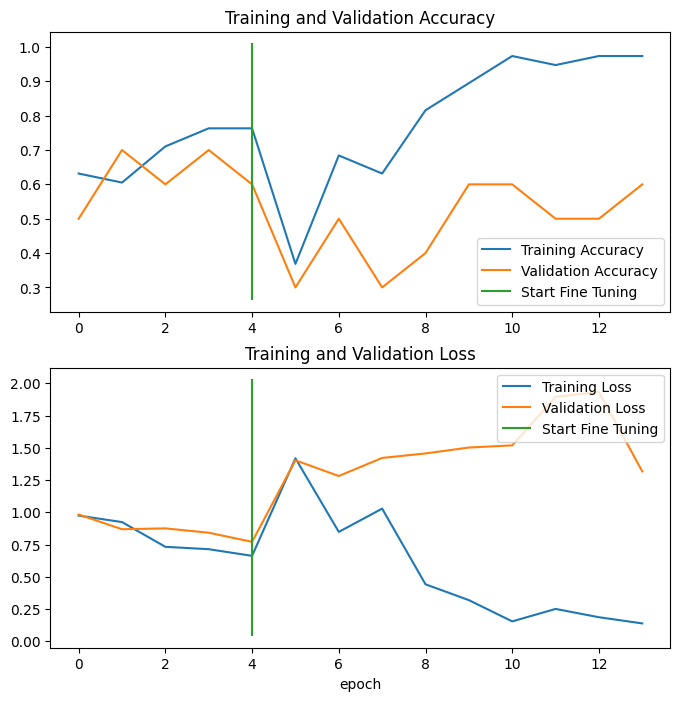

In [34]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
#plt.ylim([0.8, 1])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
#plt.ylim([0, 1.0])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

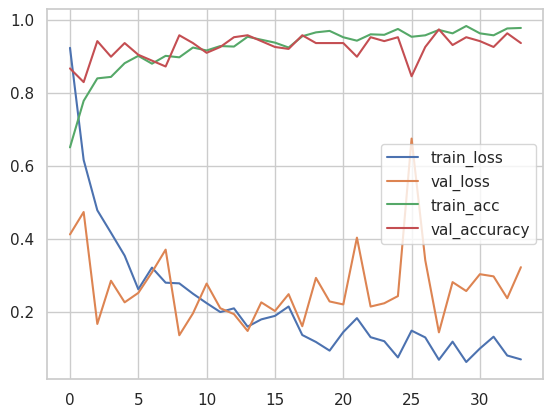

In [44]:
# plot the loss and accuracy curves
plt.plot(history_ResNet50V2_ft.history['loss'], label='train_loss')
plt.plot(history_ResNet50V2_ft.history['val_loss'], label='val_loss')
plt.plot(history_ResNet50V2_ft.history['accuracy'], label='train_acc')
plt.plot(history_ResNet50V2_ft.history['val_accuracy'], label='val_accuracy')
plt.legend()
plt.show()

In [48]:
y_pred = model.predict(X_test)

8/8 [==============================] - 2s 90ms/step


In [49]:
y_pred = np.argmax(y_pred, axis=1)
y_test = np.argmax(y_test, axis=1)

In [50]:
print('Classification Report ResNet50V2:\n', classification_report(y_test, y_pred))

Classification Report MobileNet:
               precision    recall  f1-score   support

           0       0.97      0.93      0.95        69
           1       0.95      0.97      0.96        65
           2       0.96      1.00      0.98        72
           3       0.93      0.89      0.91        28

    accuracy                           0.96       234
   macro avg       0.95      0.95      0.95       234
weighted avg       0.96      0.96      0.96       234



(array([0.5, 1.5, 2.5, 3.5]),
 [Text(0, 0.5, 'False Amaranth'),
  Text(0, 1.5, 'Horse Purslane'),
  Text(0, 2.5, 'Purple Nutsedge'),
  Text(0, 3.5, 'Wild Cucurbit')])

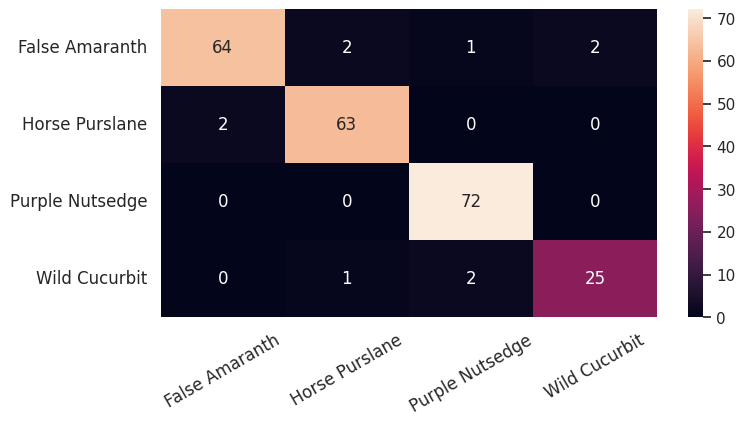

In [51]:
cm = confusion_matrix(y_test, y_pred)

class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']


plt.figure(figsize=(8, 4))
df_cm = pd.DataFrame(cm, index=class_names,
                     columns=class_names)
sns.set(font_scale=1.0)
sns.heatmap(df_cm, annot=True, annot_kws={"size": 12},  fmt='0.0f')
plt.xticks(rotation=30, fontsize=12)
plt.yticks(fontsize=12)

#plt.savefig('EV2_bo_ftNA_heatmap.png')

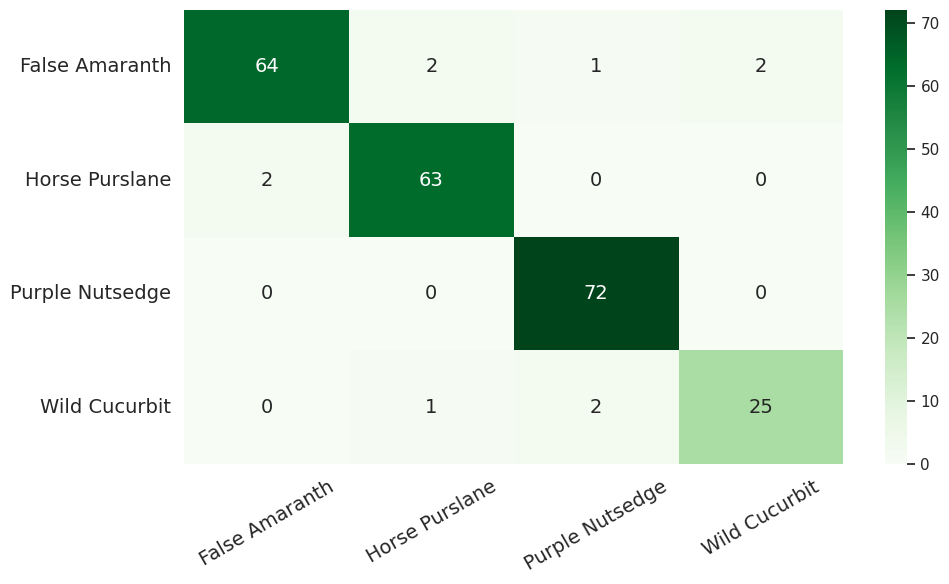

In [52]:
plt.figure(figsize=(8, 4))
conf_mat = cm / np.sum(cm, 1)
class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']

df_cm1 = pd.DataFrame(conf_mat, index=class_names,
                     columns=class_names)
#sns.set(font_scale=1.0)
sns.heatmap(df_cm1, annot=True, annot_kws={"size": 14}, cmap='Greens',  fmt='0.0f')

plt.xticks(rotation=20, fontsize=12)
plt.yticks(fontsize=12)

In [1]:
import pandas as pd

from decimal import Decimal


#df_cm1

for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], Decimal):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 2))
for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], float):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 1))            
df_cm1

NameError: name 'df_cm1' is not defined

In [38]:
model = get_architecture(y, Model_version="MobileNetV3Small", as_feature_extractor=True)

17225924/17225924 [==============================] - 0s 0us/step


In [39]:
model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv1 (Conv2D)              (None, 112, 112, 32)      864       
                                                                 
 conv1_bn (BatchNormalizati  (None, 112, 112, 32)      128       
 on)                                                             
                                                                 
 conv1_relu (ReLU)           (None, 112, 112, 32)      0         
                                                                 
 conv_dw_1 (DepthwiseConv2D  (None, 112, 112, 32)      288       
 )                                                               
                                                                 
 conv_dw_1_bn (BatchNormali  (None, 112, 112, 32)      128 

In [40]:
X_prep = tf.keras.applications.mobilenet_v3.preprocess_input(X)

X_train, X_test, y_train, y_test = train_test_split(
    X_prep,
    y,
    test_size=TEST_SPLIT,
    shuffle=True,
    stratify=y,
    random_state=RANDOM_STATE
)

X_train, X_val, y_train, y_val = train_test_split(
    X_train,
    y_train,
    test_size=VAL_SPLIT,
    shuffle=True,
    stratify=y_train,
    random_state=RANDOM_STATE,
)

In [41]:

history_MobileNetV3Small_fe = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=NUM_EPOCHS,
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, NUM_EPOCHS // 2, 0.25),
)
#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final MobileNetV3Small (Feature-Extractor) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 1/50
187/187 [==============================] - 13s 29ms/step - loss: 0.9227 - accuracy: 0.6501 - val_loss: 0.4116 - val_accuracy: 0.8663
Epoch 2/50
187/187 [==============================] - 5s 25ms/step - loss: 0.6156 - accuracy: 0.7775 - val_loss: 0.4730 - val_accuracy: 0.8289
Epoch 3/50
187/187 [==============================] - 4s 20ms/step - loss: 0.4778 - accuracy: 0.8391 - val_loss: 0.1663 - val_accuracy: 0.9412
Epoch 4/50
187/187 [==============================] - 4s 20ms/step - loss: 0.4161 - accuracy: 0.8432 - val_loss: 0.2847 - val_accuracy: 0.8984
Epoch 5/50
187/187 [==============================] - 4s 23ms/step - loss: 0.3535 - accuracy: 0.8807 - val_loss: 0.2256 - val_accuracy: 0.9358
Epoch 6/50
187/187 [==============================] - 4s 21ms/step - loss: 0.2614 - accuracy: 0.9008 - val_loss: 0.2514 - val_accuracy: 0.9037
Epoch 7/50
187/187 [==============================] - 4s 22ms/step - loss: 0.3207 - accuracy: 0.8794 - val_loss: 0.3080 - val_accuracy: 0.887

In [43]:
history_MobileNetV3Small_fe.history

{'loss': [0.9226855635643005,
  0.6155994534492493,
  0.477766752243042,
  0.4161275029182434,
  0.35349491238594055,
  0.26135963201522827,
  0.3207397162914276,
  0.2794039249420166,
  0.2775729298591614,
  0.24916651844978333,
  0.22340333461761475,
  0.1989755779504776,
  0.20911552011966705,
  0.15898002684116364,
  0.17887970805168152,
  0.1884429156780243,
  0.21418461203575134,
  0.13605406880378723,
  0.1169876903295517,
  0.09327211230993271,
  0.1440310925245285,
  0.18230821192264557,
  0.13005802035331726,
  0.11912175267934799,
  0.07466937601566315,
  0.1480678915977478,
  0.12943392992019653,
  0.06823279708623886,
  0.1178131029009819,
  0.062104202806949615,
  0.09911470115184784,
  0.13138505816459656,
  0.07989330589771271,
  0.06924665719270706],
 'accuracy': [0.6501340270042419,
  0.777479887008667,
  0.8391420841217041,
  0.8431635499000549,
  0.8806970715522766,
  0.9008042812347412,
  0.8793565630912781,
  0.9008042812347412,
  0.8967828154563904,
  0.923592507

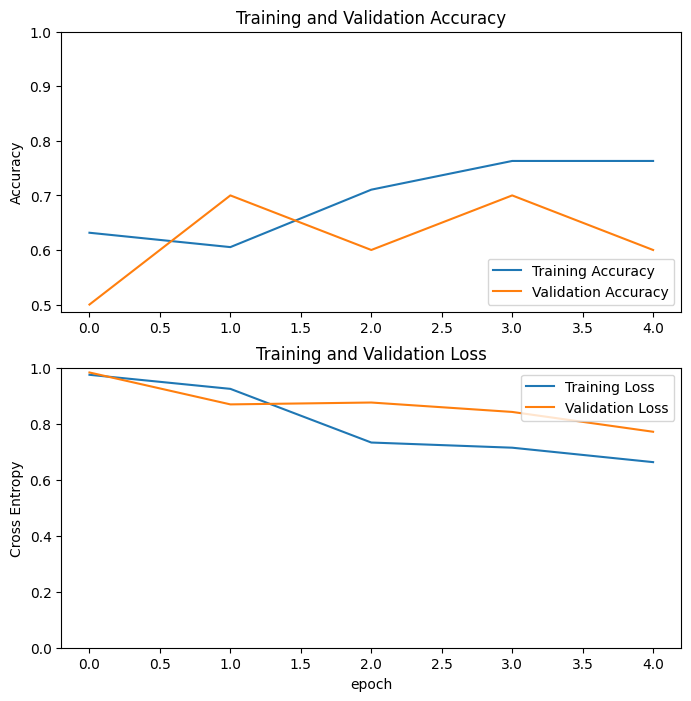

In [32]:
acc = history_MobileNetV3Small_fe.history['accuracy']
val_acc = history_MobileNetV3Small_fe.history['val_accuracy']

loss = history_MobileNetV3Small_fe.history['loss']
val_loss = history_MobileNetV3Small_fe.history['val_loss']

In [60]:
model = get_architecture(y, Model_version="MobileNetV3Small", as_feature_extractor=False)

In [25]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                           

 block_3_expand_relu (ReLU)     (None, 56, 56, 144)  0           ['block_3_expand_BN[0][0]']      
                                                                                                  
 block_3_pad (ZeroPadding2D)    (None, 57, 57, 144)  0           ['block_3_expand_relu[0][0]']    
                                                                                                  
 block_3_depthwise (DepthwiseCo  (None, 28, 28, 144)  1296       ['block_3_pad[0][0]']            
 nv2D)                                                                                            
                                                                                                  
 block_3_depthwise_BN (BatchNor  (None, 28, 28, 144)  576        ['block_3_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_3_d

 lization)                                                                                        
                                                                                                  
 block_7_expand (Conv2D)        (None, 14, 14, 384)  24576       ['block_6_project_BN[0][0]']     
                                                                                                  
 block_7_expand_BN (BatchNormal  (None, 14, 14, 384)  1536       ['block_7_expand[0][0]']         
 ization)                                                                                         
                                                                                                  
 block_7_expand_relu (ReLU)     (None, 14, 14, 384)  0           ['block_7_expand_BN[0][0]']      
                                                                                                  
 block_7_depthwise (DepthwiseCo  (None, 14, 14, 384)  3456       ['block_7_expand_relu[0][0]']    
 nv2D)    

                                                                                                  
 block_10_depthwise_relu (ReLU)  (None, 14, 14, 384)  0          ['block_10_depthwise_BN[0][0]']  
                                                                                                  
 block_10_project (Conv2D)      (None, 14, 14, 96)   36864       ['block_10_depthwise_relu[0][0]']
                                                                                                  
 block_10_project_BN (BatchNorm  (None, 14, 14, 96)  384         ['block_10_project[0][0]']       
 alization)                                                                                       
                                                                                                  
 block_11_expand (Conv2D)       (None, 14, 14, 576)  55296       ['block_10_project_BN[0][0]']    
                                                                                                  
 block_11_

 block_14_depthwise (DepthwiseC  (None, 7, 7, 960)   8640        ['block_14_expand_relu[0][0]']   
 onv2D)                                                                                           
                                                                                                  
 block_14_depthwise_BN (BatchNo  (None, 7, 7, 960)   3840        ['block_14_depthwise[0][0]']     
 rmalization)                                                                                     
                                                                                                  
 block_14_depthwise_relu (ReLU)  (None, 7, 7, 960)   0           ['block_14_depthwise_BN[0][0]']  
                                                                                                  
 block_14_project (Conv2D)      (None, 7, 7, 160)    153600      ['block_14_depthwise_relu[0][0]']
                                                                                                  
 block_14_

In [30]:

history_MobileNetV3Small_ft = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=total_epochs,
    initial_epoch = history_MobileNetV3Small_fe.epoch[-1],
    
    
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, total_epochs // 2, 0.25),
)

#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final MobileNetV3Small (Fine-Tune) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 5/15
10/10 [==============================] - 14s 948ms/step - loss: 1.4189 - accuracy: 0.3684 - val_loss: 1.4031 - val_accuracy: 0.3000
Epoch 6/15
10/10 [==============================] - 8s 843ms/step - loss: 0.8484 - accuracy: 0.6842 - val_loss: 1.2818 - val_accuracy: 0.5000
Epoch 7/15
10/10 [==============================] - 8s 758ms/step - loss: 1.0287 - accuracy: 0.6316 - val_loss: 1.4217 - val_accuracy: 0.3000
Epoch 8/15
10/10 [==============================] - 8s 787ms/step - loss: 0.4423 - accuracy: 0.8158 - val_loss: 1.4566 - val_accuracy: 0.4000
Epoch 9/15
10/10 [==============================] - 9s 927ms/step - loss: 0.3196 - accuracy: 0.8947 - val_loss: 1.5023 - val_accuracy: 0.6000
Epoch 10/15
10/10 [==============================] - 9s 867ms/step - loss: 0.1549 - accuracy: 0.9737 - val_loss: 1.5191 - val_accuracy: 0.6000
Epoch 11/15
10/10 [==============================] - 8s 784ms/step - loss: 0.2514 - accuracy: 0.9474 - val_loss: 1.8953 - val_accuracy: 0.5000
Epo

In [33]:
acc += history_MobileNetV3Small_ft.history['accuracy']
val_acc += history_MobileNetV3Small_ft.history['val_accuracy']

loss += history_MobileNetV3Small_ft.history['loss']
val_loss += history_MobileNetV3Small_ft.history['val_loss']

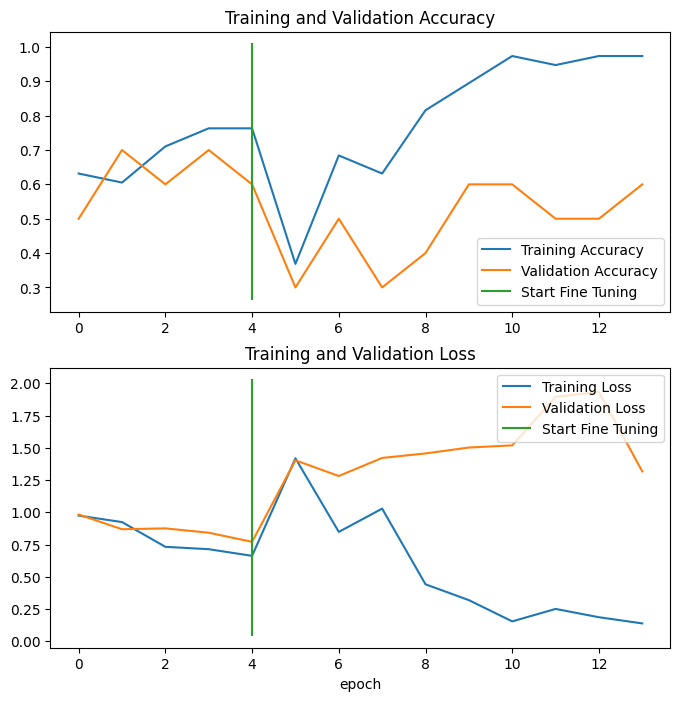

In [34]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
#plt.ylim([0.8, 1])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
#plt.ylim([0, 1.0])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

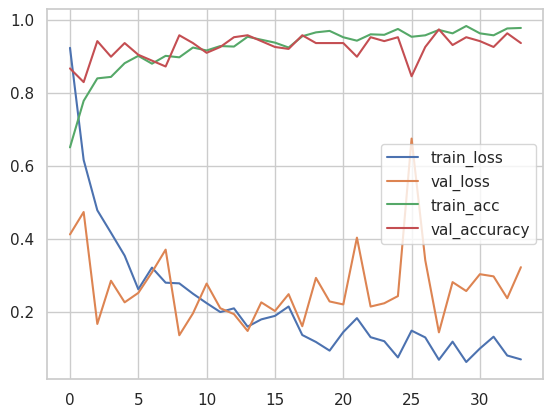

In [44]:
# plot the loss and accuracy curves
plt.plot(history_MobileNetV3Small_ft.history['loss'], label='train_loss')
plt.plot(history_MobileNetV3Small_ft.history['val_loss'], label='val_loss')
plt.plot(history_MobileNetV3Small_ft.history['accuracy'], label='train_acc')
plt.plot(history_MobileNetV3Small_ft.history['val_accuracy'], label='val_accuracy')
plt.legend()
plt.show()

In [48]:
y_pred = model.predict(X_test)

8/8 [==============================] - 2s 90ms/step


In [49]:
y_pred = np.argmax(y_pred, axis=1)
y_test = np.argmax(y_test, axis=1)

In [50]:
print('Classification Report MobileNetV3Small:\n', classification_report(y_test, y_pred))

Classification Report MobileNet:
               precision    recall  f1-score   support

           0       0.97      0.93      0.95        69
           1       0.95      0.97      0.96        65
           2       0.96      1.00      0.98        72
           3       0.93      0.89      0.91        28

    accuracy                           0.96       234
   macro avg       0.95      0.95      0.95       234
weighted avg       0.96      0.96      0.96       234



(array([0.5, 1.5, 2.5, 3.5]),
 [Text(0, 0.5, 'False Amaranth'),
  Text(0, 1.5, 'Horse Purslane'),
  Text(0, 2.5, 'Purple Nutsedge'),
  Text(0, 3.5, 'Wild Cucurbit')])

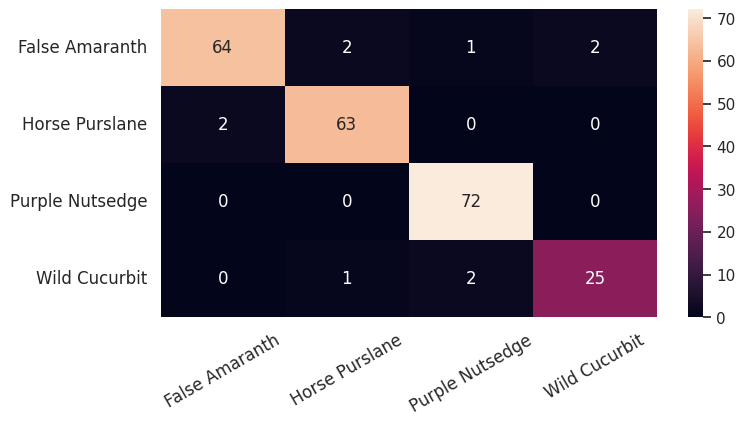

In [51]:
cm = confusion_matrix(y_test, y_pred)

class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']


plt.figure(figsize=(8, 4))
df_cm = pd.DataFrame(cm, index=class_names,
                     columns=class_names)
sns.set(font_scale=1.0)
sns.heatmap(df_cm, annot=True, annot_kws={"size": 12},  fmt='0.0f')
plt.xticks(rotation=30, fontsize=12)
plt.yticks(fontsize=12)

#plt.savefig('EV2_bo_ftNA_heatmap.png')

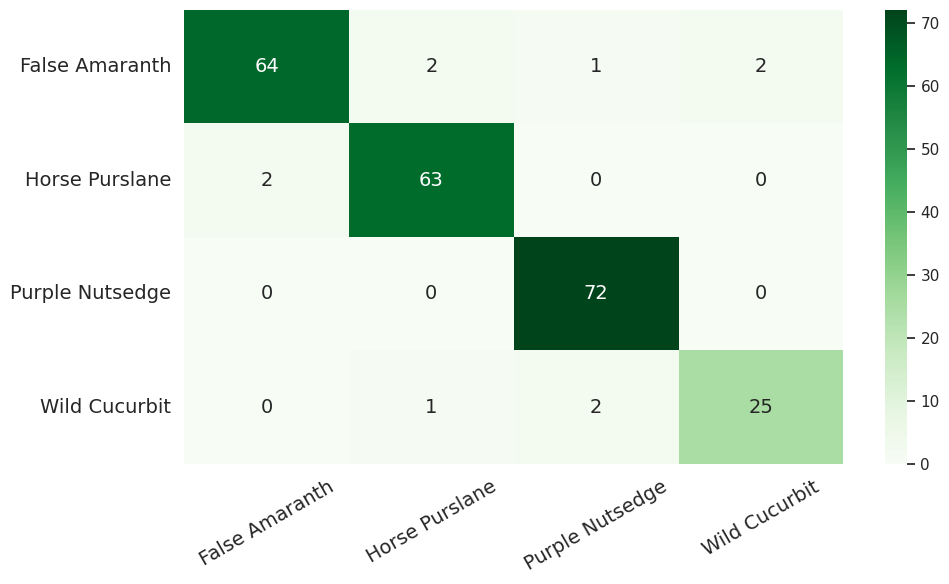

In [52]:
plt.figure(figsize=(8, 4))
conf_mat = cm / np.sum(cm, 1)
class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']

df_cm1 = pd.DataFrame(conf_mat, index=class_names,
                     columns=class_names)
#sns.set(font_scale=1.0)
sns.heatmap(df_cm1, annot=True, annot_kws={"size": 14}, cmap='Greens',  fmt='0.0f')

plt.xticks(rotation=20, fontsize=12)
plt.yticks(fontsize=12)

In [1]:
import pandas as pd

from decimal import Decimal


#df_cm1

for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], Decimal):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 2))
for col in df_cm1.columns:
        if isinstance(df_cm1[col].iloc[0], float):
            df_cm1[col] = df_cm1[col].apply(lambda x: round(x, 1))            
df_cm1

NameError: name 'df_cm1' is not defined

In [2]:
model = get_architecture(y, Model_version="MobileNetV3Large", as_feature_extractor=True)

NameError: name 'get_architecture' is not defined

In [39]:
model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv1 (Conv2D)              (None, 112, 112, 32)      864       
                                                                 
 conv1_bn (BatchNormalizati  (None, 112, 112, 32)      128       
 on)                                                             
                                                                 
 conv1_relu (ReLU)           (None, 112, 112, 32)      0         
                                                                 
 conv_dw_1 (DepthwiseConv2D  (None, 112, 112, 32)      288       
 )                                                               
                                                                 
 conv_dw_1_bn (BatchNormali  (None, 112, 112, 32)      128 

In [40]:
X_prep = tf.keras.applications.mobilenet_v3.preprocess_input(X)

X_train, X_test, y_train, y_test = train_test_split(
    X_prep,
    y,
    test_size=TEST_SPLIT,
    shuffle=True,
    stratify=y,
    random_state=RANDOM_STATE
)

X_train, X_val, y_train, y_val = train_test_split(
    X_train,
    y_train,
    test_size=VAL_SPLIT,
    shuffle=True,
    stratify=y_train,
    random_state=RANDOM_STATE,
)

In [41]:

history_MobileNetV3Large_fe = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=NUM_EPOCHS,
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, NUM_EPOCHS // 2, 0.25),
)
#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final MobileNetV3Large (Feature-Extractor) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 1/50
187/187 [==============================] - 13s 29ms/step - loss: 0.9227 - accuracy: 0.6501 - val_loss: 0.4116 - val_accuracy: 0.8663
Epoch 2/50
187/187 [==============================] - 5s 25ms/step - loss: 0.6156 - accuracy: 0.7775 - val_loss: 0.4730 - val_accuracy: 0.8289
Epoch 3/50
187/187 [==============================] - 4s 20ms/step - loss: 0.4778 - accuracy: 0.8391 - val_loss: 0.1663 - val_accuracy: 0.9412
Epoch 4/50
187/187 [==============================] - 4s 20ms/step - loss: 0.4161 - accuracy: 0.8432 - val_loss: 0.2847 - val_accuracy: 0.8984
Epoch 5/50
187/187 [==============================] - 4s 23ms/step - loss: 0.3535 - accuracy: 0.8807 - val_loss: 0.2256 - val_accuracy: 0.9358
Epoch 6/50
187/187 [==============================] - 4s 21ms/step - loss: 0.2614 - accuracy: 0.9008 - val_loss: 0.2514 - val_accuracy: 0.9037
Epoch 7/50
187/187 [==============================] - 4s 22ms/step - loss: 0.3207 - accuracy: 0.8794 - val_loss: 0.3080 - val_accuracy: 0.887

In [43]:
history_MobileNetV3Large_fe.history

{'loss': [0.9226855635643005,
  0.6155994534492493,
  0.477766752243042,
  0.4161275029182434,
  0.35349491238594055,
  0.26135963201522827,
  0.3207397162914276,
  0.2794039249420166,
  0.2775729298591614,
  0.24916651844978333,
  0.22340333461761475,
  0.1989755779504776,
  0.20911552011966705,
  0.15898002684116364,
  0.17887970805168152,
  0.1884429156780243,
  0.21418461203575134,
  0.13605406880378723,
  0.1169876903295517,
  0.09327211230993271,
  0.1440310925245285,
  0.18230821192264557,
  0.13005802035331726,
  0.11912175267934799,
  0.07466937601566315,
  0.1480678915977478,
  0.12943392992019653,
  0.06823279708623886,
  0.1178131029009819,
  0.062104202806949615,
  0.09911470115184784,
  0.13138505816459656,
  0.07989330589771271,
  0.06924665719270706],
 'accuracy': [0.6501340270042419,
  0.777479887008667,
  0.8391420841217041,
  0.8431635499000549,
  0.8806970715522766,
  0.9008042812347412,
  0.8793565630912781,
  0.9008042812347412,
  0.8967828154563904,
  0.923592507

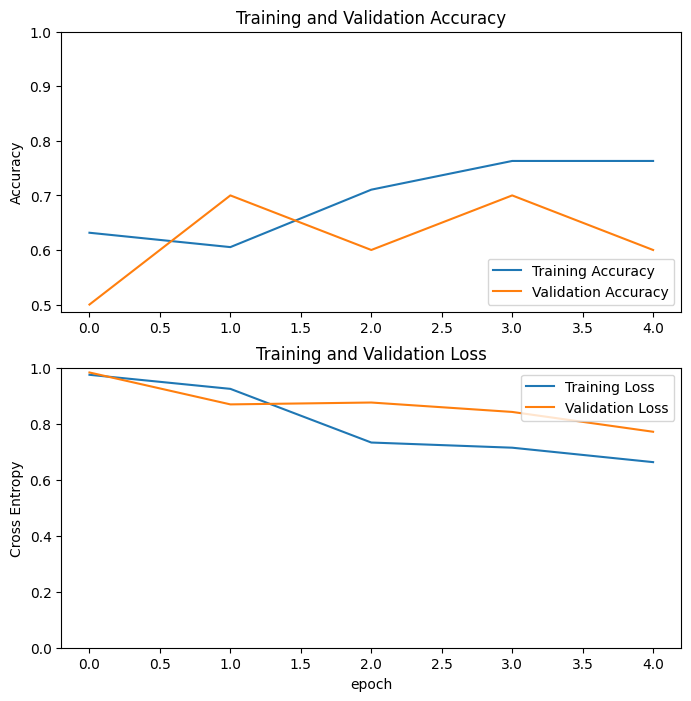

In [32]:
acc = history_MobileNetV3Large_fe.history['accuracy']
val_acc = history_MobileNetV3Large_fe.history['val_accuracy']

loss = history_MobileNetV3Large_fe.history['loss']
val_loss = history_MobileNetV3Large_fe.history['val_loss']

In [60]:
model = get_architecture(y, Model_version="MobileNetV3Large", as_feature_extractor=False)

In [25]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                           

 block_3_expand_relu (ReLU)     (None, 56, 56, 144)  0           ['block_3_expand_BN[0][0]']      
                                                                                                  
 block_3_pad (ZeroPadding2D)    (None, 57, 57, 144)  0           ['block_3_expand_relu[0][0]']    
                                                                                                  
 block_3_depthwise (DepthwiseCo  (None, 28, 28, 144)  1296       ['block_3_pad[0][0]']            
 nv2D)                                                                                            
                                                                                                  
 block_3_depthwise_BN (BatchNor  (None, 28, 28, 144)  576        ['block_3_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_3_d

 lization)                                                                                        
                                                                                                  
 block_7_expand (Conv2D)        (None, 14, 14, 384)  24576       ['block_6_project_BN[0][0]']     
                                                                                                  
 block_7_expand_BN (BatchNormal  (None, 14, 14, 384)  1536       ['block_7_expand[0][0]']         
 ization)                                                                                         
                                                                                                  
 block_7_expand_relu (ReLU)     (None, 14, 14, 384)  0           ['block_7_expand_BN[0][0]']      
                                                                                                  
 block_7_depthwise (DepthwiseCo  (None, 14, 14, 384)  3456       ['block_7_expand_relu[0][0]']    
 nv2D)    

                                                                                                  
 block_10_depthwise_relu (ReLU)  (None, 14, 14, 384)  0          ['block_10_depthwise_BN[0][0]']  
                                                                                                  
 block_10_project (Conv2D)      (None, 14, 14, 96)   36864       ['block_10_depthwise_relu[0][0]']
                                                                                                  
 block_10_project_BN (BatchNorm  (None, 14, 14, 96)  384         ['block_10_project[0][0]']       
 alization)                                                                                       
                                                                                                  
 block_11_expand (Conv2D)       (None, 14, 14, 576)  55296       ['block_10_project_BN[0][0]']    
                                                                                                  
 block_11_

 block_14_depthwise (DepthwiseC  (None, 7, 7, 960)   8640        ['block_14_expand_relu[0][0]']   
 onv2D)                                                                                           
                                                                                                  
 block_14_depthwise_BN (BatchNo  (None, 7, 7, 960)   3840        ['block_14_depthwise[0][0]']     
 rmalization)                                                                                     
                                                                                                  
 block_14_depthwise_relu (ReLU)  (None, 7, 7, 960)   0           ['block_14_depthwise_BN[0][0]']  
                                                                                                  
 block_14_project (Conv2D)      (None, 7, 7, 160)    153600      ['block_14_depthwise_relu[0][0]']
                                                                                                  
 block_14_

In [30]:

history_MobileNetV3Large_ft = model.fit(
    X_train,
    y_train,
    batch_size=BATCH_SIZE,
    epochs=total_epochs,
    initial_epoch = history_MobileNetV3Large_fe.epoch[-1],
    
    
    validation_data=(X_val, y_val),
    callbacks=get_callbacks(WEIGHTS_FILE, total_epochs // 2, 0.25),
)

#model.load_weights(WEIGHTS_FILE)
final_accuracy = model.evaluate(X_test, y_test, batch_size=1, verbose=0)[1]
print("*" * 72)
print(f"Final MobileNetV3Large (Fine-Tune) Accuracy: {final_accuracy}")
print("*" * 72)

Epoch 5/15
10/10 [==============================] - 14s 948ms/step - loss: 1.4189 - accuracy: 0.3684 - val_loss: 1.4031 - val_accuracy: 0.3000
Epoch 6/15
10/10 [==============================] - 8s 843ms/step - loss: 0.8484 - accuracy: 0.6842 - val_loss: 1.2818 - val_accuracy: 0.5000
Epoch 7/15
10/10 [==============================] - 8s 758ms/step - loss: 1.0287 - accuracy: 0.6316 - val_loss: 1.4217 - val_accuracy: 0.3000
Epoch 8/15
10/10 [==============================] - 8s 787ms/step - loss: 0.4423 - accuracy: 0.8158 - val_loss: 1.4566 - val_accuracy: 0.4000
Epoch 9/15
10/10 [==============================] - 9s 927ms/step - loss: 0.3196 - accuracy: 0.8947 - val_loss: 1.5023 - val_accuracy: 0.6000
Epoch 10/15
10/10 [==============================] - 9s 867ms/step - loss: 0.1549 - accuracy: 0.9737 - val_loss: 1.5191 - val_accuracy: 0.6000
Epoch 11/15
10/10 [==============================] - 8s 784ms/step - loss: 0.2514 - accuracy: 0.9474 - val_loss: 1.8953 - val_accuracy: 0.5000
Epo

In [33]:
acc += history_MobileNetV3Large_ft.history['accuracy']
val_acc += history_MobileNetV3Large_ft.history['val_accuracy']

loss += history_MobileNetV3Large_ft.history['loss']
val_loss += history_MobileNetV3Large_ft.history['val_loss']

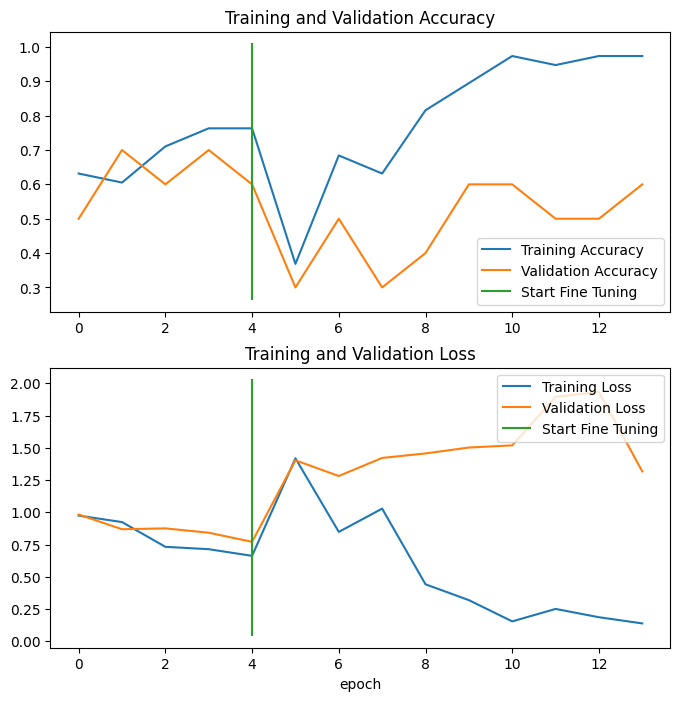

In [34]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
#plt.ylim([0.8, 1])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
#plt.ylim([0, 1.0])
plt.plot([NUM_EPOCHS-1,NUM_EPOCHS-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

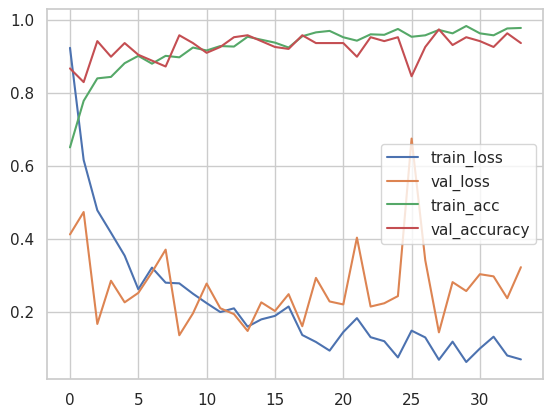

In [44]:
# plot the loss and accuracy curves
plt.plot(history_MobileNetV3Large_ft.history['loss'], label='train_loss')
plt.plot(history_MobileNetV3Large_ft.history['val_loss'], label='val_loss')
plt.plot(history_MobileNetV3Large_ft.history['accuracy'], label='train_acc')
plt.plot(history_MobileNetV3Large_ft.history['val_accuracy'], label='val_accuracy')
plt.legend()
plt.show()

In [48]:
y_pred = model.predict(X_test)

8/8 [==============================] - 2s 90ms/step


In [49]:
y_pred = np.argmax(y_pred, axis=1)
y_test = np.argmax(y_test, axis=1)

In [50]:
print('Classification Report MobileNetV3Large:\n', classification_report(y_test, y_pred))

Classification Report MobileNet:
               precision    recall  f1-score   support

           0       0.97      0.93      0.95        69
           1       0.95      0.97      0.96        65
           2       0.96      1.00      0.98        72
           3       0.93      0.89      0.91        28

    accuracy                           0.96       234
   macro avg       0.95      0.95      0.95       234
weighted avg       0.96      0.96      0.96       234



(array([0.5, 1.5, 2.5, 3.5]),
 [Text(0, 0.5, 'False Amaranth'),
  Text(0, 1.5, 'Horse Purslane'),
  Text(0, 2.5, 'Purple Nutsedge'),
  Text(0, 3.5, 'Wild Cucurbit')])

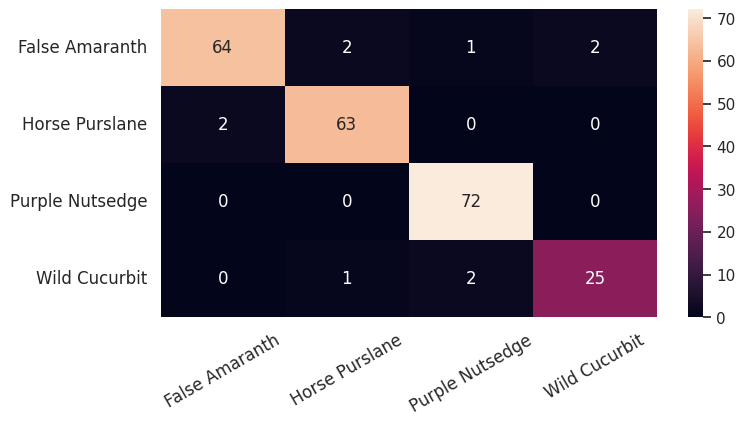

In [51]:
cm = confusion_matrix(y_test, y_pred)

class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']


plt.figure(figsize=(8, 4))
df_cm = pd.DataFrame(cm, index=class_names,
                     columns=class_names)
sns.set(font_scale=1.0)
sns.heatmap(df_cm, annot=True, annot_kws={"size": 12},  fmt='0.0f')
plt.xticks(rotation=30, fontsize=12)
plt.yticks(fontsize=12)

#plt.savefig('EV2_bo_ftNA_heatmap.png')

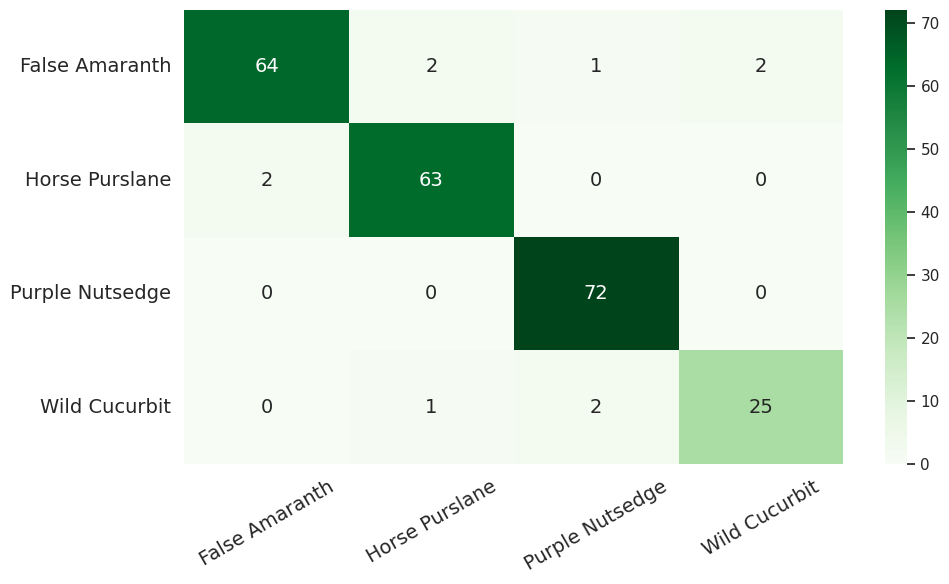

In [52]:
plt.figure(figsize=(8, 4))
conf_mat = cm / np.sum(cm, 1)
class_names = ['False Amaranth', 'Horse Purslane', 'Purple Nutsedge', 'Wild Cucurbit']

df_cm1 = pd.DataFrame(conf_mat, index=class_names,
                     columns=class_names)
#sns.set(font_scale=1.0)
sns.heatmap(df_cm1, annot=True, annot_kws={"size": 14}, cmap='Greens',  fmt='0.0f')

plt.xticks(rotation=20, fontsize=12)
plt.yticks(fontsize=12)